In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras.backend as ker
from tensorflow import keras
import keras_tuner as kt

2021-09-21 18:56:34.248884: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-09-21 18:56:34.248912: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Powiększenie domyślnych czcionek wykresów.

In [2]:
import matplotlib
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)

Ustawienie stałego sposobu generacji liczb losowych zapewnia powtarzalność rezultatów.

In [3]:
tf.random.set_seed(13)

In [78]:
train_data = pd.read_csv("spektra_full_data.csv")

In [79]:
train_data

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,985.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
1,597.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,14.36367,0.0,0.0,20.36367,0.0,0.0,0.0,21.363670,0.0
2,627.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,44.60562,12.605620,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
3,657.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,28.245655,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,5.245655,0.0
4,686.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
465,977.0,0.0120,0.0,0.00,0.00,1.00,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
466,977.0,0.0120,0.0,0.00,0.00,1.00,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
467,976.0,0.0022,0.0,0.78,0.21,0.01,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
468,948.0,0.0039,0.0,0.78,0.21,0.01,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0


# 1. Sieć A

Sieć A ma za zadanie przewidywać stężenia gazów tylko na podstawie widma - nie dajemy jej dostępu do danych na temat ciśnienia i napięcia polaryzacji struktury.

## 1.1. Wczytywanie danych

In [4]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

In [77]:
train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,940.0,0.0160,0.0,0.999001,0.0,0.0,0.000999,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372,1043.0,0.0050,0.0,0.000000,0.0,0.5,0.000000,0.5,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
373,1183.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
374,971.0,0.0120,0.0,0.952381,0.0,0.0,0.047619,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [80]:
train_concentrations = train_data.to_numpy()[:, 2:8]
train_spectrumsA = train_data.to_numpy()[:, 8:]

test_concentrations = test_data.to_numpy()[:, 2:8]
test_spectrumsA = test_data.to_numpy()[:, 8:]

# 1.2. Wstępny model

In [81]:
modelA = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048,)),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(64, activation='tanh'),
    tf.keras.layers.Dense(6, activation="sigmoid")
]
)

Definujemy zmodyfikowaną funkcję błędu omówioną w rozdziale 6.1.

In [83]:

def custom_loss(y_true, y_pred):
    mse = ker.mean(ker.square(y_true-y_pred), axis=-1)
    sum_constraint = ker.abs(ker.sum(y_pred, axis=-1) - 1)
    E2 = 0.8*ker.sum(ker.square(np.ones(6)-y_true) * ker.abs(y_true-y_true))
    return(mse+sum_constraint+E2)

Funkcja do przerwania nauki w momencie braku poleszenia na zbiorze testowym

In [275]:
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [93]:
modelA.compile(loss=custom_loss,
              optimizer='Adam',
              metrics=['mse'])

history = modelA.fit(train_spectrumsA,
                    train_concentrations,
                    epochs=100,
                    steps_per_epoch=10,
                    verbose = 2,
                    callbacks = [stop_learning],
                    validation_split = 0.2)

Epoch 1/100
10/10 - 1s - loss: 0.5002 - mse: 0.1086 - val_loss: 0.2585 - val_mse: 0.1267
Epoch 2/100
10/10 - 0s - loss: 0.1404 - mse: 0.0556 - val_loss: 0.1304 - val_mse: 0.0589
Epoch 3/100
10/10 - 0s - loss: 0.0856 - mse: 0.0361 - val_loss: 0.0842 - val_mse: 0.0513
Epoch 4/100
10/10 - 0s - loss: 0.0546 - mse: 0.0248 - val_loss: 0.0835 - val_mse: 0.0467
Epoch 5/100
10/10 - 0s - loss: 0.0375 - mse: 0.0202 - val_loss: 0.0589 - val_mse: 0.0348
Epoch 6/100
10/10 - 0s - loss: 0.0343 - mse: 0.0172 - val_loss: 0.0531 - val_mse: 0.0275
Epoch 7/100
10/10 - 0s - loss: 0.0300 - mse: 0.0151 - val_loss: 0.0505 - val_mse: 0.0243
Epoch 8/100
10/10 - 0s - loss: 0.0255 - mse: 0.0137 - val_loss: 0.0431 - val_mse: 0.0230
Epoch 9/100
10/10 - 0s - loss: 0.0205 - mse: 0.0129 - val_loss: 0.0389 - val_mse: 0.0222
Epoch 10/100
10/10 - 0s - loss: 0.0189 - mse: 0.0122 - val_loss: 0.0410 - val_mse: 0.0217
Epoch 11/100
10/10 - 0s - loss: 0.0175 - mse: 0.0119 - val_loss: 0.0430 - val_mse: 0.0221
Epoch 12/100
10/10 

In [95]:
modelA.evaluate(test_spectrumsA, test_concentrations)

3/3 [==============================] - 0s 4ms/step - loss: 0.0095 - mse: 0.0052


[0.0094748018309474, 0.00519722793251276]

In [97]:
def show_predictions(mod, spectrums, concentrations, index):
  fig = plt.figure(figsize=(20,6))  
  labels=["CO2", "N", "O", "Ar", "He", "Ne"]
  plt.subplot(1, 3, 3) 
  plt.grid(True)
  plt.title("Przewidywane stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  prediction = mod.predict(np.asarray([spectrums[index]]))[0]
  thisplot = plt.bar(labels,  prediction)
  plt.ylim([0, 1])
    
  plt.subplot(1, 3, 2)   
  plt.title("Widmo")
  plt.grid(True)
  plt.plot(wavelengths , spectrums[index], color="green")
  plt.subplot(1, 3, 1)   

  plt.grid(True)
  plt.title("Rzeczywiste stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  thisplot = plt.bar(labels,  concentrations[index], color="red")
  plt.ylim([0, 1])
    
  plt.tight_layout()
  plt.show()
  return fig

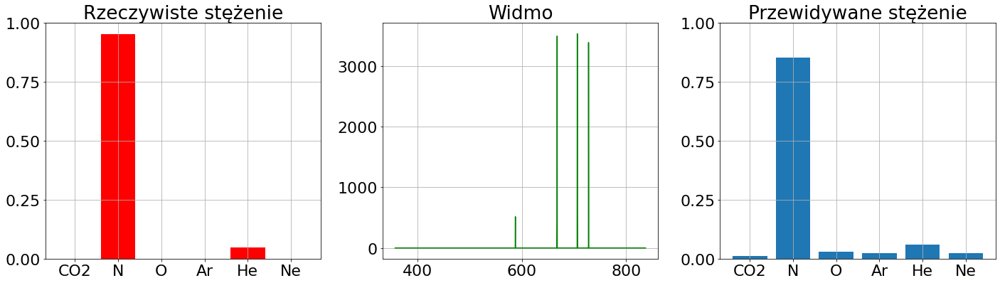

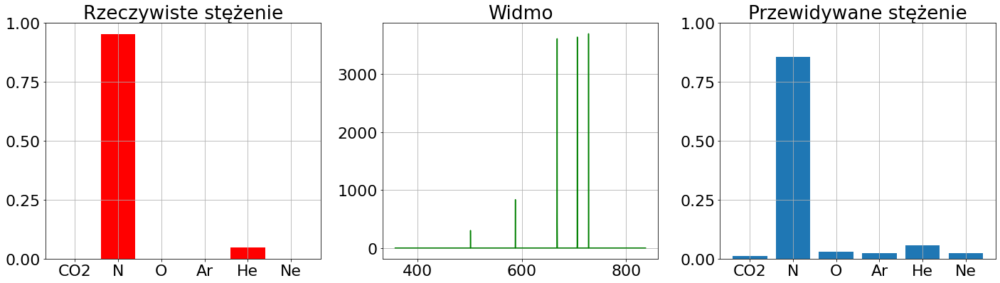

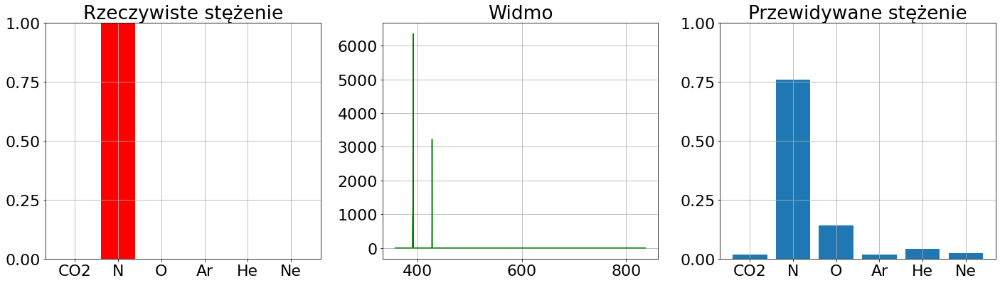

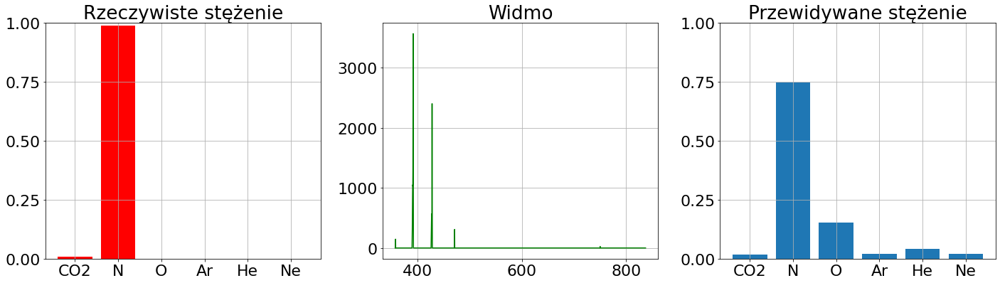

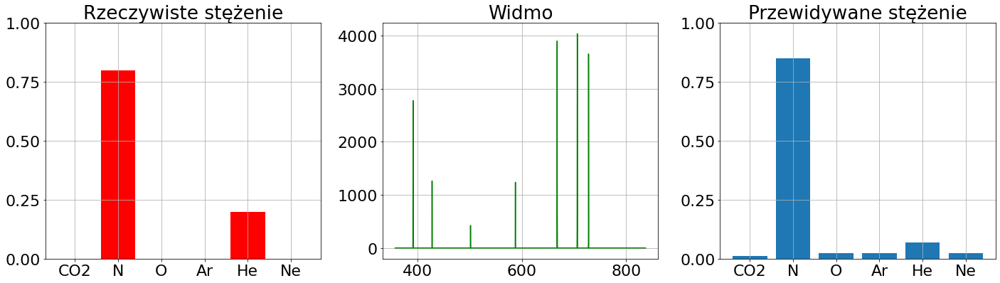

...

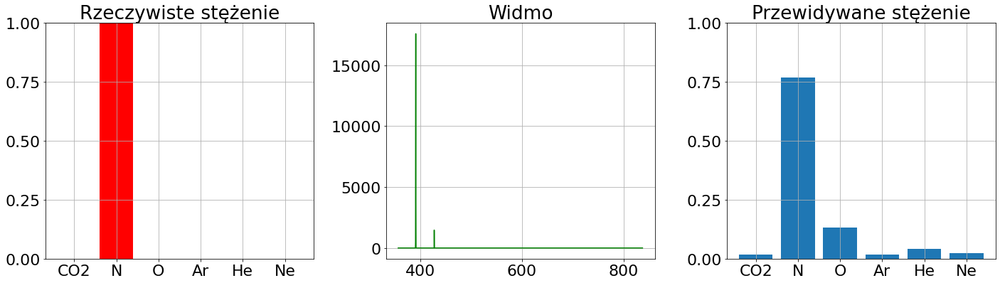

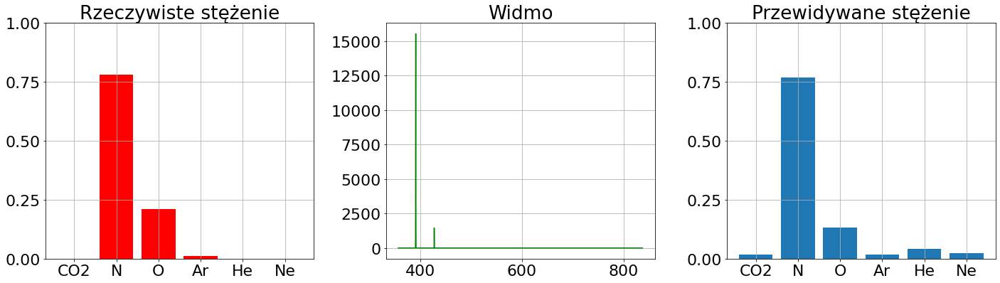

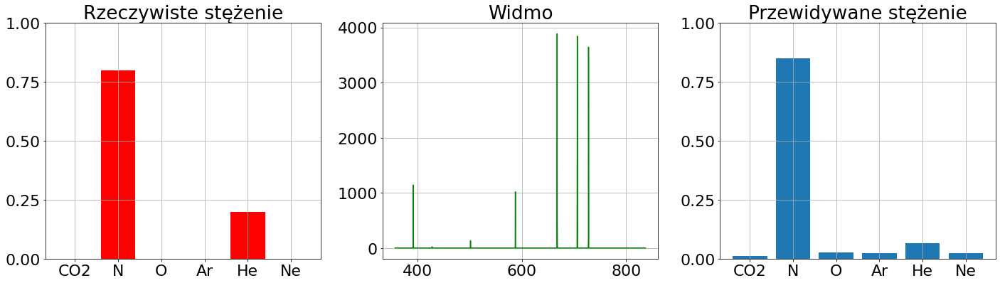

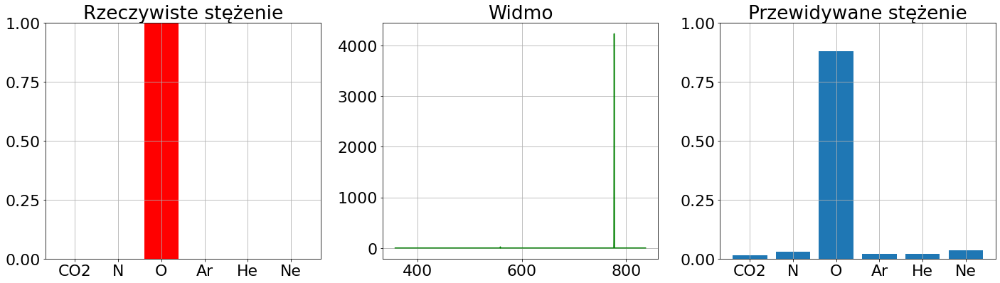

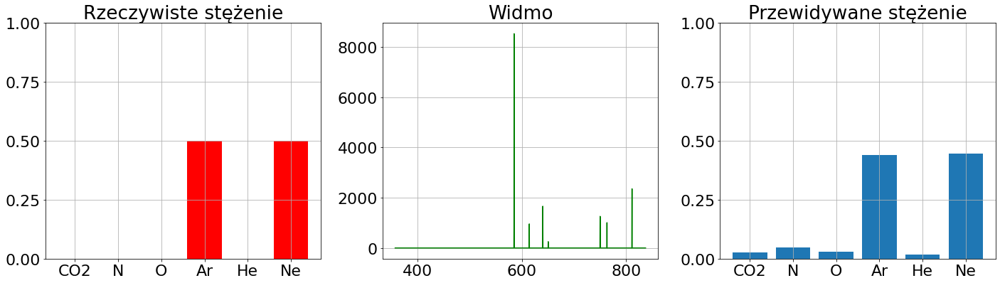

In [127]:
for i in range(test_spectrumsA.shape[0]):
    fig = show_predictions(modelA, test_spectrumsA, test_concentrations, i)

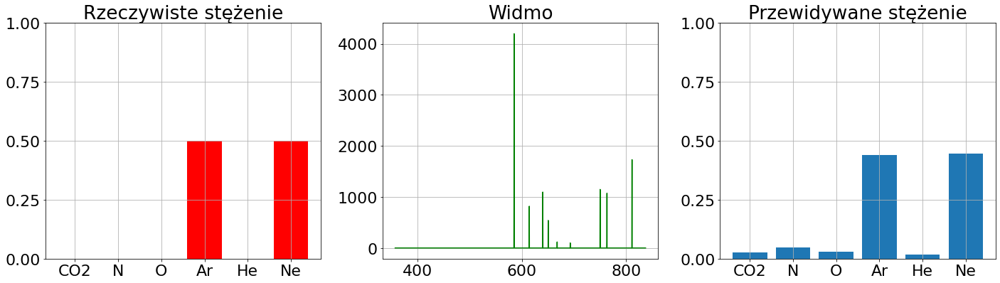

In [98]:
fig = show_predictions(modelA, test_spectrums, test_concentrations, 13)

In [241]:
fig.savefig('siec_A_przewidywania', dpi=fig.dpi)

## 1.3 Optymalizacja

In [99]:
def model_builder(hp):
  hp_units1 = hp.Int('units1', min_value=32, max_value=1028, step=8)
  hp_units2 = hp.Int('units2', min_value=32, max_value=512, step=8)
  hp_units3 = hp.Int('units3', min_value=32, max_value=256, step=8)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2048,)),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(hp_units3, activation='tanh'),
            tf.keras.layers.Dense(6, activation="sigmoid")])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2,1e-3, 1e-4, 1e-5]) 
  model.compile(loss=custom_loss,
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse'])

  return model

In [129]:
tuner = kt.Hyperband(model_builder,
                     objective='val_loss',
                     max_epochs=50,
                     factor=3,
                     directory='tunerA',
                     project_name='siecA')

In [320]:
tuner.search(train_spectrums,
             train_concentrations,
             epochs=50,
            steps_per_epoch=10,
             validation_split=0.2,
                    callbacks=[stop_learning])


best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 128 Complete [00h 00m 08s]
val_loss: 0.2685243487358093

Best val_loss So Far: 0.012559591792523861
Total elapsed time: 01h 44m 26s
INFO:tensorflow:Oracle triggered exit


In [322]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Liczba neuronów w warstwie 3: %d' % best_hps.get('units3'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 920
Liczba neuronów w warstwie 2: 176
Liczba neuronów w warstwie 3: 120
Współczynnik uczenia: 0.001000


In [323]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(train_spectrums,
                    train_concentrations,
                    steps_per_epoch=10,
                    epochs=200,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/200
10/10 [==============================] - 1s 35ms/step - loss: 0.4232 - mse: 0.0992 - val_loss: 0.1651 - val_mse: 0.0461
Epoch 2/200
10/10 [==============================] - 0s 28ms/step - loss: 0.0971 - mse: 0.0384 - val_loss: 0.0770 - val_mse: 0.0270
Epoch 3/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0530 - mse: 0.0280 - val_loss: 0.0452 - val_mse: 0.0209
Epoch 4/200
10/10 [==============================] - 0s 16ms/step - loss: 0.0393 - mse: 0.0235 - val_loss: 0.0319 - val_mse: 0.0166
Epoch 5/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0323 - mse: 0.0211 - val_loss: 0.0321 - val_mse: 0.0148
Epoch 6/200
10/10 [==============================] - 0s 17ms/step - loss: 0.0280 - mse: 0.0193 - val_loss: 0.0323 - val_mse: 0.0141
Epoch 7/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0330 - mse: 0.0184 - val_loss: 0.0296 - val_mse: 0.0130
Epoch 8/200
10/10 [==============================] - 0s 17ms/step - loss: 0.

10/10 [==============================] - 0s 21ms/step - loss: 0.0108 - mse: 0.0066 - val_loss: 0.0089 - val_mse: 0.0039
Epoch 63/200
10/10 [==============================] - 0s 26ms/step - loss: 0.0100 - mse: 0.0065 - val_loss: 0.0084 - val_mse: 0.0037
Epoch 64/200
10/10 [==============================] - 0s 21ms/step - loss: 0.0123 - mse: 0.0064 - val_loss: 0.0084 - val_mse: 0.0037
Epoch 65/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0124 - mse: 0.0065 - val_loss: 0.0081 - val_mse: 0.0039
Epoch 66/200
10/10 [==============================] - 0s 25ms/step - loss: 0.0121 - mse: 0.0067 - val_loss: 0.0113 - val_mse: 0.0038
Epoch 67/200
10/10 [==============================] - 0s 22ms/step - loss: 0.0125 - mse: 0.0065 - val_loss: 0.0087 - val_mse: 0.0036
Epoch 68/200
10/10 [==============================] - 0s 24ms/step - loss: 0.0125 - mse: 0.0063 - val_loss: 0.0092 - val_mse: 0.0037
Epoch 69/200
10/10 [==============================] - 0s 25ms/step - loss: 0.0115 

10/10 [==============================] - 0s 16ms/step - loss: 0.0110 - mse: 0.0056 - val_loss: 0.0059 - val_mse: 0.0032
Epoch 124/200
10/10 [==============================] - 0s 18ms/step - loss: 0.0082 - mse: 0.0058 - val_loss: 0.0068 - val_mse: 0.0033
Epoch 125/200
10/10 [==============================] - 0s 25ms/step - loss: 0.0086 - mse: 0.0056 - val_loss: 0.0068 - val_mse: 0.0033
Epoch 126/200
10/10 [==============================] - 0s 29ms/step - loss: 0.0086 - mse: 0.0056 - val_loss: 0.0074 - val_mse: 0.0032
Epoch 127/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0081 - mse: 0.0056 - val_loss: 0.0072 - val_mse: 0.0032
Epoch 128/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0083 - mse: 0.0055 - val_loss: 0.0066 - val_mse: 0.0031
Epoch 129/200
10/10 [==============================] - 0s 26ms/step - loss: 0.0087 - mse: 0.0055 - val_loss: 0.0065 - val_mse: 0.0031
Epoch 130/200
10/10 [==============================] - 0s 24ms/step - loss: 

Epoch 184/200
10/10 [==============================] - 0s 16ms/step - loss: 0.0093 - mse: 0.0054 - val_loss: 0.0085 - val_mse: 0.0034
Epoch 185/200
10/10 [==============================] - 0s 16ms/step - loss: 0.0100 - mse: 0.0054 - val_loss: 0.0065 - val_mse: 0.0032
Epoch 186/200
10/10 [==============================] - 0s 16ms/step - loss: 0.0099 - mse: 0.0053 - val_loss: 0.0071 - val_mse: 0.0034
Epoch 187/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0109 - mse: 0.0056 - val_loss: 0.0067 - val_mse: 0.0036
Epoch 188/200
10/10 [==============================] - 0s 19ms/step - loss: 0.0090 - mse: 0.0054 - val_loss: 0.0074 - val_mse: 0.0033
Epoch 189/200
10/10 [==============================] - 0s 19ms/step - loss: 0.0077 - mse: 0.0052 - val_loss: 0.0064 - val_mse: 0.0031
Epoch 190/200
10/10 [==============================] - 0s 20ms/step - loss: 0.0076 - mse: 0.0052 - val_loss: 0.0060 - val_mse: 0.0029
Epoch 191/200
10/10 [==============================] - 0s 20ms

In [326]:
print('Najlepsza liczba iteracji: %d' % (best_epoch,))

Najlepsza liczba iteracji: 172


In [327]:
model.evaluate(test_spectrums, test_concentrations)

3/3 [==============================] - 0s 5ms/step - loss: 0.0057 - mse: 0.0026


[0.005724810063838959, 0.0026005753315985203]

In [332]:
hypermodel = tuner.hypermodel.build(best_hps)

hypermodel.fit(train_spectrums, train_concentrations, epochs=best_epoch, validation_split=0.2)

Epoch 1/172
10/10 [==============================] - 1s 32ms/step - loss: 0.5282 - mse: 0.1243 - val_loss: 0.2144 - val_mse: 0.0861
Epoch 2/172
10/10 [==============================] - 0s 19ms/step - loss: 0.1233 - mse: 0.0575 - val_loss: 0.1019 - val_mse: 0.0358
Epoch 3/172
10/10 [==============================] - 0s 20ms/step - loss: 0.0694 - mse: 0.0338 - val_loss: 0.0685 - val_mse: 0.0236
Epoch 4/172
10/10 [==============================] - 0s 14ms/step - loss: 0.0494 - mse: 0.0254 - val_loss: 0.0520 - val_mse: 0.0183
Epoch 5/172
10/10 [==============================] - 0s 18ms/step - loss: 0.0366 - mse: 0.0217 - val_loss: 0.0468 - val_mse: 0.0151
Epoch 6/172
10/10 [==============================] - 0s 18ms/step - loss: 0.0360 - mse: 0.0192 - val_loss: 0.0373 - val_mse: 0.0143
Epoch 7/172
10/10 [==============================] - 0s 18ms/step - loss: 0.0356 - mse: 0.0171 - val_loss: 0.0431 - val_mse: 0.0125
Epoch 8/172
10/10 [==============================] - 0s 17ms/step - loss: 0.

10/10 [==============================] - 0s 27ms/step - loss: 0.0127 - mse: 0.0069 - val_loss: 0.0139 - val_mse: 0.0042
Epoch 63/172
10/10 [==============================] - 0s 29ms/step - loss: 0.0146 - mse: 0.0067 - val_loss: 0.0163 - val_mse: 0.0042
Epoch 64/172
10/10 [==============================] - 0s 25ms/step - loss: 0.0142 - mse: 0.0070 - val_loss: 0.0157 - val_mse: 0.0046
Epoch 65/172
10/10 [==============================] - 0s 31ms/step - loss: 0.0127 - mse: 0.0071 - val_loss: 0.0148 - val_mse: 0.0047
Epoch 66/172
10/10 [==============================] - 0s 27ms/step - loss: 0.0121 - mse: 0.0071 - val_loss: 0.0129 - val_mse: 0.0043
Epoch 67/172
10/10 [==============================] - 0s 27ms/step - loss: 0.0106 - mse: 0.0070 - val_loss: 0.0128 - val_mse: 0.0045
Epoch 68/172
10/10 [==============================] - 0s 29ms/step - loss: 0.0119 - mse: 0.0070 - val_loss: 0.0134 - val_mse: 0.0041
Epoch 69/172
10/10 [==============================] - 0s 22ms/step - loss: 0.0113 

10/10 [==============================] - 0s 24ms/step - loss: 0.0103 - mse: 0.0059 - val_loss: 0.0119 - val_mse: 0.0032
Epoch 124/172
10/10 [==============================] - 0s 21ms/step - loss: 0.0105 - mse: 0.0059 - val_loss: 0.0094 - val_mse: 0.0034
Epoch 125/172
10/10 [==============================] - 0s 21ms/step - loss: 0.0095 - mse: 0.0060 - val_loss: 0.0079 - val_mse: 0.0034
Epoch 126/172
10/10 [==============================] - 0s 25ms/step - loss: 0.0081 - mse: 0.0059 - val_loss: 0.0088 - val_mse: 0.0033
Epoch 127/172
10/10 [==============================] - 0s 19ms/step - loss: 0.0091 - mse: 0.0058 - val_loss: 0.0094 - val_mse: 0.0033
Epoch 128/172
10/10 [==============================] - 0s 21ms/step - loss: 0.0092 - mse: 0.0058 - val_loss: 0.0098 - val_mse: 0.0033
Epoch 129/172
10/10 [==============================] - 0s 23ms/step - loss: 0.0102 - mse: 0.0058 - val_loss: 0.0100 - val_mse: 0.0034
Epoch 130/172
10/10 [==============================] - 0s 23ms/step - loss: 

In [357]:
hypermodel.evaluate(test_spectrums, test_concentrations)

3/3 [==============================] - 0s 5ms/step - loss: 0.0117 - mse: 0.0027


[0.011670798994600773, 0.002746911020949483]

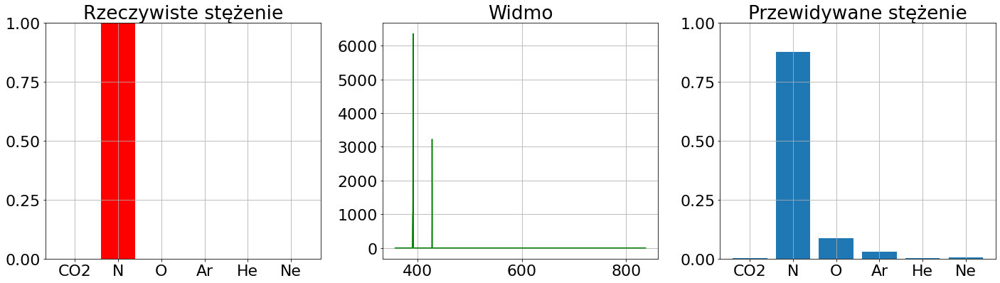

In [368]:
fig = show_predictions(model, test_spectrums, test_concentrations, 2)

In [369]:
fig.savefig('siec_A_przewidywania_bład', dpi=fig.dpi)

In [359]:
model.save('siecA.h5')

# 2. Sieć B

Sieć B ma założeniu brać pełne dane pomiarowe tj. widmo, ciśnienie oraz napięcie na strukturze to znajdowania stężenia gazu.

## 2.1. Dane

In [267]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

In [251]:
train_data["pressure"] = 1000*np.log(train_data["pressure"])
test_data["pressure"] = 1000*np.log( test_data["pressure"])

In [268]:
train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [153]:
train_concentrations = train_data.to_numpy()[:, 2:8]
train_spectrums_B = np.concatenate([train_data.to_numpy()[:, :2], train_data.to_numpy()[:, 8:]], axis=1)

test_concentrations = test_data.to_numpy()[:, 2:8]
test_spectrums_B = np.concatenate([test_data.to_numpy()[:, :2], test_data.to_numpy()[:, 8:]], axis=1)

## 2.2. Wstępny model

In [263]:
modelB = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048+2,)),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(128, activation='tanh'),
    tf.keras.layers.Dense(6, activation="sigmoid")
]
)

In [254]:
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 0.01*10**(-epoch/100))

In [255]:
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30)

In [264]:
modelB.compile(loss=custom_loss,
              optimizer='Adam',
              metrics=['mse'])

history = modelB.fit(train_spectrums_B,
                    train_concentrations,
                    epochs=500,
                    steps_per_epoch=10,
                    verbose = 2,
                    callbacks = [stop_learning, lr_scheduler],
                    validation_data = (test_spectrums_B, test_concentrations))

Epoch 1/500
10/10 - 1s - loss: 0.5192 - mse: 0.1034 - val_loss: 0.1494 - val_mse: 0.0935
Epoch 2/500
10/10 - 0s - loss: 0.1101 - mse: 0.0865 - val_loss: 0.1078 - val_mse: 0.1023
Epoch 3/500
10/10 - 0s - loss: 0.0945 - mse: 0.0895 - val_loss: 0.1078 - val_mse: 0.1027
Epoch 4/500
10/10 - 0s - loss: 0.0931 - mse: 0.0905 - val_loss: 0.1067 - val_mse: 0.1038
Epoch 5/500
10/10 - 0s - loss: 0.0921 - mse: 0.0908 - val_loss: 0.1051 - val_mse: 0.1044
Epoch 6/500
10/10 - 0s - loss: 0.0914 - mse: 0.0909 - val_loss: 0.1049 - val_mse: 0.1044
Epoch 7/500
10/10 - 0s - loss: 0.0913 - mse: 0.0908 - val_loss: 0.1046 - val_mse: 0.1042
Epoch 8/500
10/10 - 0s - loss: 0.0912 - mse: 0.0907 - val_loss: 0.1051 - val_mse: 0.1040
Epoch 9/500
10/10 - 0s - loss: 0.0914 - mse: 0.0906 - val_loss: 0.1044 - val_mse: 0.1039
Epoch 10/500
10/10 - 0s - loss: 0.0910 - mse: 0.0904 - val_loss: 0.1044 - val_mse: 0.1036
Epoch 11/500
10/10 - 0s - loss: 0.0910 - mse: 0.0902 - val_loss: 0.1039 - val_mse: 0.1034
Epoch 12/500
10/10 

10/10 - 0s - loss: 0.0295 - mse: 0.0254 - val_loss: 0.0395 - val_mse: 0.0361
Epoch 93/500
10/10 - 0s - loss: 0.0297 - mse: 0.0254 - val_loss: 0.0416 - val_mse: 0.0360
Epoch 94/500
10/10 - 0s - loss: 0.0293 - mse: 0.0254 - val_loss: 0.0426 - val_mse: 0.0366
Epoch 95/500
10/10 - 0s - loss: 0.0294 - mse: 0.0254 - val_loss: 0.0384 - val_mse: 0.0361
Epoch 96/500
10/10 - 0s - loss: 0.0287 - mse: 0.0253 - val_loss: 0.0399 - val_mse: 0.0361
Epoch 97/500
10/10 - 0s - loss: 0.0287 - mse: 0.0253 - val_loss: 0.0418 - val_mse: 0.0360
Epoch 98/500
10/10 - 0s - loss: 0.0294 - mse: 0.0253 - val_loss: 0.0399 - val_mse: 0.0360
Epoch 99/500
10/10 - 0s - loss: 0.0276 - mse: 0.0253 - val_loss: 0.0384 - val_mse: 0.0361
Epoch 100/500
10/10 - 0s - loss: 0.0274 - mse: 0.0253 - val_loss: 0.0387 - val_mse: 0.0362
Epoch 101/500
10/10 - 0s - loss: 0.0285 - mse: 0.0252 - val_loss: 0.0417 - val_mse: 0.0362
Epoch 102/500
10/10 - 0s - loss: 0.0283 - mse: 0.0252 - val_loss: 0.0392 - val_mse: 0.0361
Epoch 103/500
10/10 

Epoch 183/500
10/10 - 0s - loss: 0.0251 - mse: 0.0243 - val_loss: 0.0362 - val_mse: 0.0356
Epoch 184/500
10/10 - 0s - loss: 0.0248 - mse: 0.0243 - val_loss: 0.0365 - val_mse: 0.0356
Epoch 185/500
10/10 - 0s - loss: 0.0250 - mse: 0.0242 - val_loss: 0.0361 - val_mse: 0.0356
Epoch 186/500
10/10 - 1s - loss: 0.0246 - mse: 0.0242 - val_loss: 0.0360 - val_mse: 0.0356
Epoch 187/500
10/10 - 0s - loss: 0.0246 - mse: 0.0243 - val_loss: 0.0363 - val_mse: 0.0356
Epoch 188/500
10/10 - 0s - loss: 0.0247 - mse: 0.0242 - val_loss: 0.0362 - val_mse: 0.0356
Epoch 189/500
10/10 - 0s - loss: 0.0246 - mse: 0.0242 - val_loss: 0.0361 - val_mse: 0.0356
Epoch 190/500
10/10 - 0s - loss: 0.0246 - mse: 0.0242 - val_loss: 0.0362 - val_mse: 0.0356
Epoch 191/500
10/10 - 0s - loss: 0.0246 - mse: 0.0242 - val_loss: 0.0363 - val_mse: 0.0356
Epoch 192/500
10/10 - 0s - loss: 0.0248 - mse: 0.0242 - val_loss: 0.0366 - val_mse: 0.0356
Epoch 193/500
10/10 - 0s - loss: 0.0248 - mse: 0.0242 - val_loss: 0.0365 - val_mse: 0.0356

In [335]:
modelB.evaluate(test_spectrums_B, test_concentrations)

3/3 [==============================] - 0s 5ms/step - loss: 0.0054 - mse: 0.0024


[0.0053893462754786015, 0.0024129413068294525]

In [162]:
def show_predictionsB(mod, spectrums, concentrations, index):
  fig = plt.figure(figsize=(20,6))  
  labels=["CO2", "N", "O", "Ar", "He", "Ne"]
  plt.subplot(1, 3, 3) 
  plt.grid(True)
  plt.title("Przewidywane stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  prediction = mod.predict(np.asarray([spectrums[index]]))[0]
  thisplot = plt.bar(labels,  prediction)
  plt.ylim([0, 1])
    
  plt.subplot(1, 3, 2)   
  plt.title("Widmo")
  plt.grid(True)
  plt.plot(wavelengths , spectrums[index, 2:], color="green")
  plt.subplot(1, 3, 1)   

  plt.grid(True)
  plt.title("Rzeczywiste stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  thisplot = plt.bar(labels,  concentrations[index], color="red")
  plt.ylim([0, 1])
    
  plt.tight_layout()
  plt.show()
  return fig

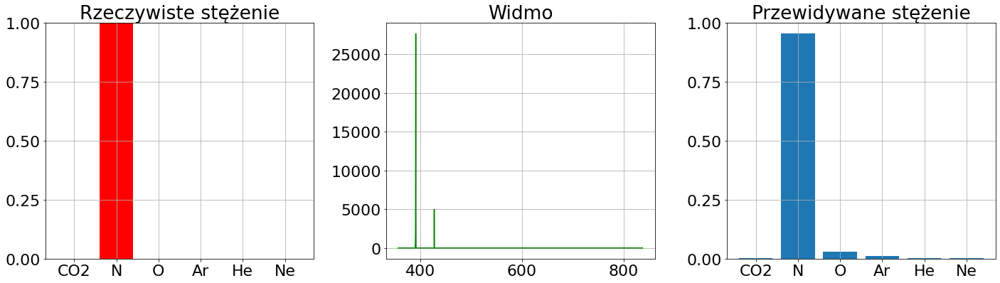

In [330]:
fig = show_predictionsB(modelB, test_spectrums_B, test_concentrations, 16)

0


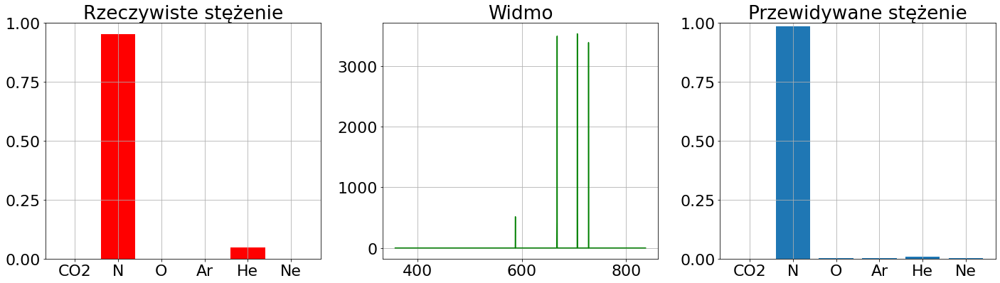

1


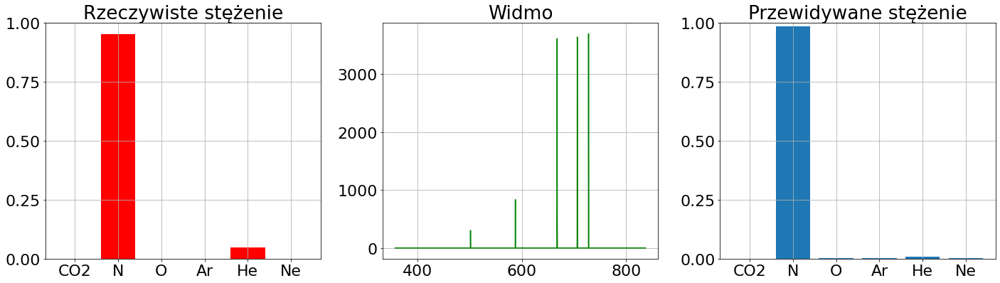

2


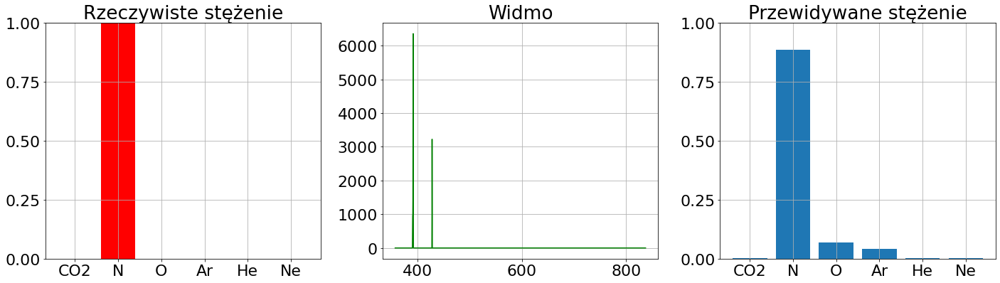

3


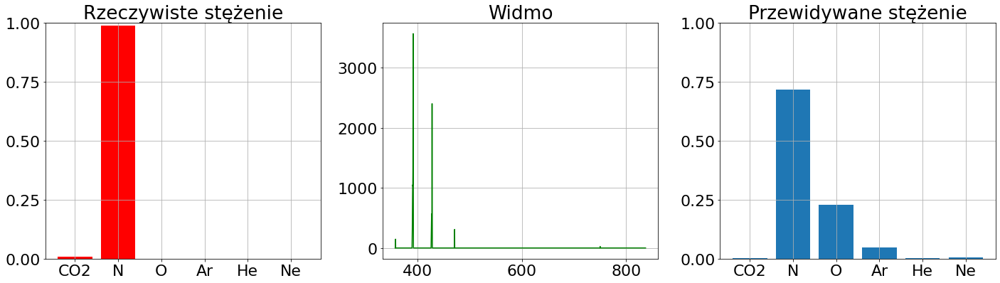

4


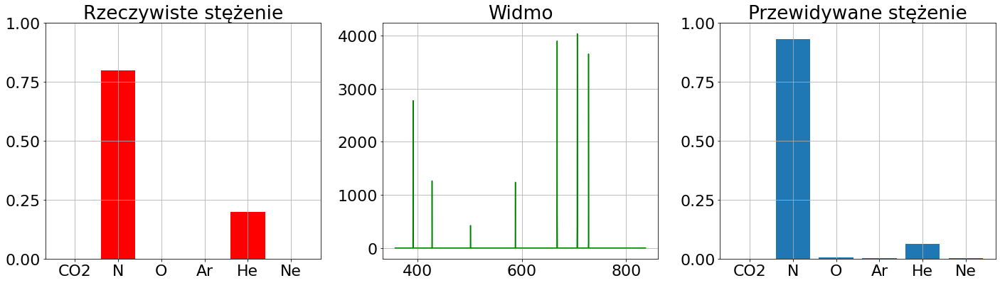

5


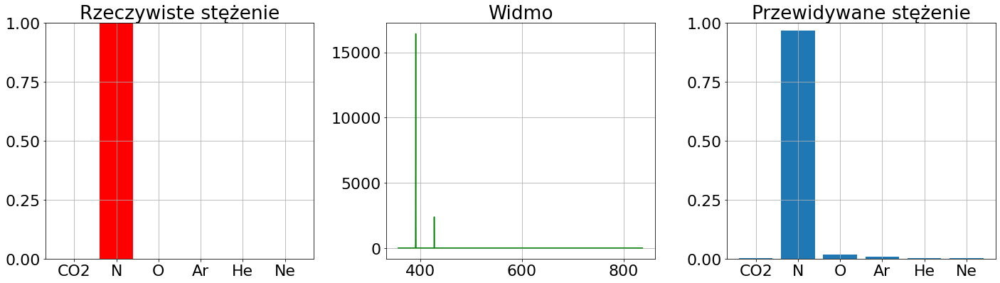

6


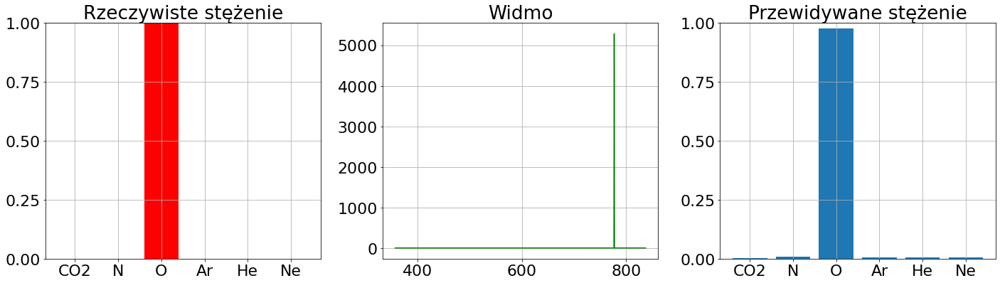

7


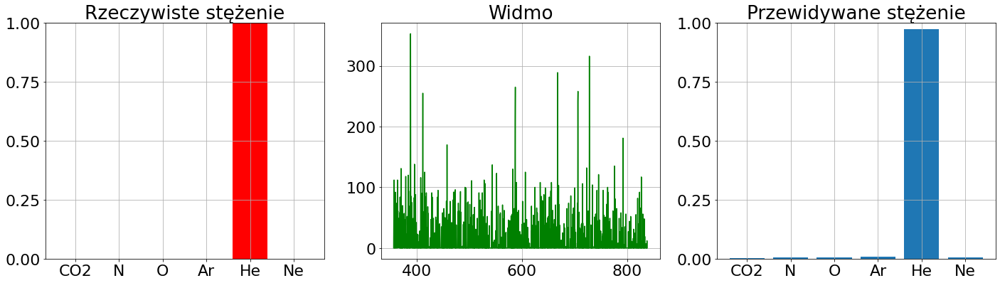

8


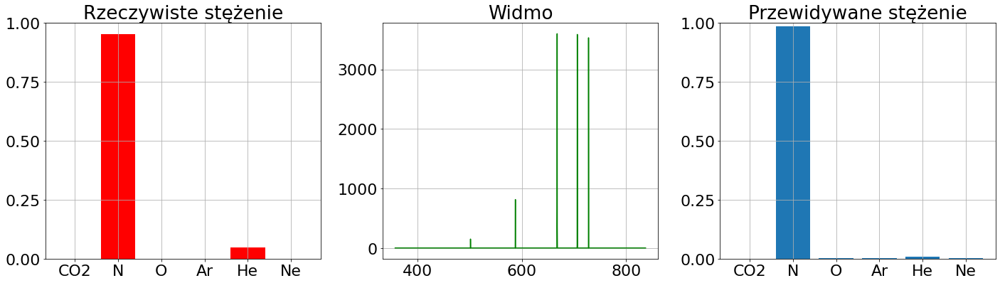

9


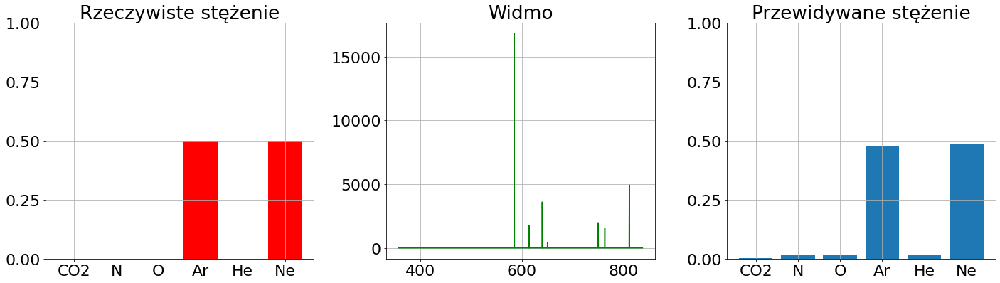

10


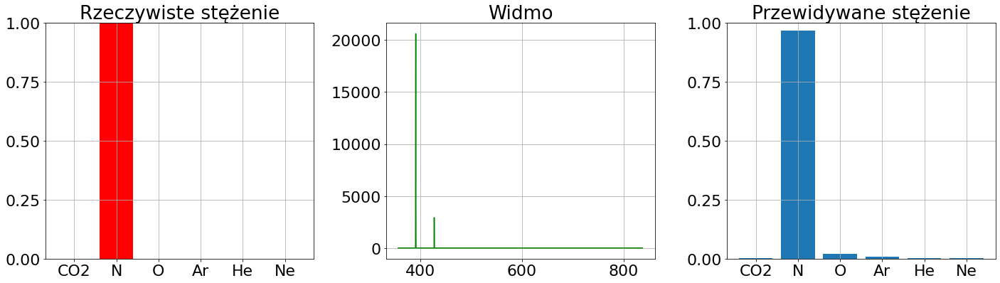

11


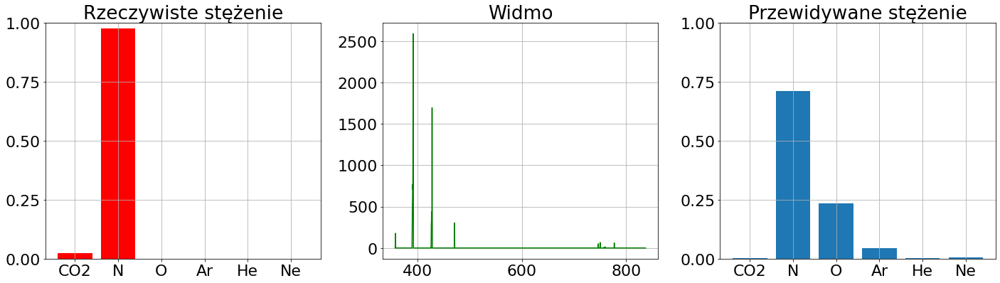

12


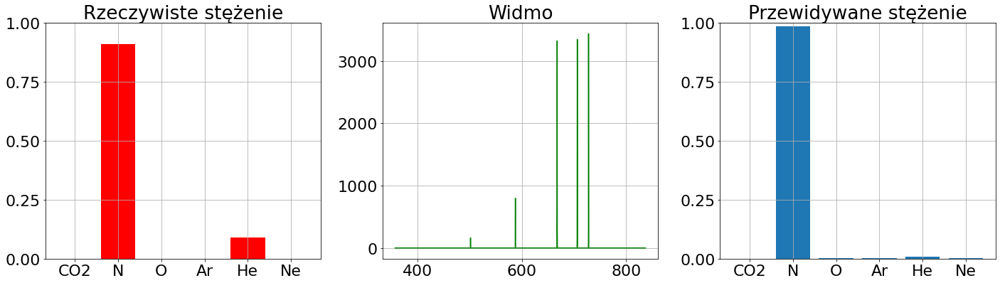

13


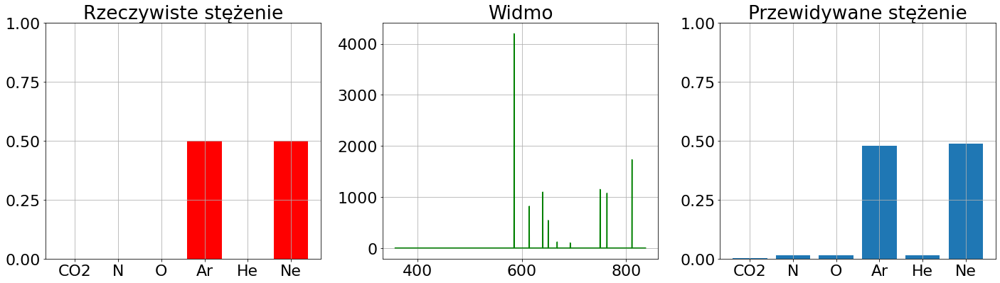

14


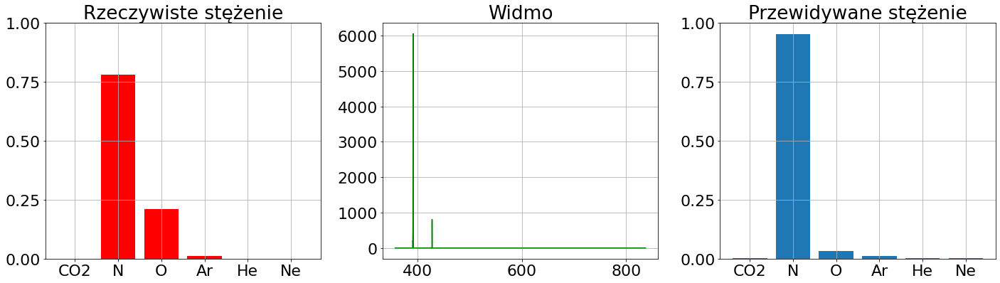

15


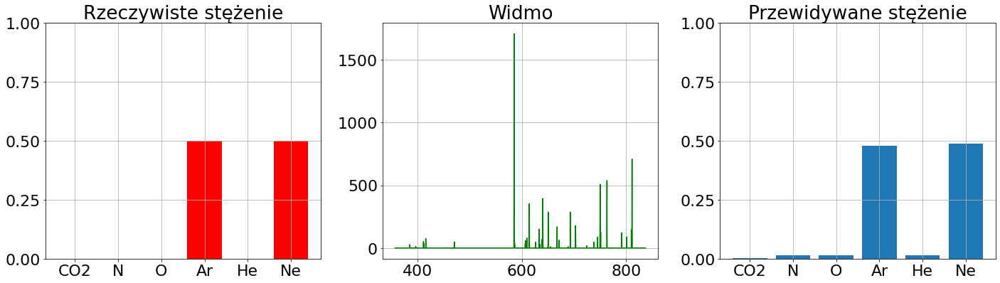

16


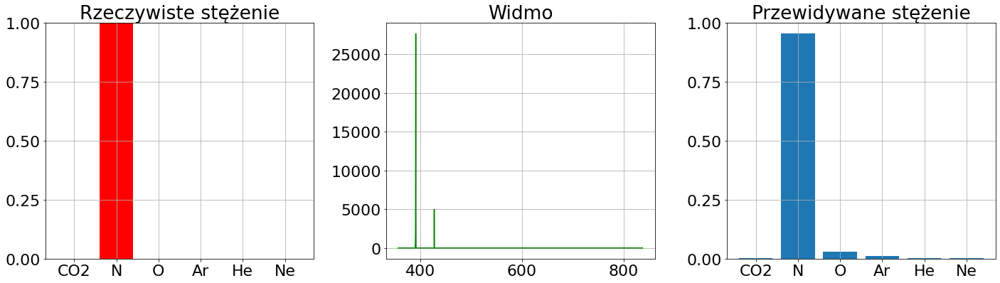

17


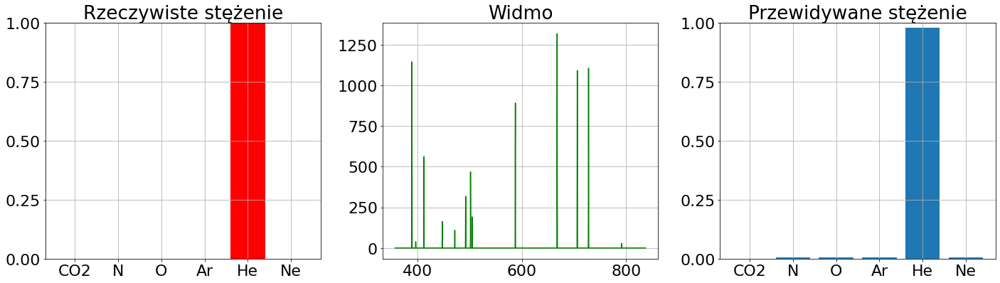

18


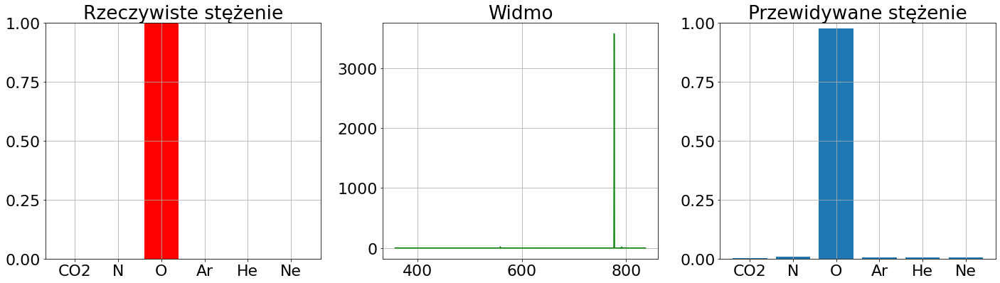

19


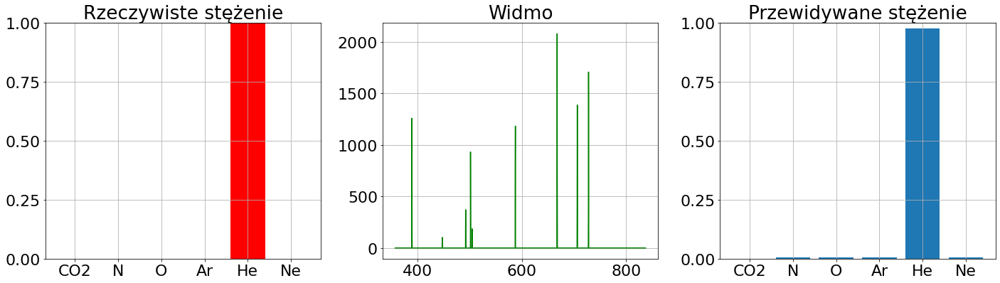

20


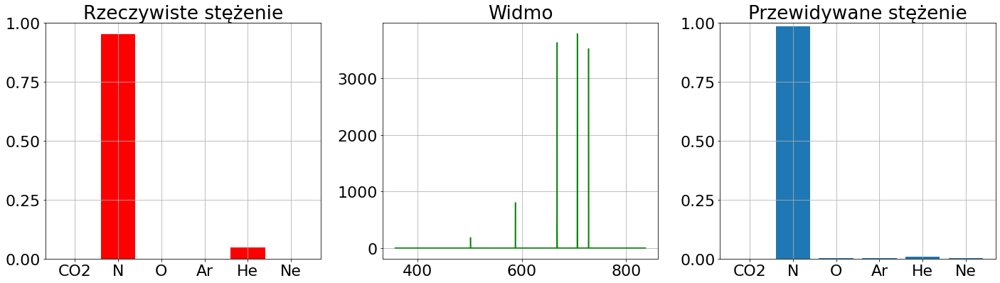

21


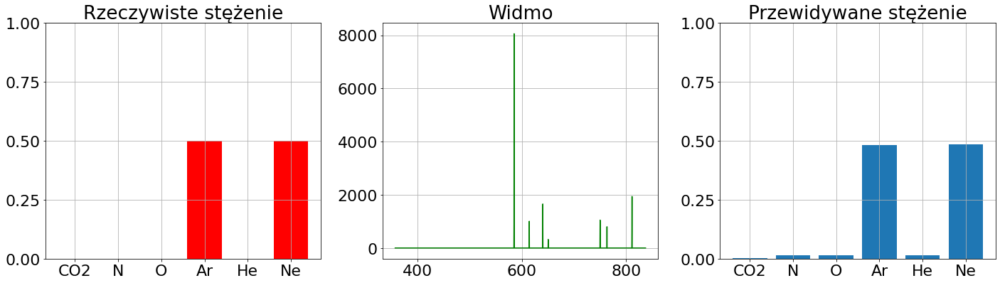

22


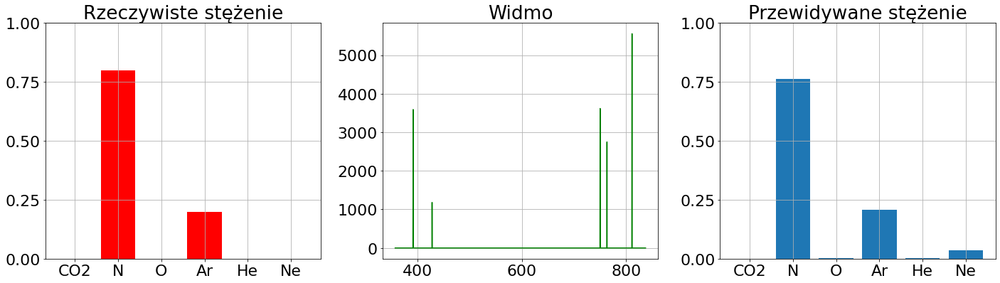

23


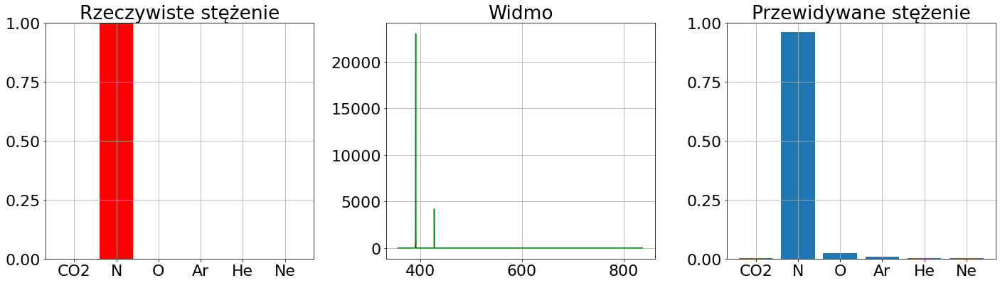

24


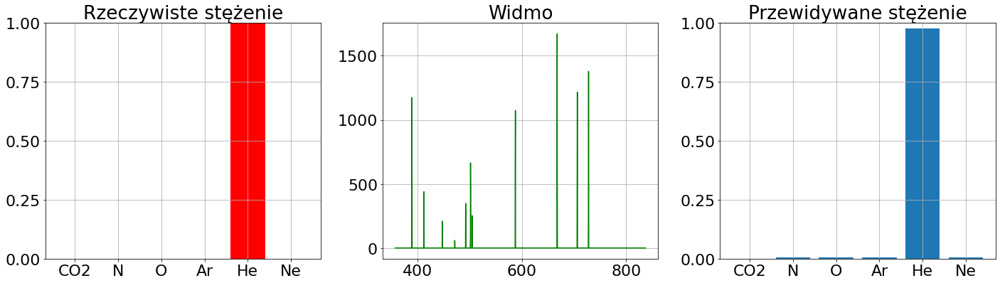

25


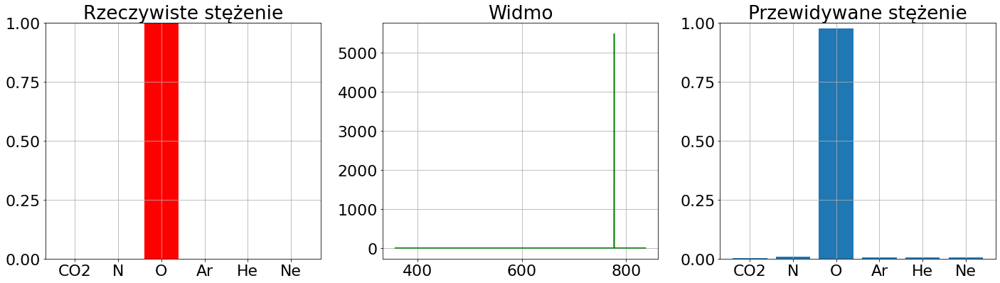

26


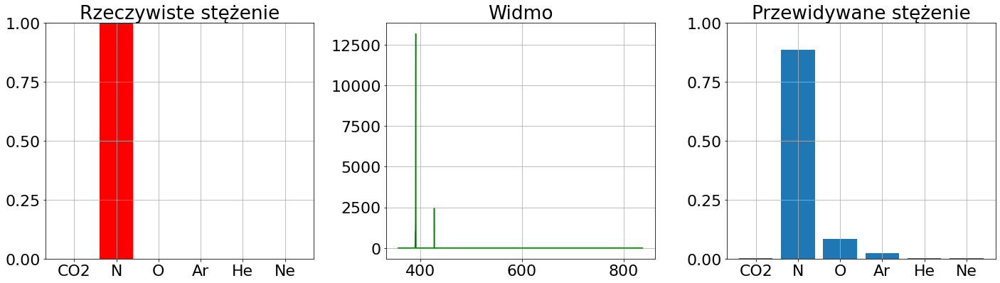

27


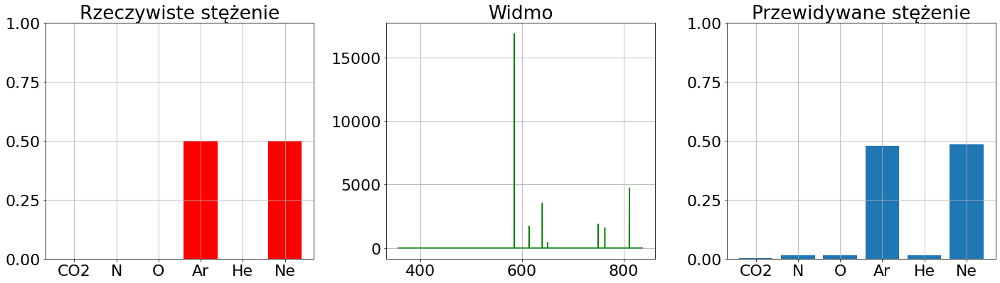

28


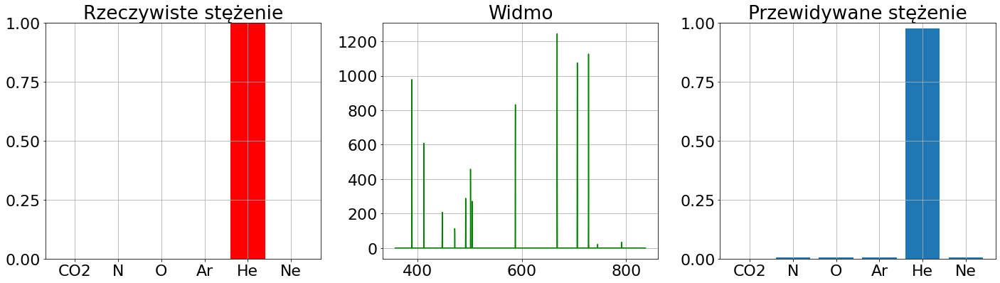

29


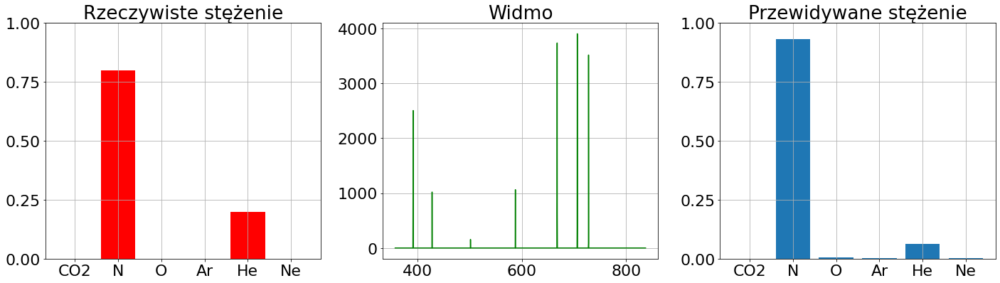

30


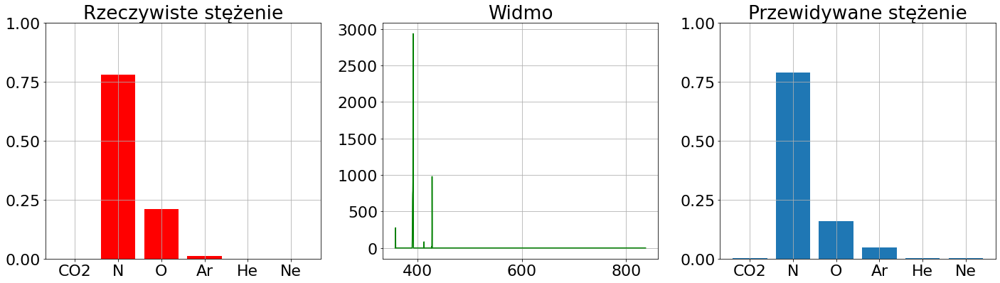

31


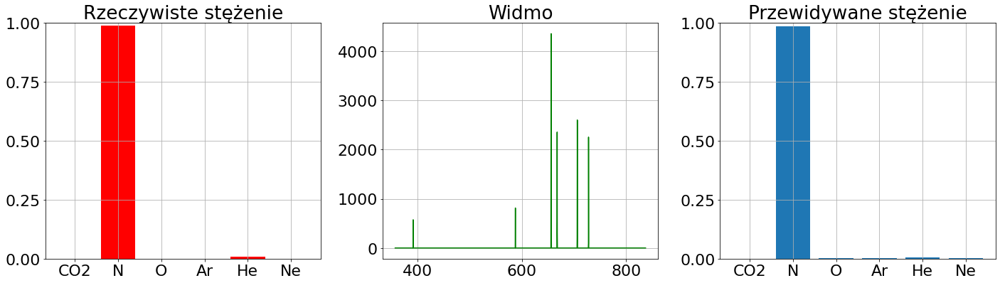

32


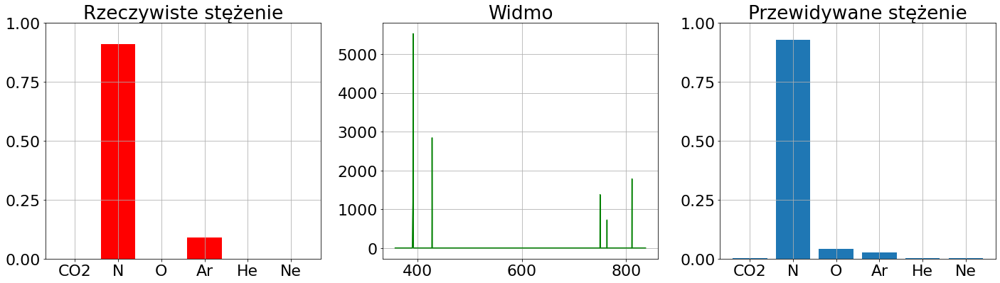

33


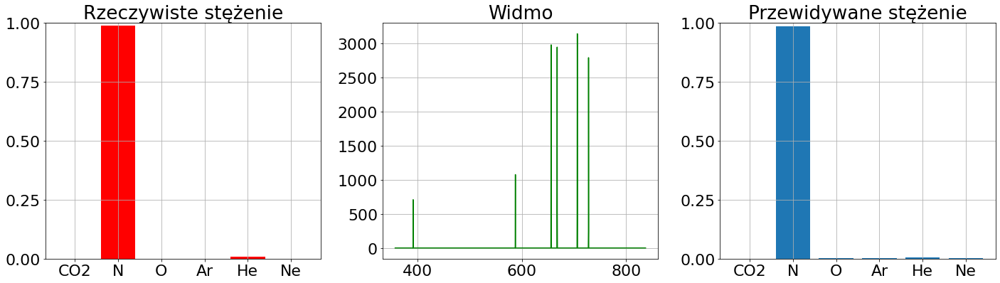

34


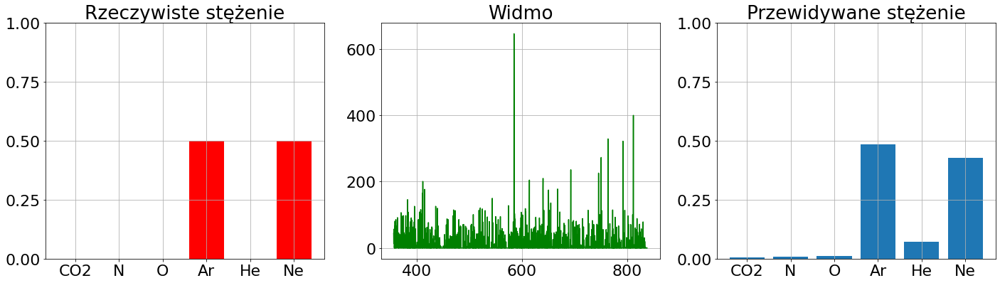

35


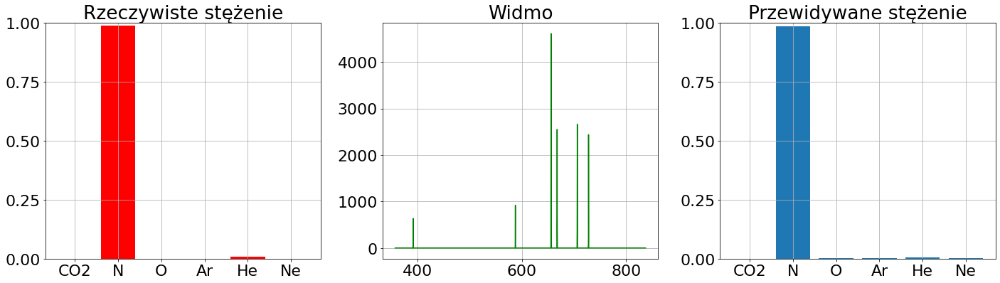

36


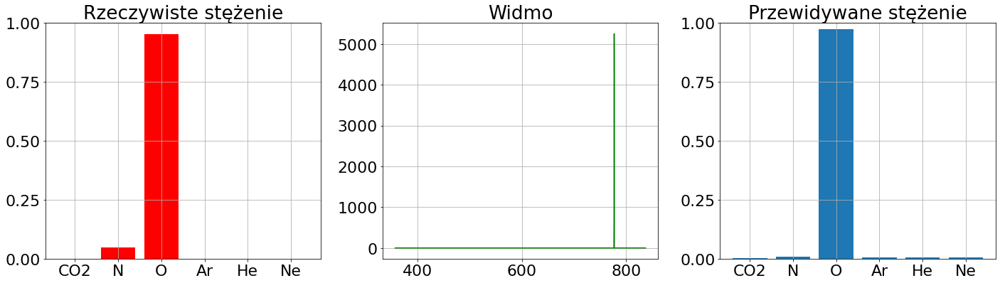

37


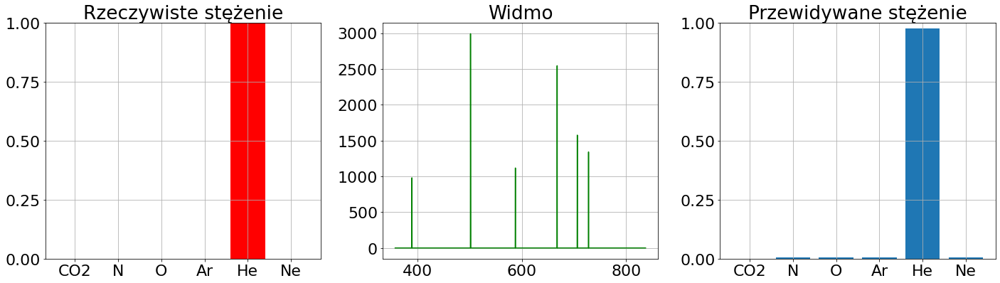

38


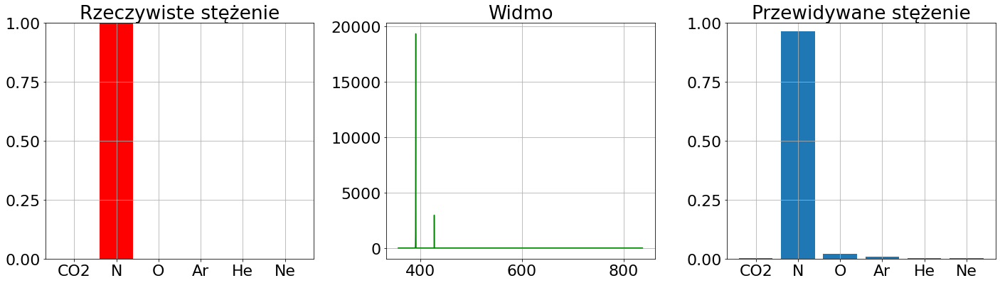

39


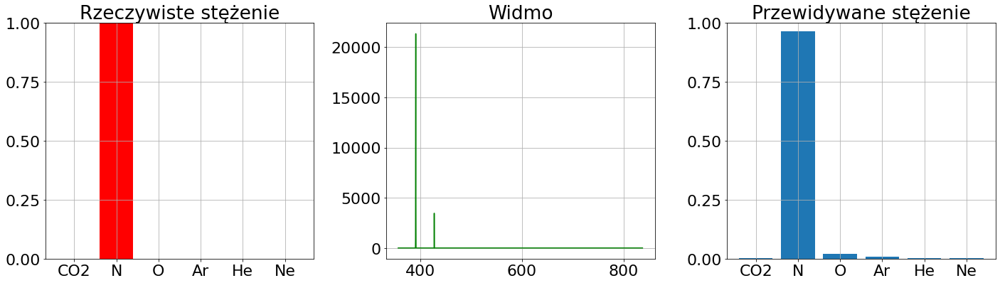

40


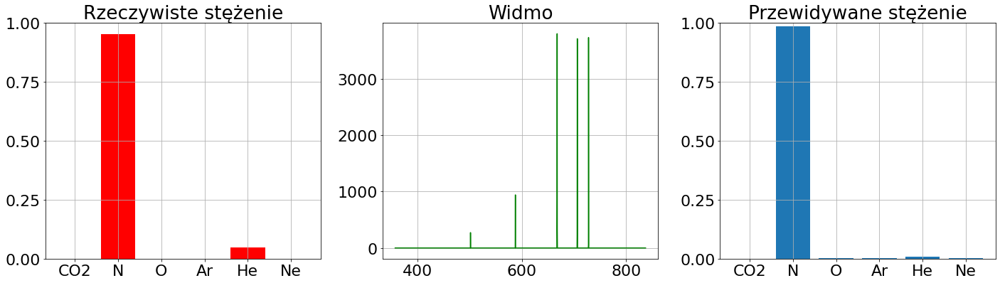

41


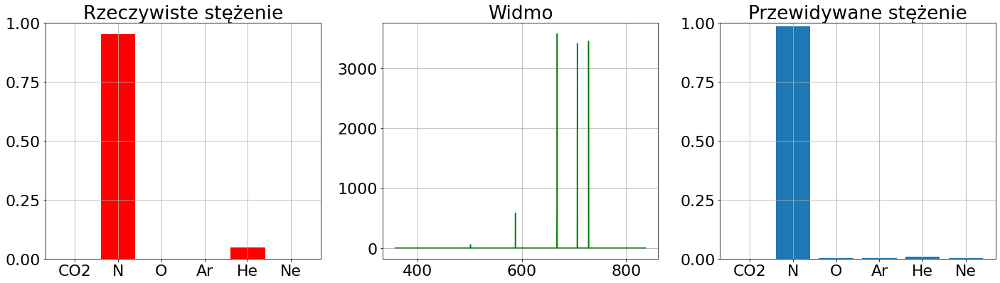

42


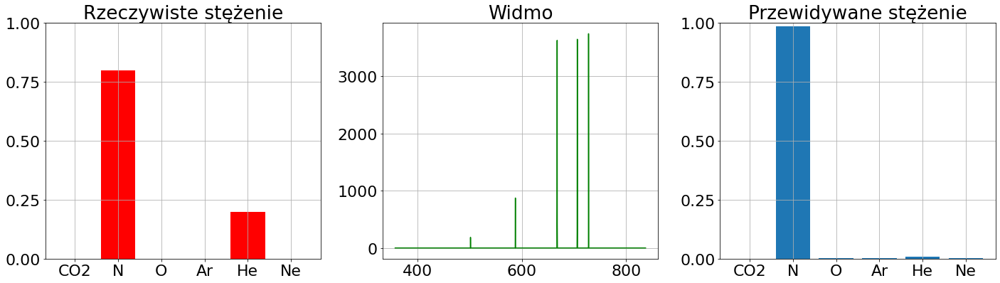

43


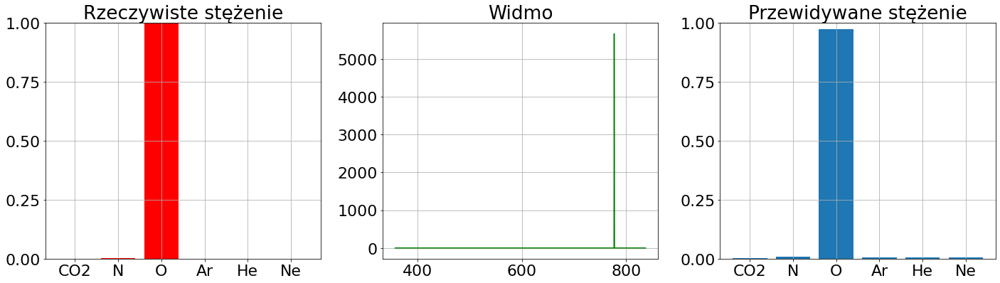

44


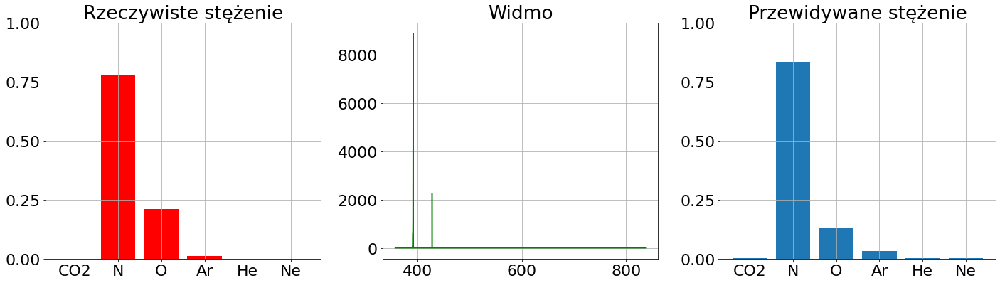

45


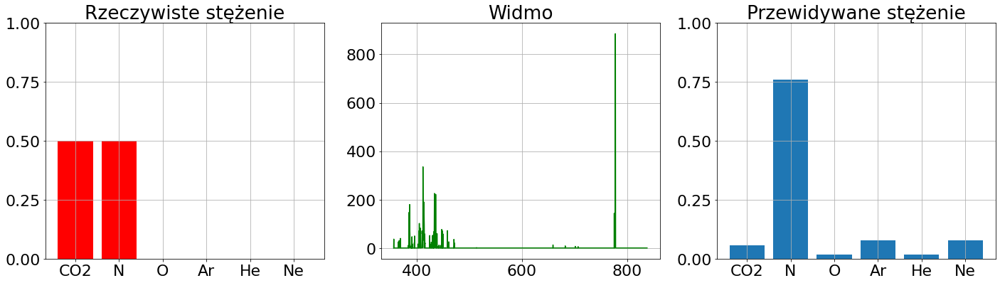

46


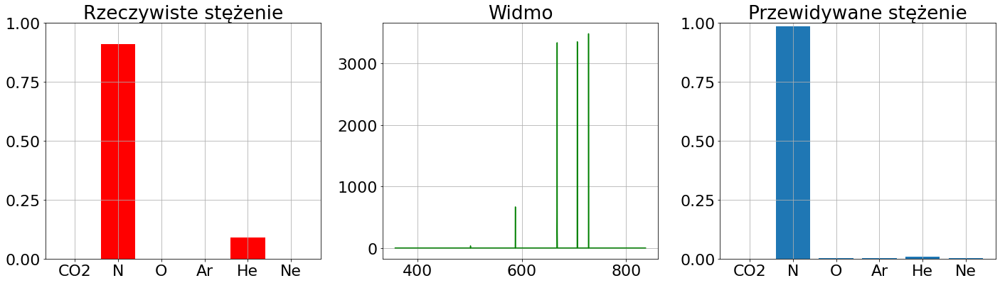

47


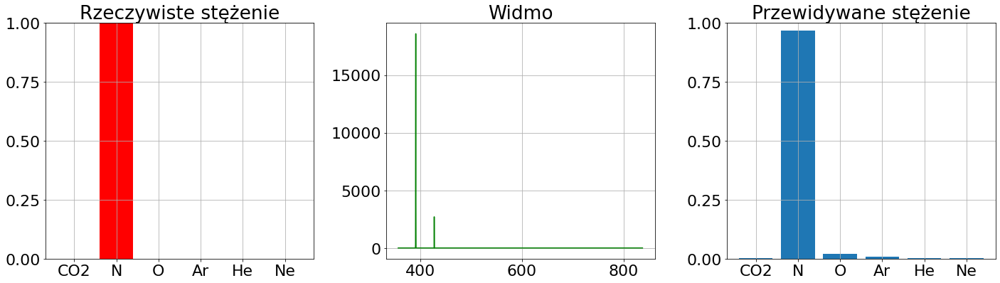

48


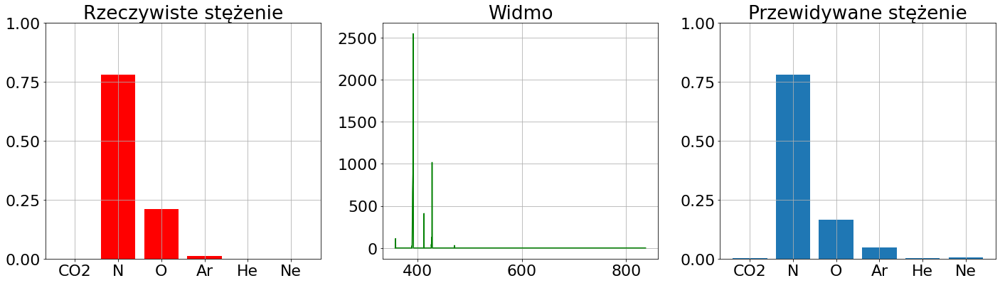

49


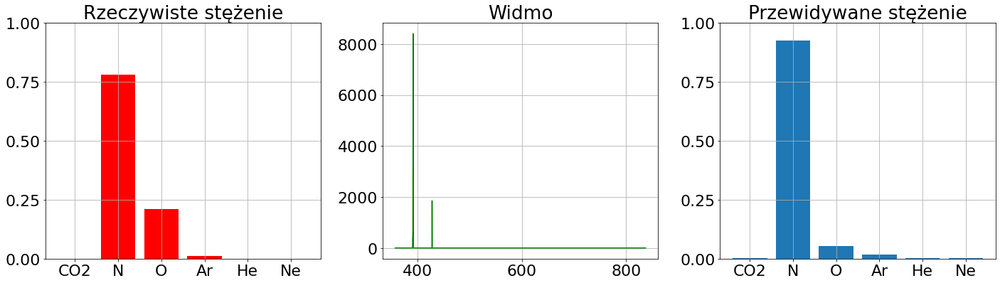

50


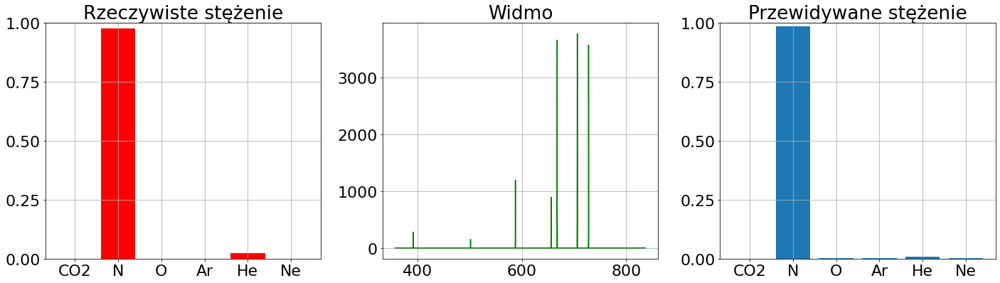

51


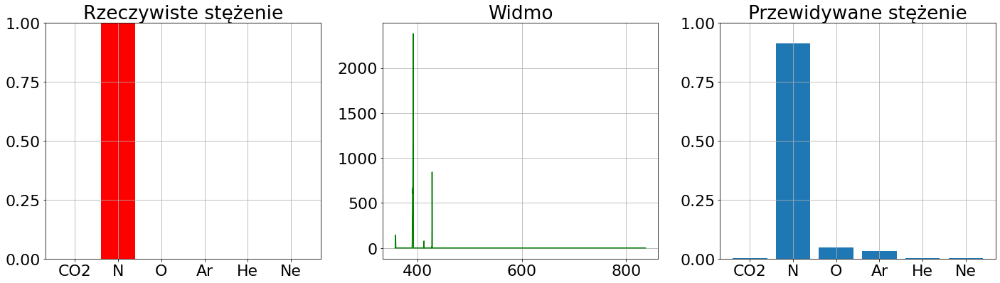

52


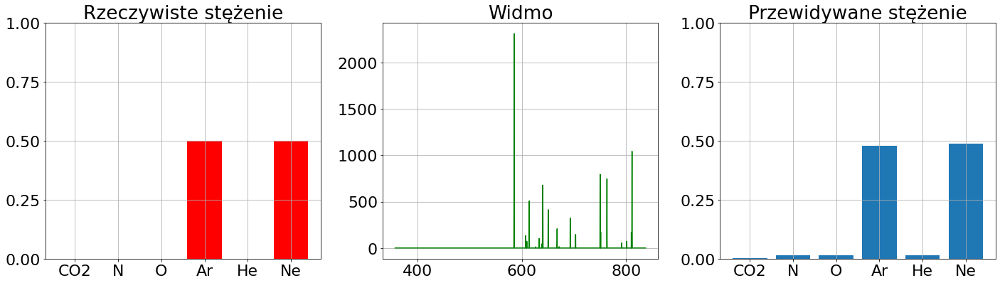

53


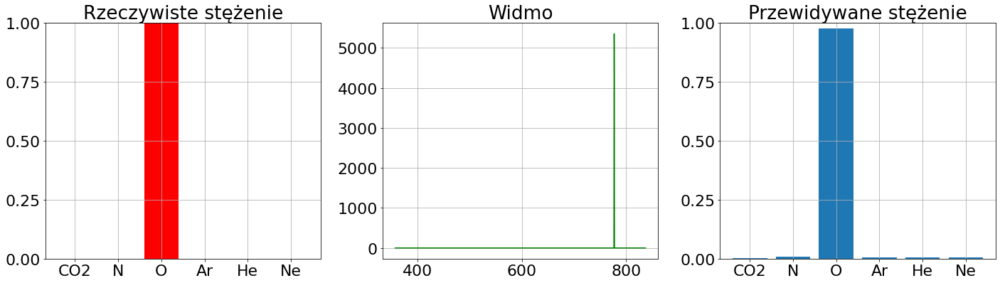

54


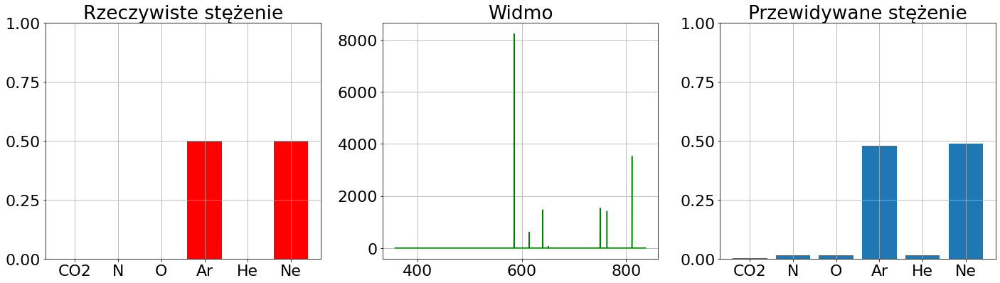

55


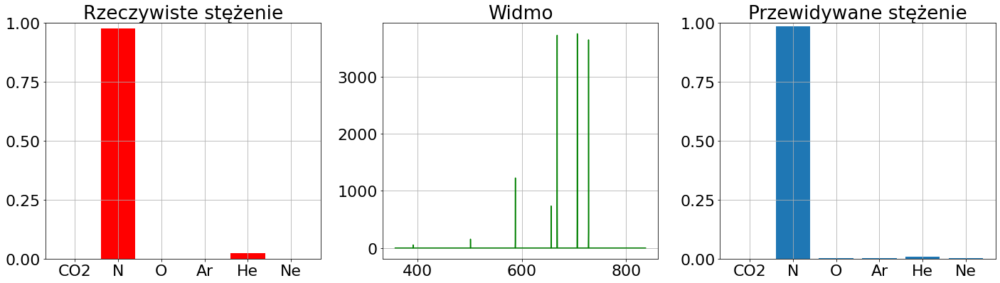

56


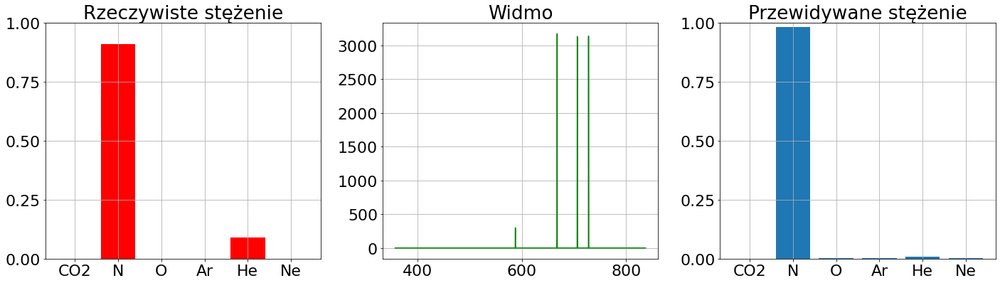

57


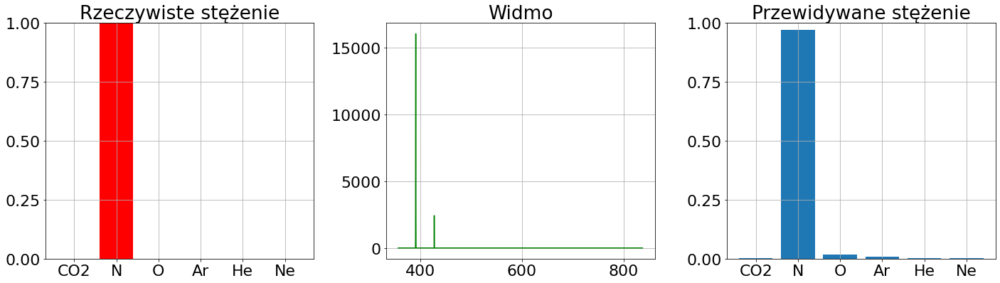

58


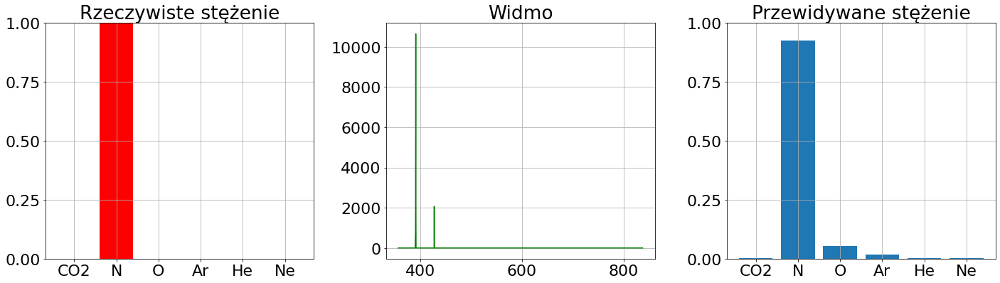

59


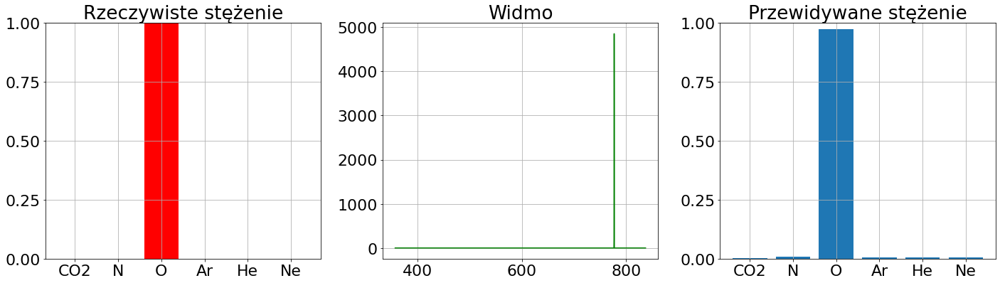

60


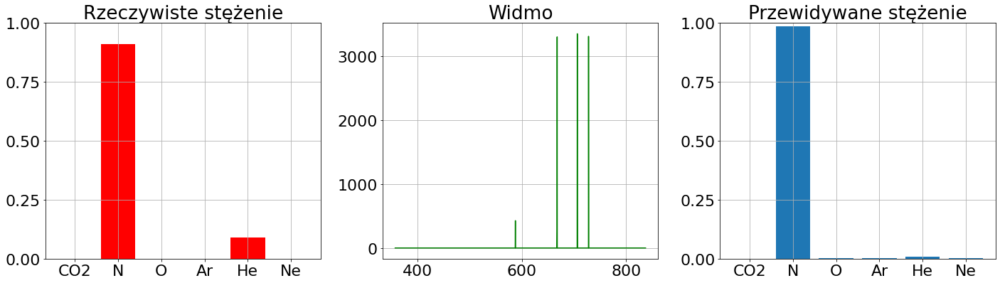

61


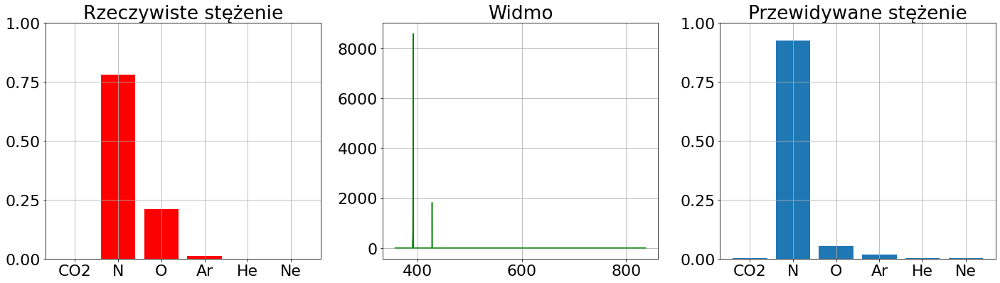

62


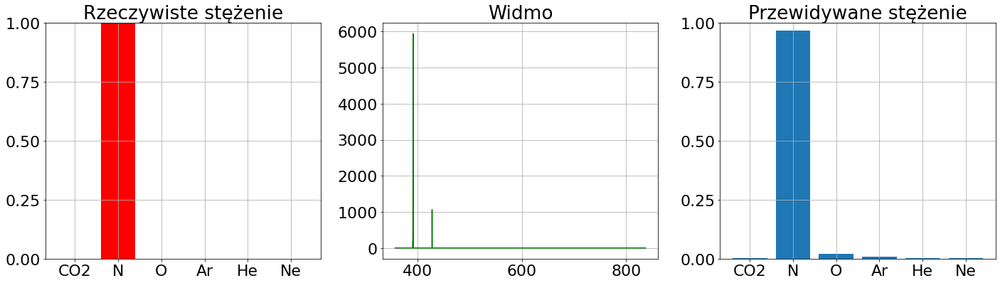

63


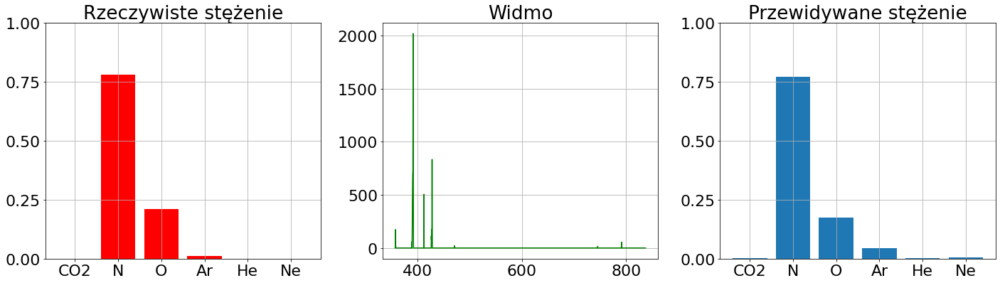

64


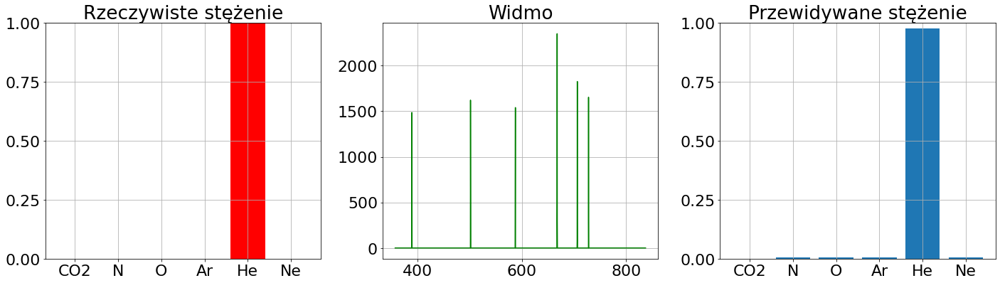

65


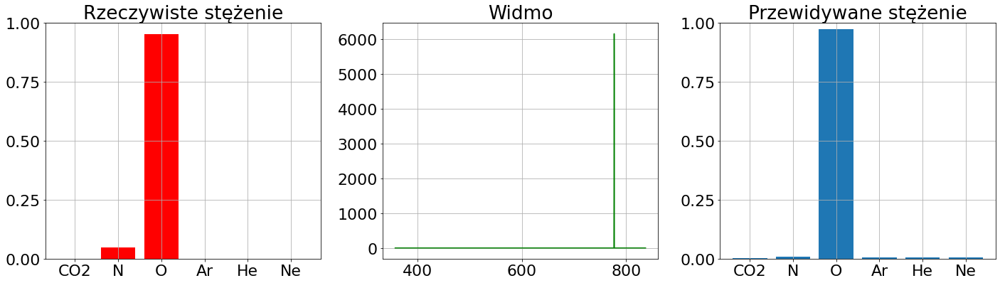

66


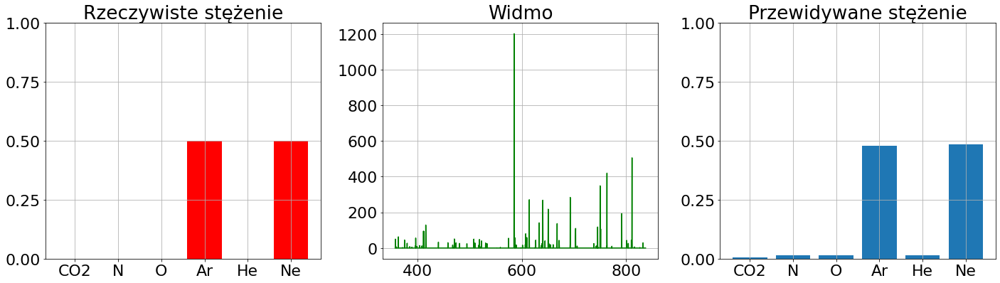

67


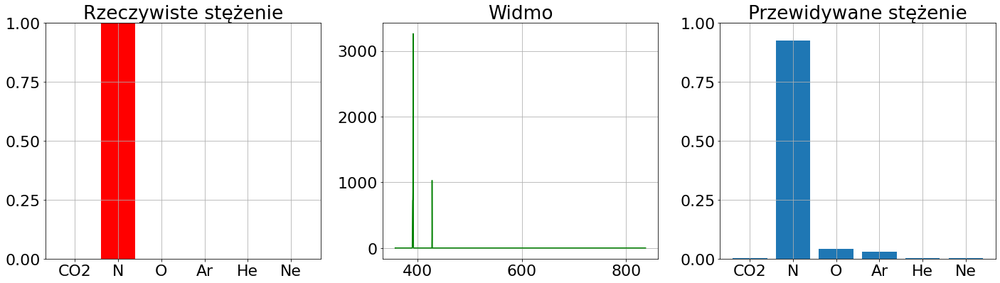

68


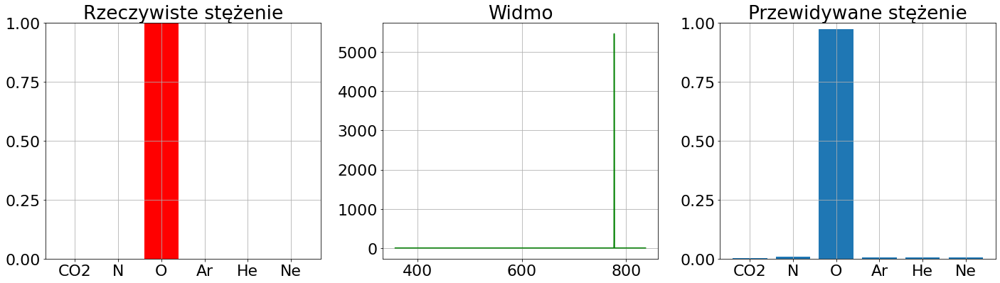

69


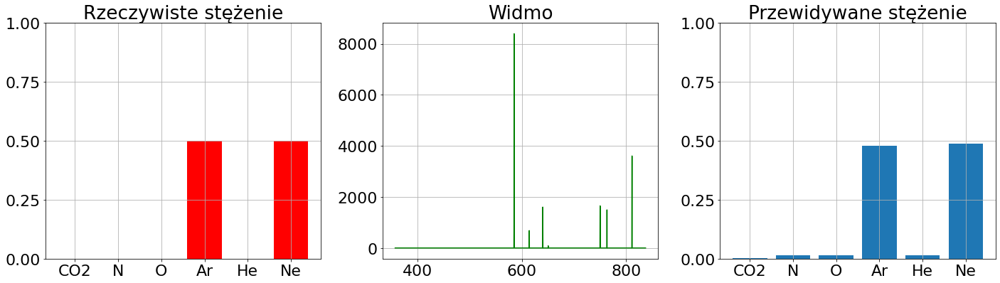

70


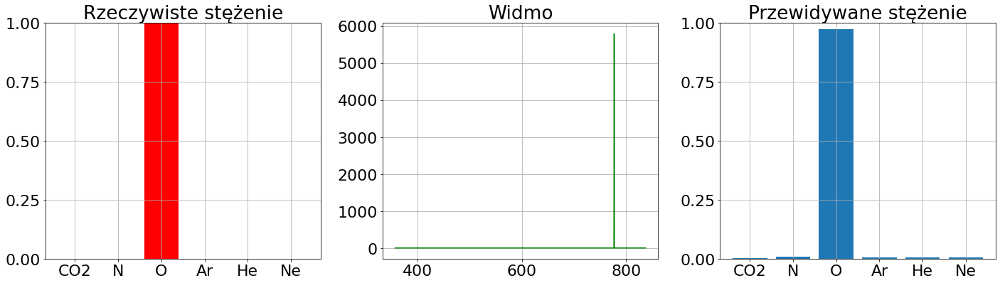

71


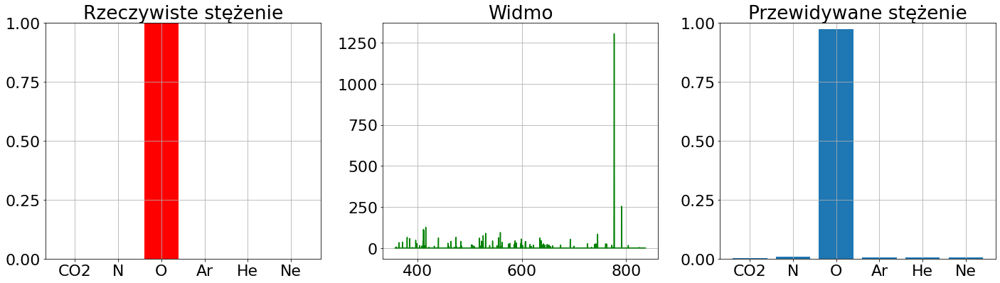

72


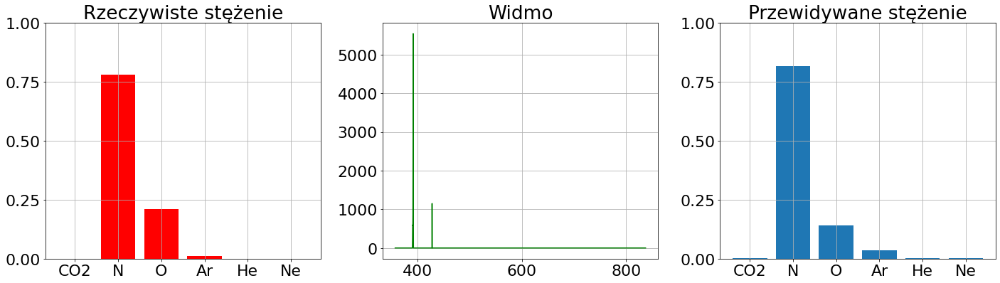

73


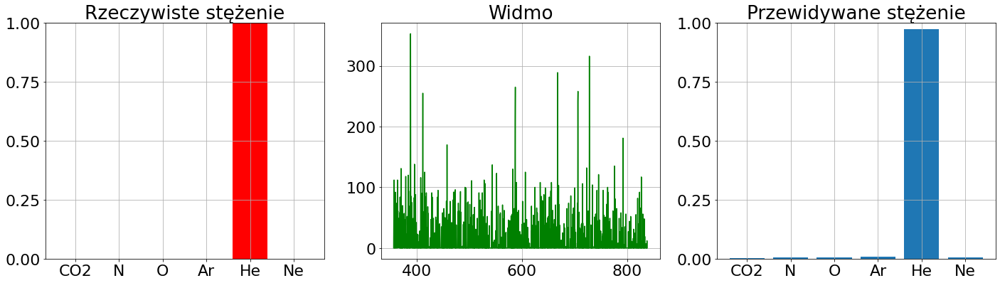

74


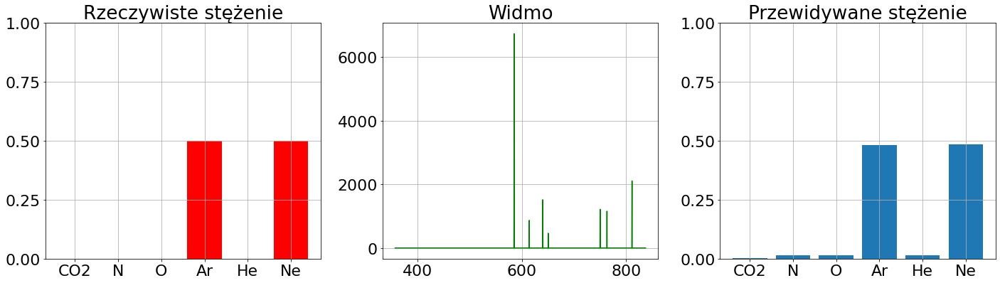

75


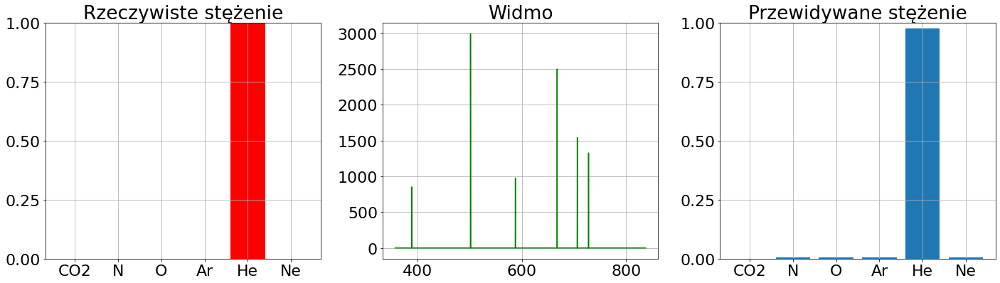

76


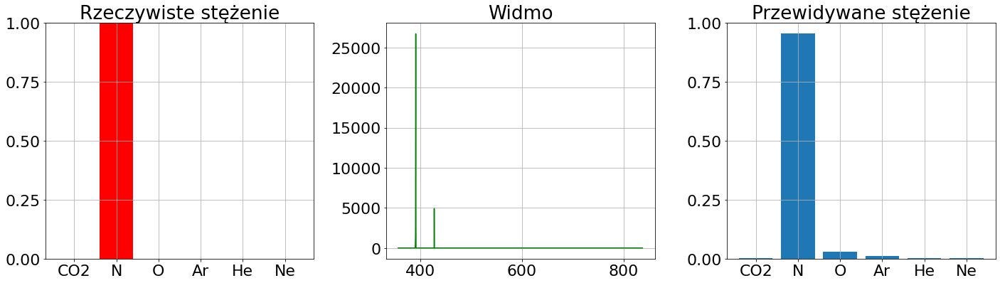

77


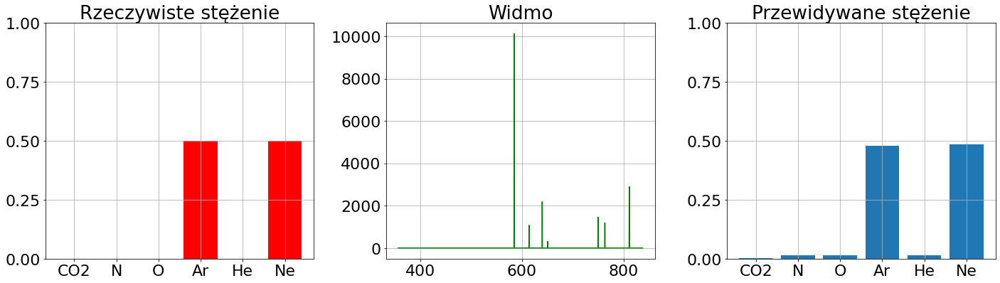

78


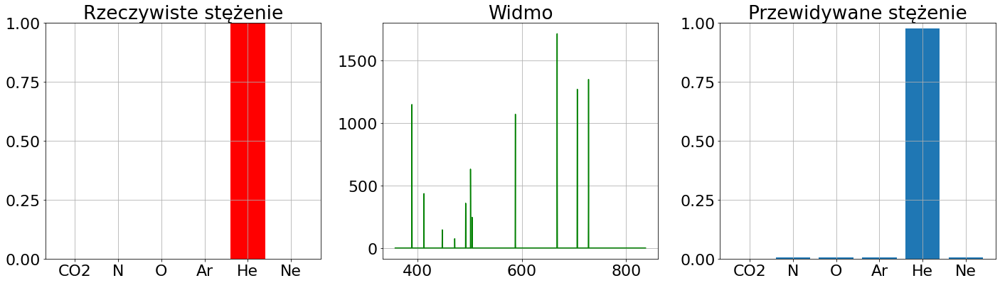

79


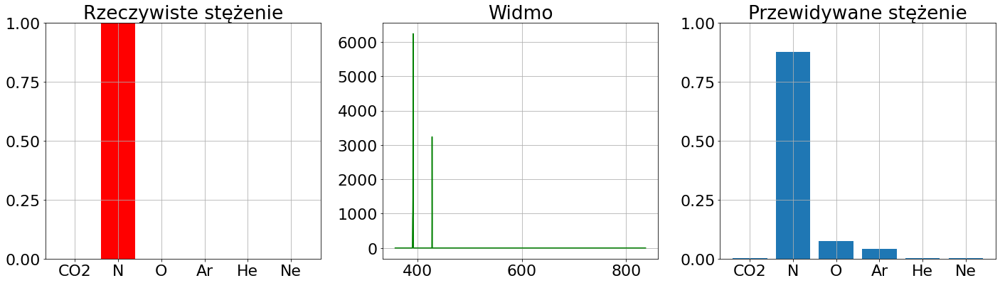

80


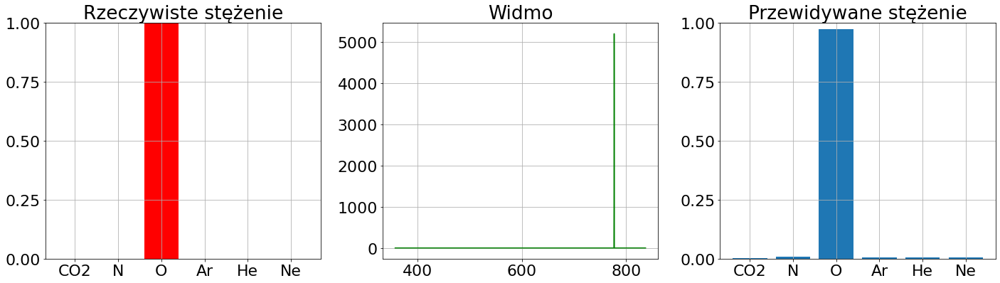

81


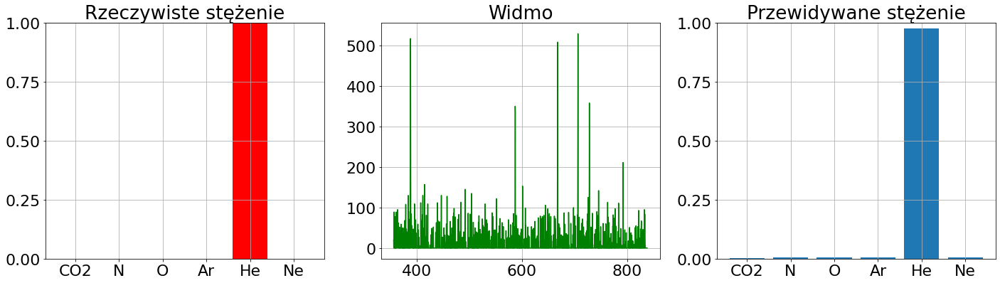

82


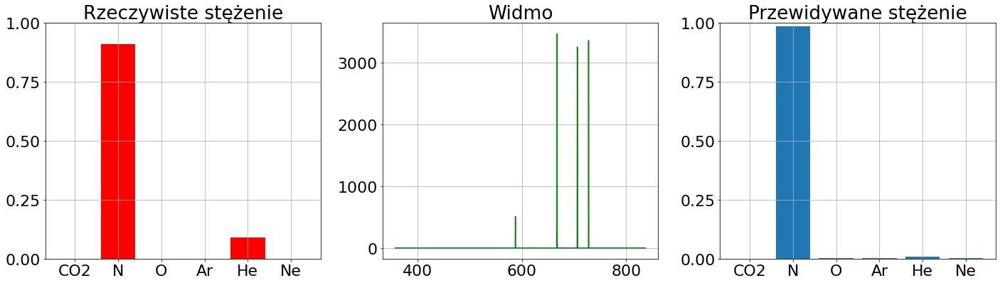

83


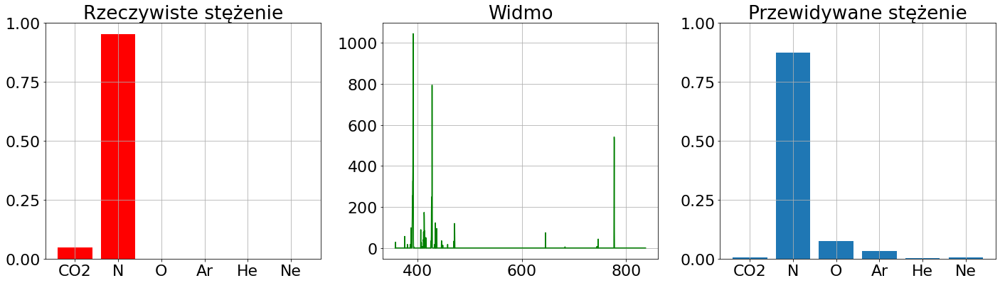

84


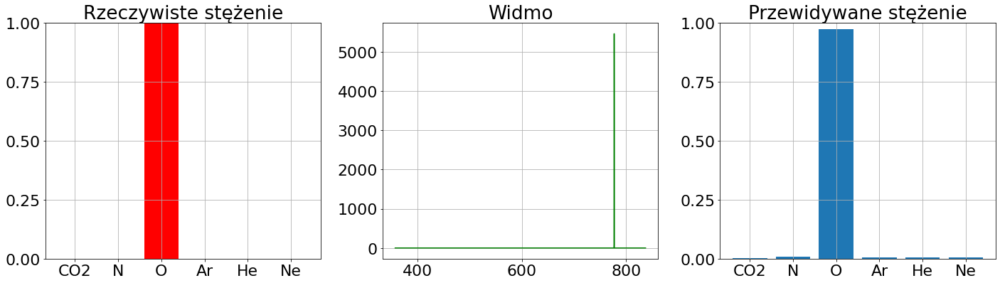

85


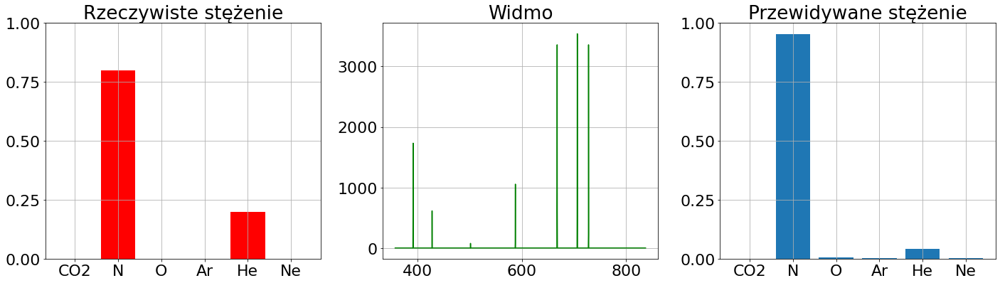

86


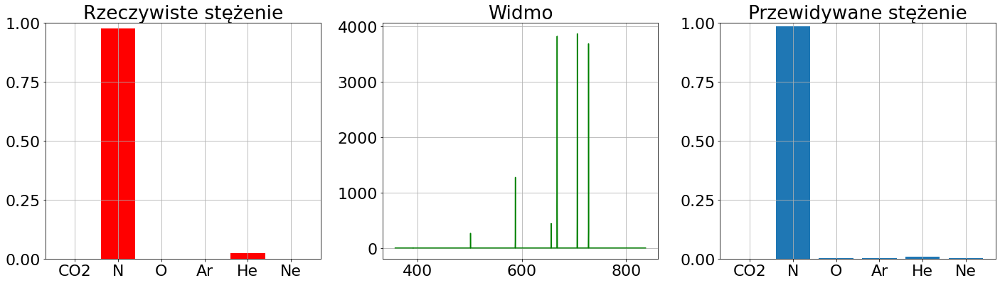

87


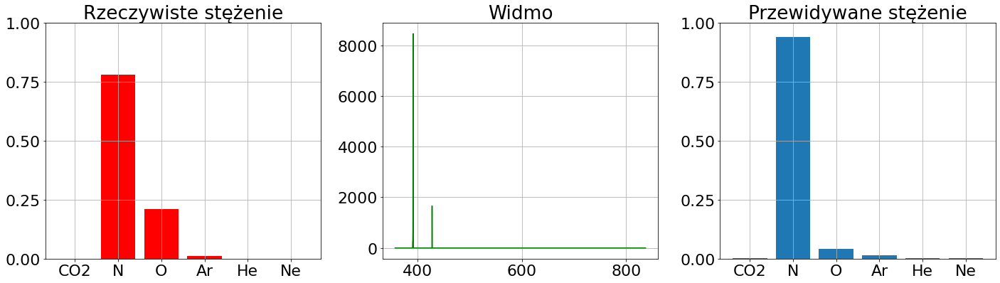

88


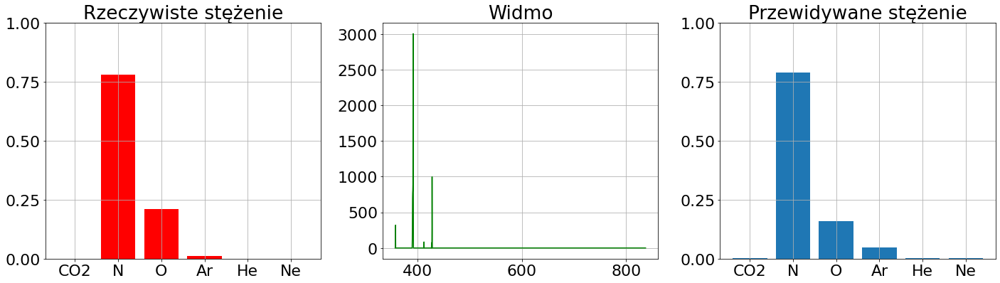

89


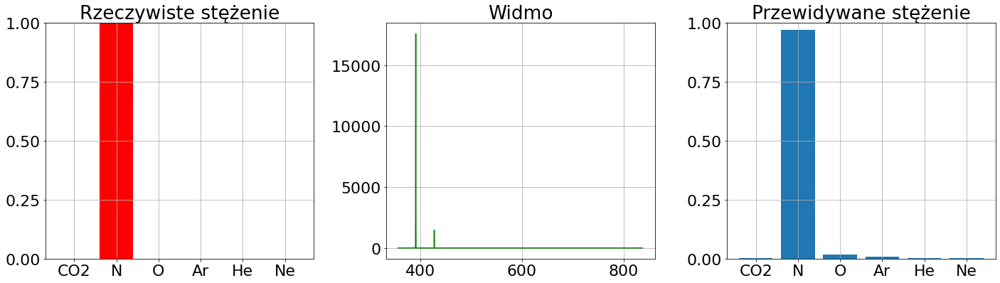

90


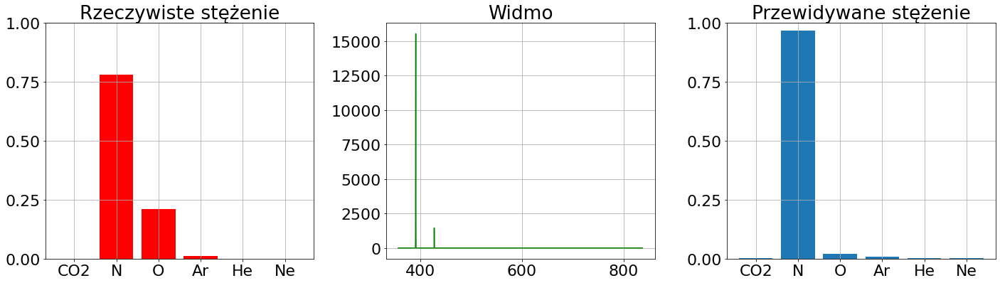

91


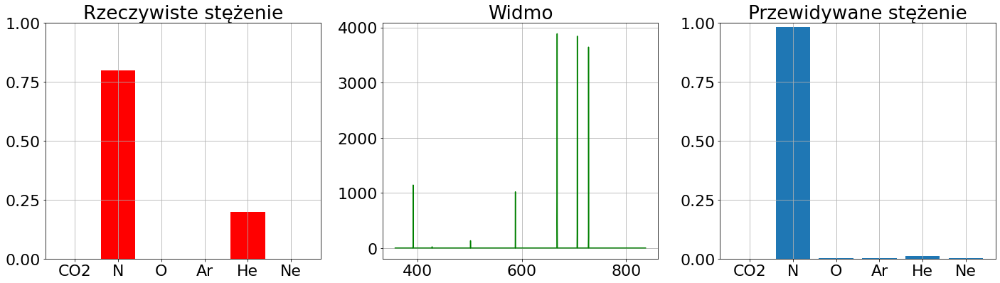

92


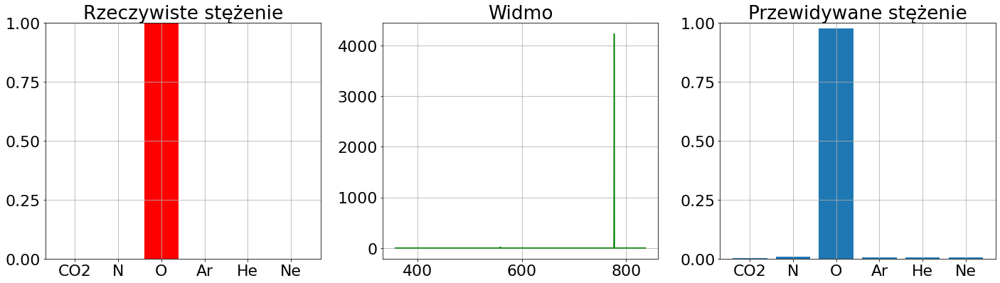

93


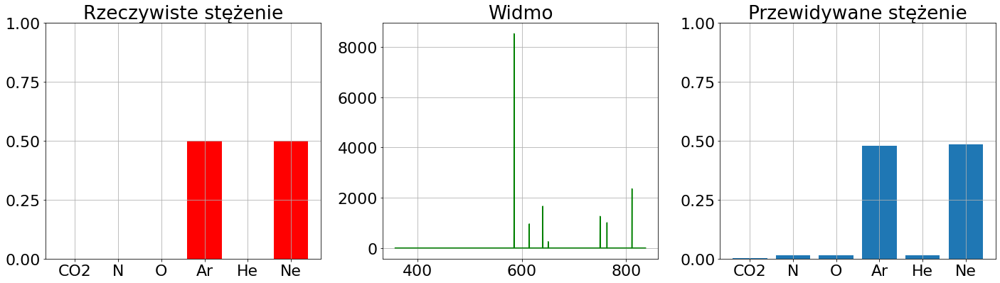

In [331]:
for i in range(94):
    print(i)
    fig = show_predictionsB(modelB, test_spectrums_B, test_concentrations, i)

## 2.3. Optymalizacja

In [272]:
def model_builder_B(hp):
  hp_units1 = hp.Int('units1', min_value=256, max_value=1024, step=2)
  hp_units2 = hp.Int('units2', min_value=256, max_value=512, step=2)
  hp_units3 = hp.Int('units3', min_value=32, max_value=512, step=2)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2050,)),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(hp_units3, activation='tanh'),
            tf.keras.layers.Dense(6, activation="sigmoid")])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2,1e-3, 1e-4, 1e-5]) 
  model.compile(loss=custom_loss,
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse'])

  return model

In [273]:
tunerB = kt.Hyperband(model_builder_B,
                     objective='val_loss',
                     max_epochs=20,
                     factor=3,
                     directory='tunerB',
                     project_name='siecB')

In [282]:
tunerB.search(train_spectrums_B,
             train_concentrations,
             epochs=50,
            steps_per_epoch=10,
             validation_split=0.2,
             callbacks=[stop_learning])

best_hps = tunerB.get_best_hyperparameters(num_trials=1)[0]

Trial 31 Complete [00h 00m 05s]
val_loss: 0.01995404064655304

Best val_loss So Far: 0.013645433820784092
Total elapsed time: 00h 06m 31s
INFO:tensorflow:Oracle triggered exit


In [283]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Liczba neuronów w warstwie 3: %d' % best_hps.get('units3'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 942
Liczba neuronów w warstwie 2: 264
Liczba neuronów w warstwie 3: 178
Współczynnik uczenia: 0.001000


In [284]:
modelB = tunerB.hypermodel.build(best_hps)
history = modelB.fit(train_spectrums_B,
                    train_concentrations,
                    steps_per_epoch=10,
                    epochs=200,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/200
10/10 [==============================] - 1s 36ms/step - loss: 0.4204 - mse: 0.0806 - val_loss: 0.1266 - val_mse: 0.0559
Epoch 2/200
10/10 [==============================] - 0s 18ms/step - loss: 0.1206 - mse: 0.0579 - val_loss: 0.0956 - val_mse: 0.0609
Epoch 3/200
10/10 [==============================] - 0s 20ms/step - loss: 0.0797 - mse: 0.0536 - val_loss: 0.0732 - val_mse: 0.0526
Epoch 4/200
10/10 [==============================] - 0s 18ms/step - loss: 0.0658 - mse: 0.0374 - val_loss: 0.0472 - val_mse: 0.0223
Epoch 5/200
10/10 [==============================] - 0s 19ms/step - loss: 0.0438 - mse: 0.0166 - val_loss: 0.0290 - val_mse: 0.0119
Epoch 6/200
10/10 [==============================] - 0s 17ms/step - loss: 0.0355 - mse: 0.0144 - val_loss: 0.0330 - val_mse: 0.0114
Epoch 7/200
10/10 [==============================] - 0s 20ms/step - loss: 0.0363 - mse: 0.0141 - val_loss: 0.0241 - val_mse: 0.0111
Epoch 8/200
10/10 [==============================] - 0s 18ms/step - loss: 0.

10/10 [==============================] - 0s 20ms/step - loss: 0.0112 - mse: 0.0078 - val_loss: 0.0114 - val_mse: 0.0053
Epoch 63/200
10/10 [==============================] - 0s 22ms/step - loss: 0.0137 - mse: 0.0076 - val_loss: 0.0116 - val_mse: 0.0057
Epoch 64/200
10/10 [==============================] - 0s 19ms/step - loss: 0.0126 - mse: 0.0077 - val_loss: 0.0132 - val_mse: 0.0056
Epoch 65/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0150 - mse: 0.0077 - val_loss: 0.0092 - val_mse: 0.0057
Epoch 66/200
10/10 [==============================] - 0s 25ms/step - loss: 0.0113 - mse: 0.0077 - val_loss: 0.0090 - val_mse: 0.0057
Epoch 67/200
10/10 [==============================] - 0s 20ms/step - loss: 0.0110 - mse: 0.0077 - val_loss: 0.0108 - val_mse: 0.0056
Epoch 68/200
10/10 [==============================] - 0s 17ms/step - loss: 0.0142 - mse: 0.0077 - val_loss: 0.0106 - val_mse: 0.0054
Epoch 69/200
10/10 [==============================] - 0s 18ms/step - loss: 0.0137 

10/10 [==============================] - 0s 23ms/step - loss: 0.0105 - mse: 0.0061 - val_loss: 0.0084 - val_mse: 0.0039
Epoch 124/200
10/10 [==============================] - 0s 21ms/step - loss: 0.0101 - mse: 0.0064 - val_loss: 0.0088 - val_mse: 0.0045
Epoch 125/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0104 - mse: 0.0065 - val_loss: 0.0070 - val_mse: 0.0041
Epoch 126/200
10/10 [==============================] - 0s 24ms/step - loss: 0.0101 - mse: 0.0061 - val_loss: 0.0064 - val_mse: 0.0032
Epoch 127/200
10/10 [==============================] - 0s 20ms/step - loss: 0.0094 - mse: 0.0060 - val_loss: 0.0067 - val_mse: 0.0034
Epoch 128/200
10/10 [==============================] - 0s 23ms/step - loss: 0.0092 - mse: 0.0059 - val_loss: 0.0077 - val_mse: 0.0033
Epoch 129/200
10/10 [==============================] - 0s 21ms/step - loss: 0.0099 - mse: 0.0058 - val_loss: 0.0058 - val_mse: 0.0033
Epoch 130/200
10/10 [==============================] - 0s 23ms/step - loss: 

10/10 [==============================] - 0s 24ms/step - loss: 0.0107 - mse: 0.0057 - val_loss: 0.0077 - val_mse: 0.0034
Epoch 185/200
10/10 [==============================] - 0s 22ms/step - loss: 0.0101 - mse: 0.0059 - val_loss: 0.0057 - val_mse: 0.0036
Epoch 186/200
10/10 [==============================] - 0s 22ms/step - loss: 0.0088 - mse: 0.0055 - val_loss: 0.0071 - val_mse: 0.0031
Epoch 187/200
10/10 [==============================] - 0s 25ms/step - loss: 0.0088 - mse: 0.0054 - val_loss: 0.0058 - val_mse: 0.0031
Epoch 188/200
10/10 [==============================] - 0s 31ms/step - loss: 0.0095 - mse: 0.0052 - val_loss: 0.0077 - val_mse: 0.0030
Epoch 189/200
10/10 [==============================] - 0s 22ms/step - loss: 0.0095 - mse: 0.0052 - val_loss: 0.0074 - val_mse: 0.0029
Epoch 190/200
10/10 [==============================] - 0s 21ms/step - loss: 0.0089 - mse: 0.0053 - val_loss: 0.0072 - val_mse: 0.0030
Epoch 191/200
10/10 [==============================] - 0s 23ms/step - loss: 

In [289]:
hypermodelB = tunerB.hypermodel.build(best_hps)

hypermodelB.fit(train_spectrums_B, train_concentrations, epochs=best_epoch, validation_split=0.2)

Epoch 1/151
10/10 [==============================] - 1s 33ms/step - loss: 0.5826 - mse: 0.1032 - val_loss: 0.1261 - val_mse: 0.0452
Epoch 2/151
10/10 [==============================] - 0s 19ms/step - loss: 0.0966 - mse: 0.0394 - val_loss: 0.0655 - val_mse: 0.0273
Epoch 3/151
10/10 [==============================] - 0s 22ms/step - loss: 0.0629 - mse: 0.0249 - val_loss: 0.0409 - val_mse: 0.0136
Epoch 4/151
10/10 [==============================] - 0s 21ms/step - loss: 0.0439 - mse: 0.0157 - val_loss: 0.0409 - val_mse: 0.0109
Epoch 5/151
10/10 [==============================] - 0s 19ms/step - loss: 0.0375 - mse: 0.0144 - val_loss: 0.0323 - val_mse: 0.0099
Epoch 6/151
10/10 [==============================] - 0s 20ms/step - loss: 0.0285 - mse: 0.0136 - val_loss: 0.0227 - val_mse: 0.0105
Epoch 7/151
10/10 [==============================] - 0s 23ms/step - loss: 0.0263 - mse: 0.0136 - val_loss: 0.0207 - val_mse: 0.0100
Epoch 8/151
10/10 [==============================] - 0s 20ms/step - loss: 0.

10/10 [==============================] - 0s 26ms/step - loss: 0.0146 - mse: 0.0073 - val_loss: 0.0127 - val_mse: 0.0054
Epoch 63/151
10/10 [==============================] - 0s 24ms/step - loss: 0.0130 - mse: 0.0070 - val_loss: 0.0121 - val_mse: 0.0050
Epoch 64/151
10/10 [==============================] - 0s 31ms/step - loss: 0.0137 - mse: 0.0069 - val_loss: 0.0120 - val_mse: 0.0053
Epoch 65/151
10/10 [==============================] - 0s 18ms/step - loss: 0.0129 - mse: 0.0072 - val_loss: 0.0119 - val_mse: 0.0052
Epoch 66/151
10/10 [==============================] - 0s 33ms/step - loss: 0.0144 - mse: 0.0072 - val_loss: 0.0163 - val_mse: 0.0048
Epoch 67/151
10/10 [==============================] - 0s 18ms/step - loss: 0.0156 - mse: 0.0070 - val_loss: 0.0110 - val_mse: 0.0050
Epoch 68/151
10/10 [==============================] - 0s 18ms/step - loss: 0.0141 - mse: 0.0073 - val_loss: 0.0094 - val_mse: 0.0053
Epoch 69/151
10/10 [==============================] - 0s 33ms/step - loss: 0.0126 

10/10 [==============================] - 0s 21ms/step - loss: 0.0107 - mse: 0.0059 - val_loss: 0.0113 - val_mse: 0.0036
Epoch 124/151
10/10 [==============================] - 0s 17ms/step - loss: 0.0138 - mse: 0.0063 - val_loss: 0.0082 - val_mse: 0.0041
Epoch 125/151
10/10 [==============================] - 0s 19ms/step - loss: 0.0105 - mse: 0.0069 - val_loss: 0.0075 - val_mse: 0.0041
Epoch 126/151
10/10 [==============================] - 0s 20ms/step - loss: 0.0098 - mse: 0.0064 - val_loss: 0.0067 - val_mse: 0.0040
Epoch 127/151
10/10 [==============================] - 0s 17ms/step - loss: 0.0103 - mse: 0.0063 - val_loss: 0.0078 - val_mse: 0.0038
Epoch 128/151
10/10 [==============================] - 0s 19ms/step - loss: 0.0117 - mse: 0.0061 - val_loss: 0.0097 - val_mse: 0.0038
Epoch 129/151
10/10 [==============================] - 0s 18ms/step - loss: 0.0105 - mse: 0.0058 - val_loss: 0.0088 - val_mse: 0.0035
Epoch 130/151
10/10 [==============================] - 0s 20ms/step - loss: 

In [336]:
hypermodelB.evaluate(test_spectrums_B, test_concentrations)

3/3 [==============================] - 0s 5ms/step - loss: 0.0063 - mse: 0.0029


[0.006276598200201988, 0.0028642844408750534]

0


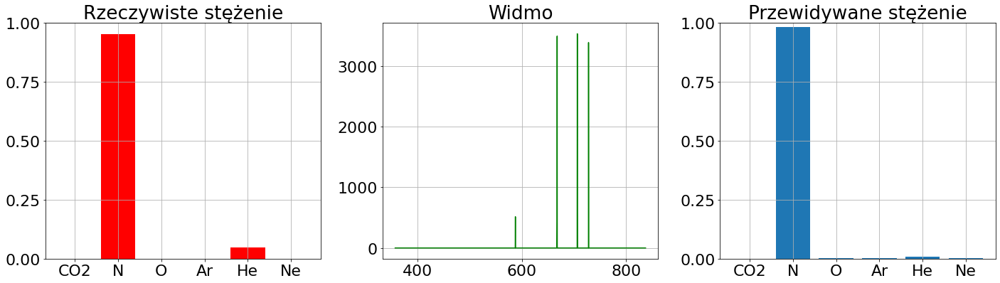

1


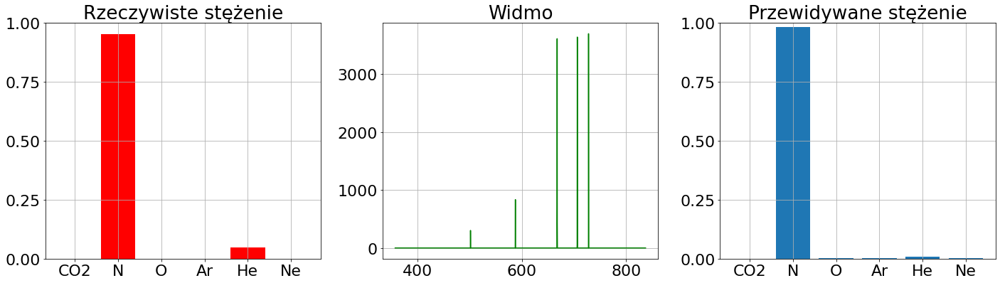

2


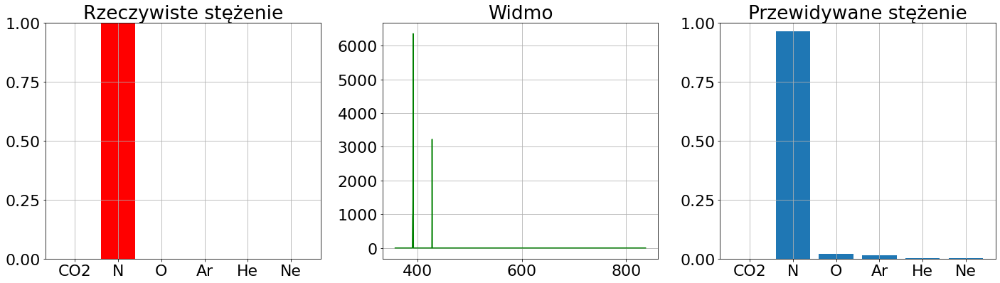

3


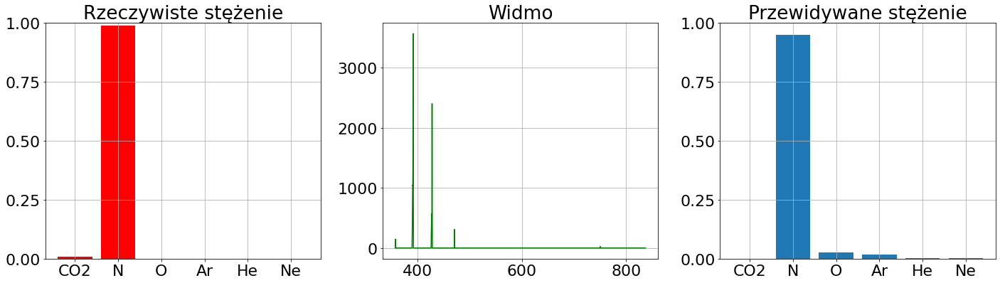

4


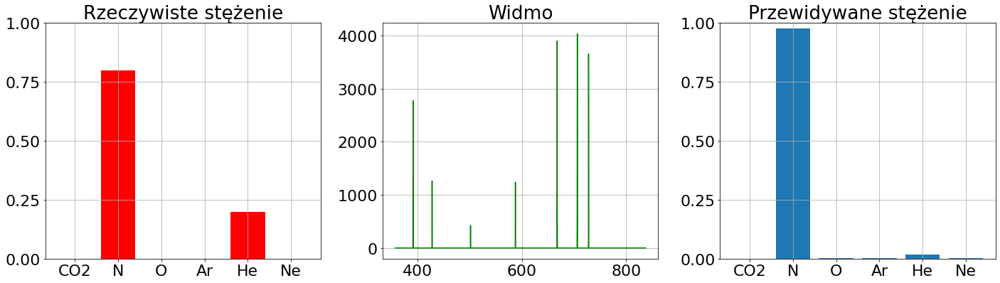

5


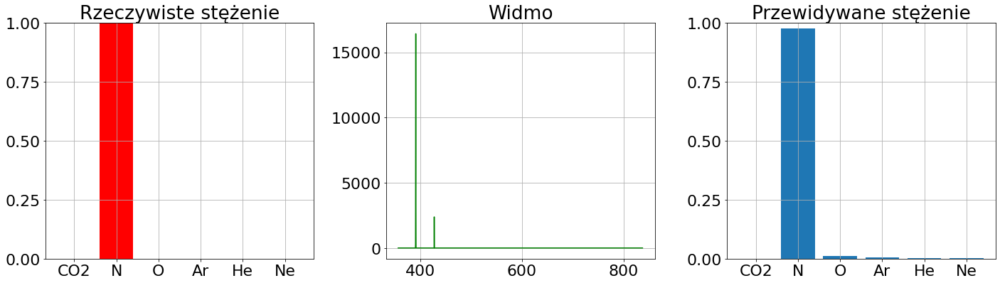

6


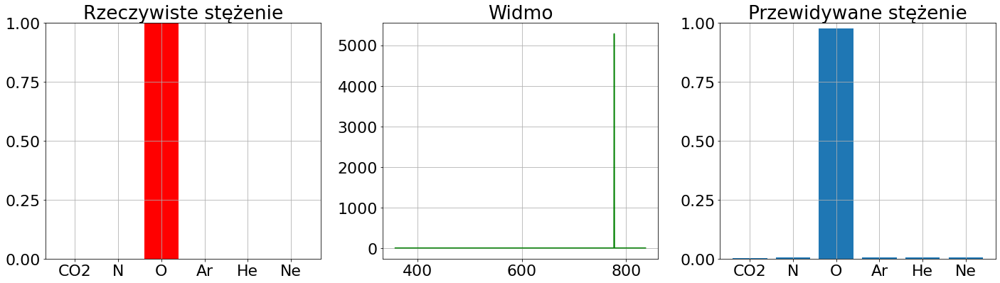

7


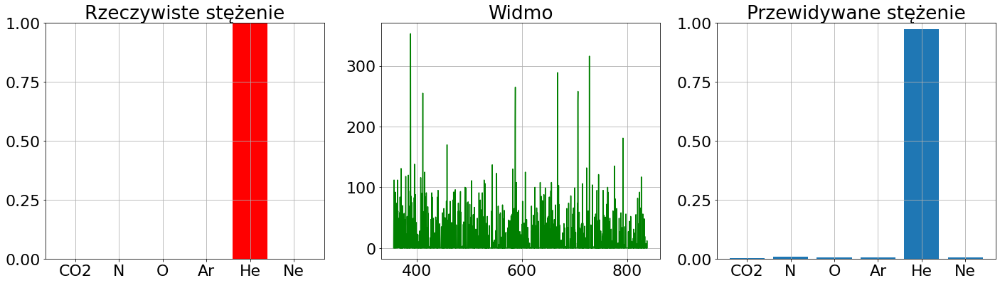

8


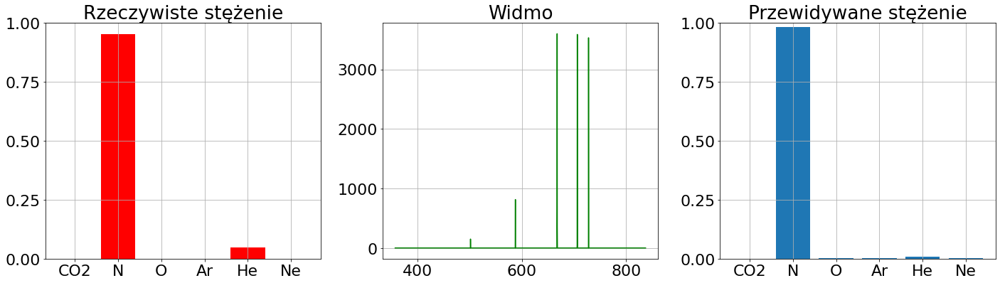

9


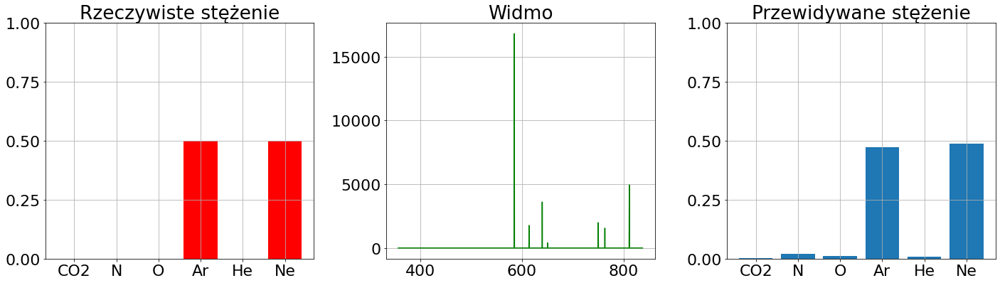

10


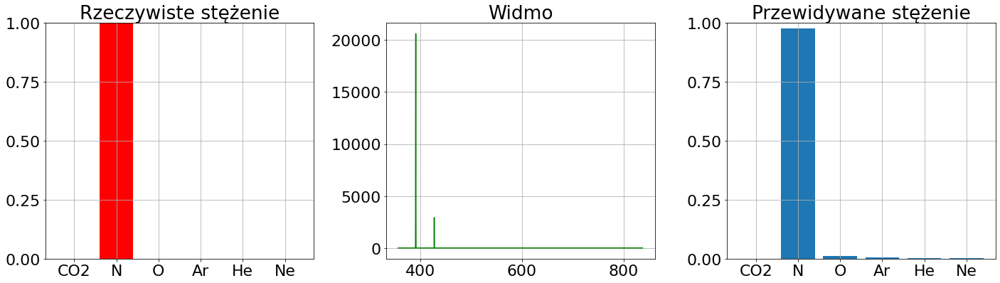

11


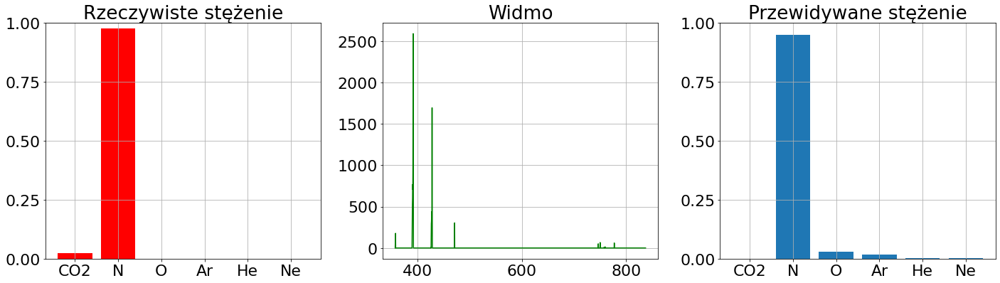

12


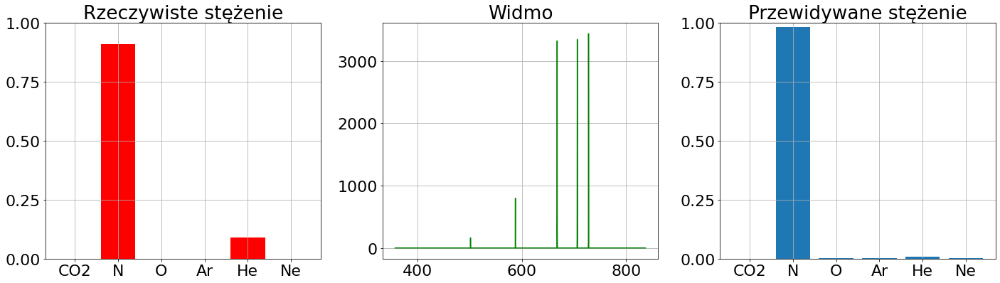

13


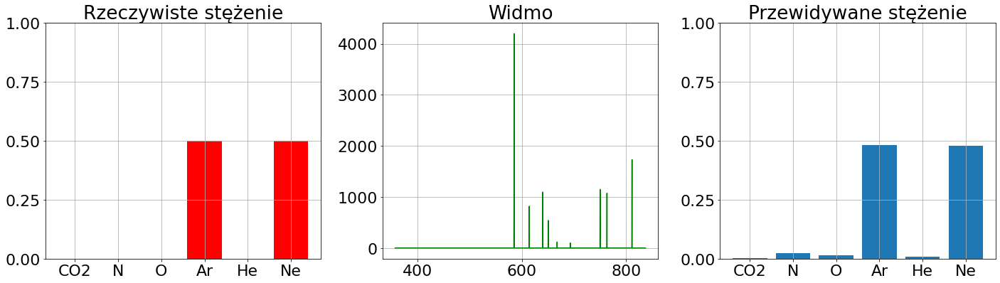

14


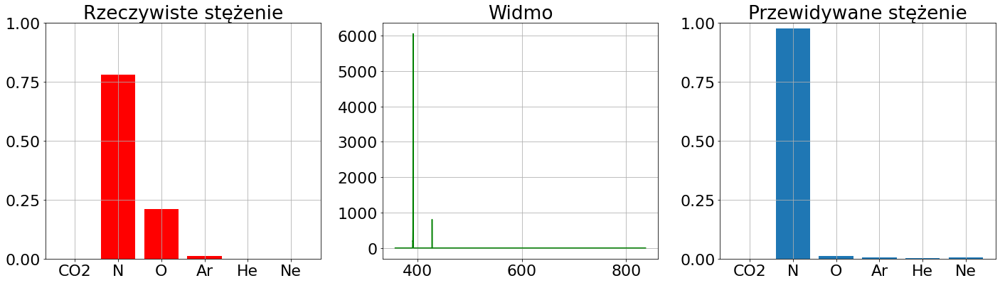

15


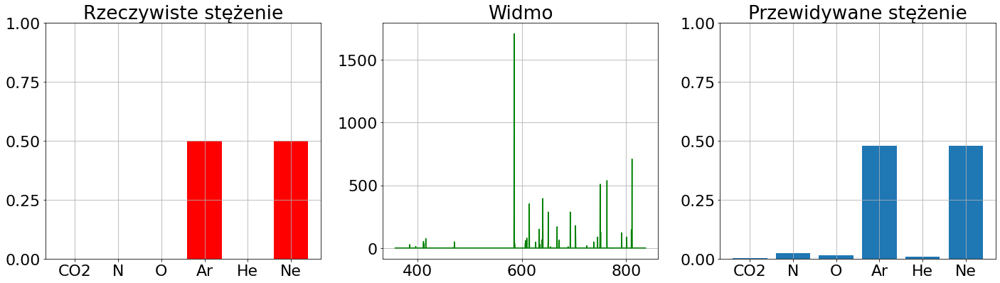

16


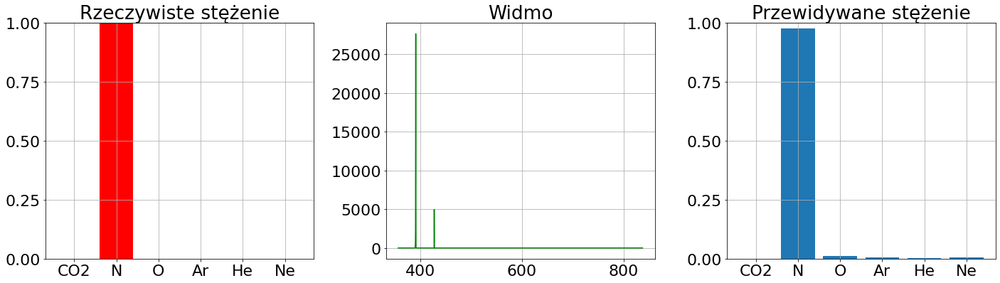

17


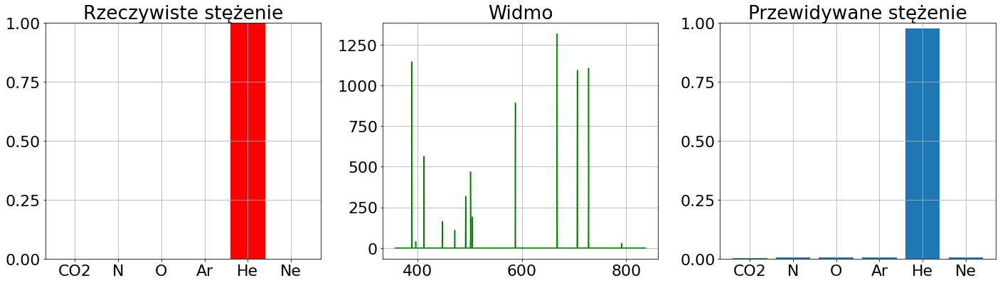

18


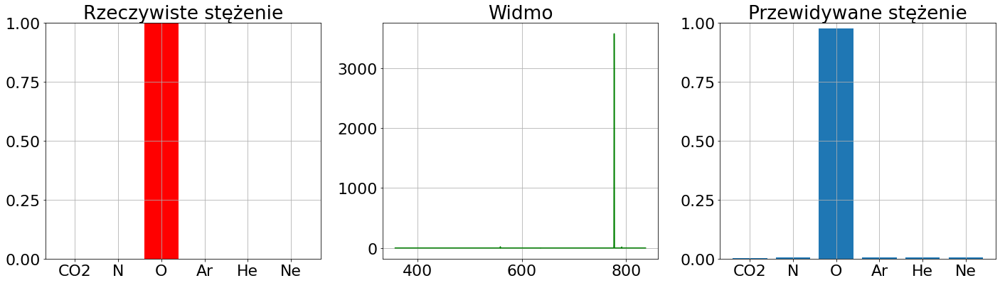

19


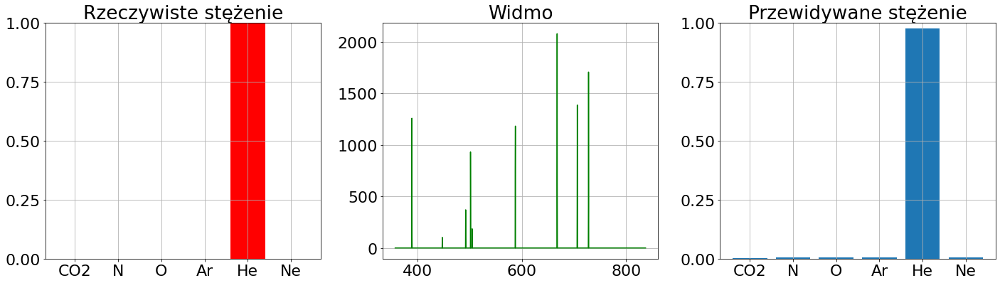

20


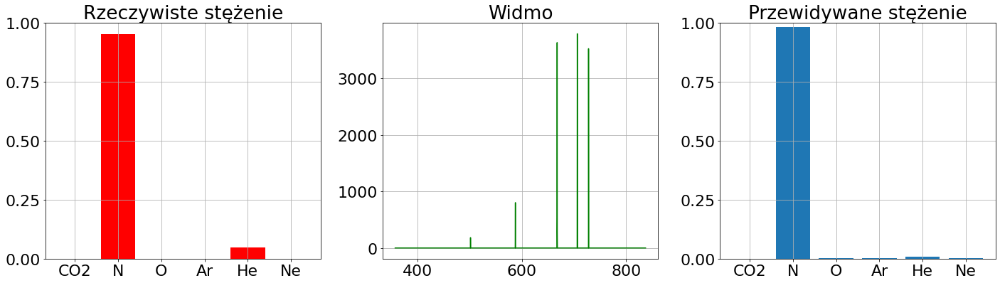

21


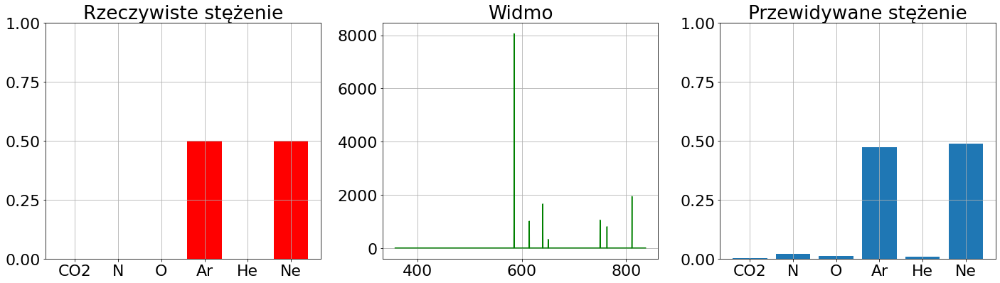

22


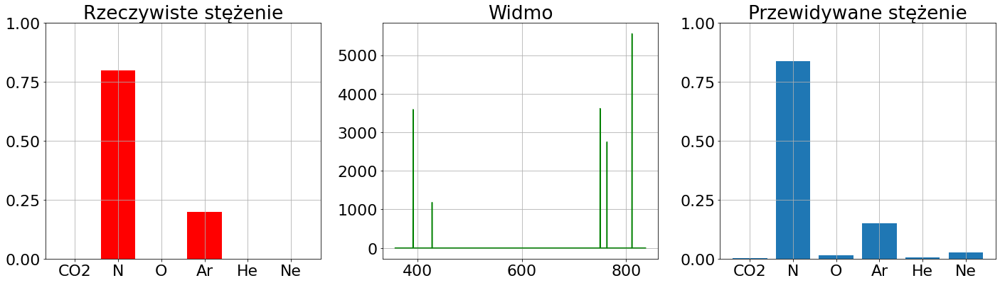

23


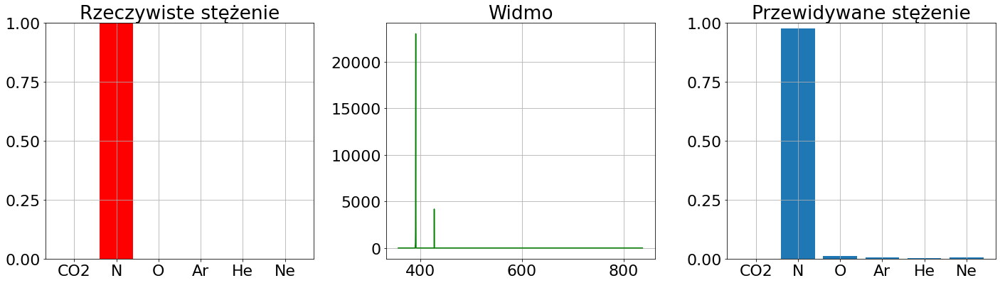

24


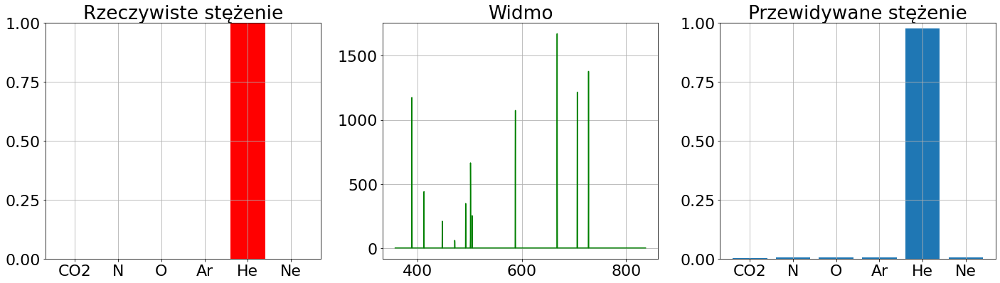

25


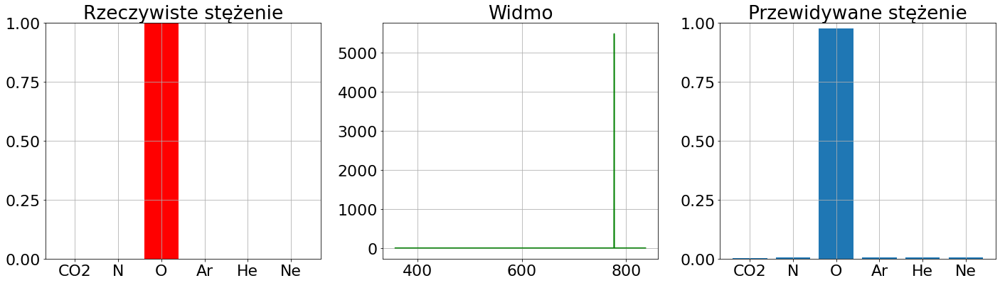

26


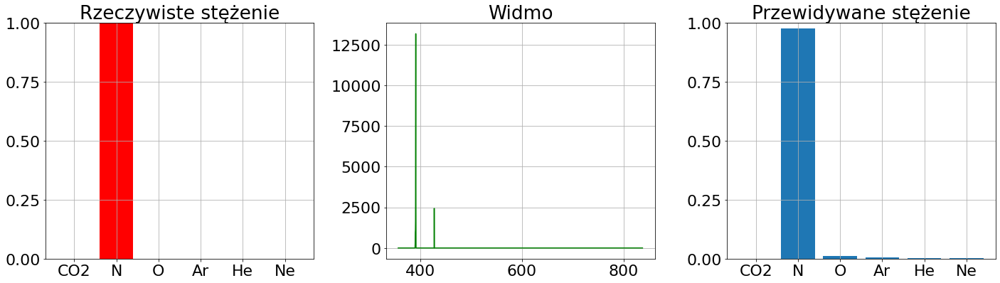

27


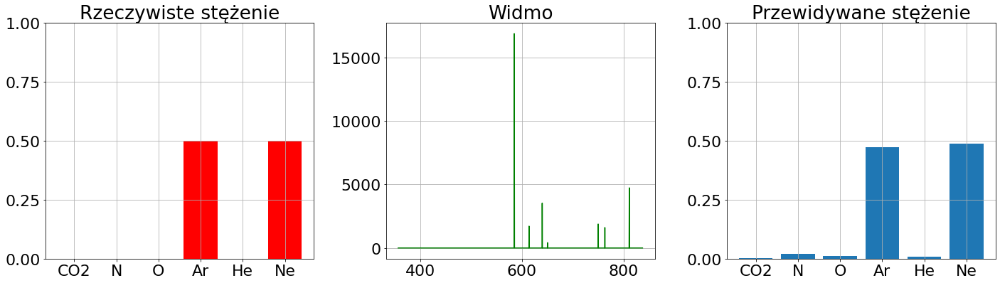

28


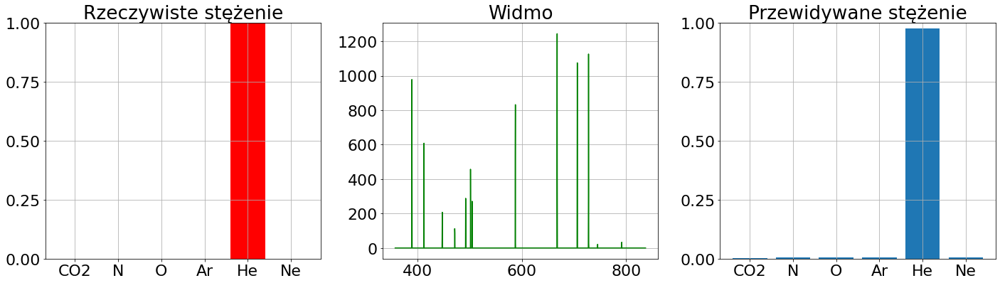

29


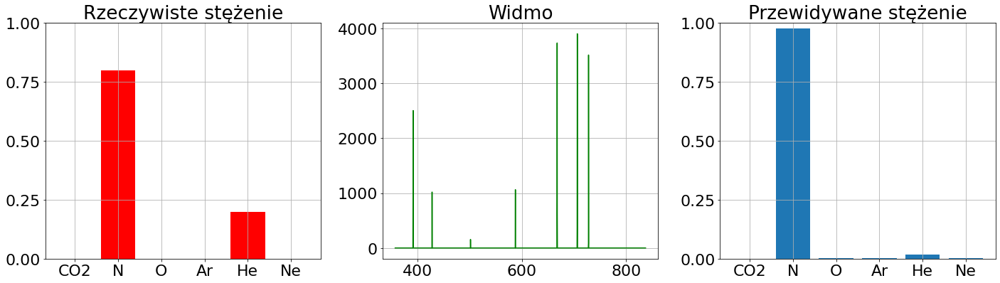

30


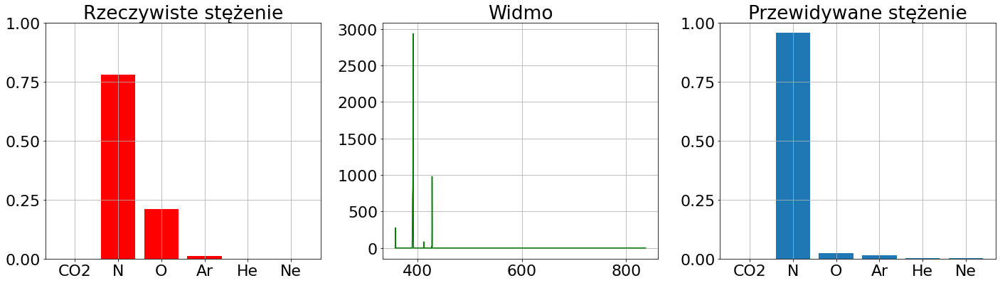

31


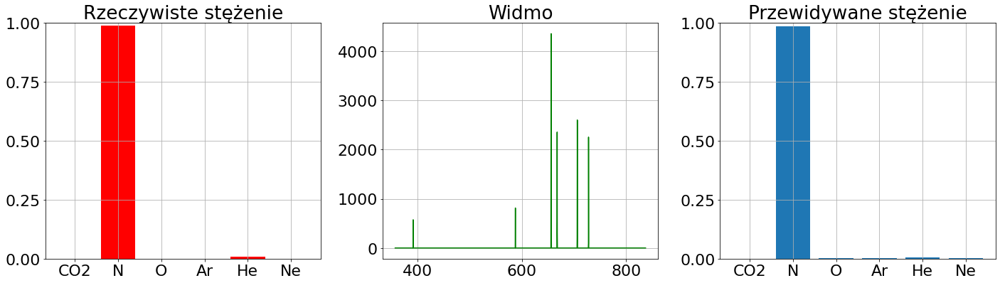

32


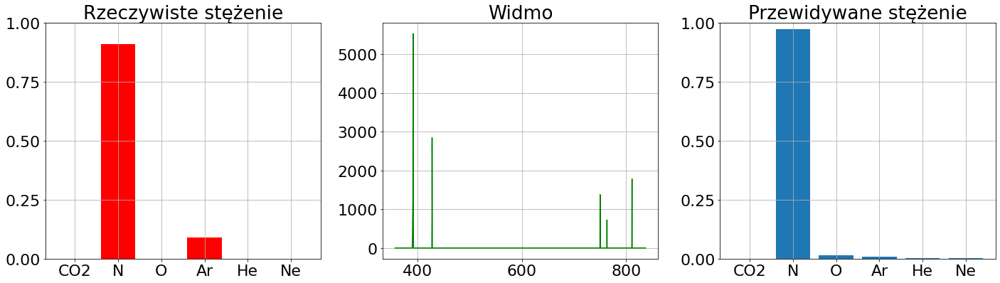

33


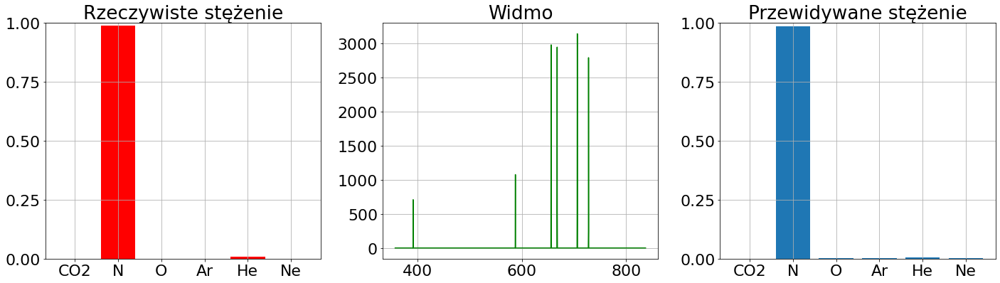

34


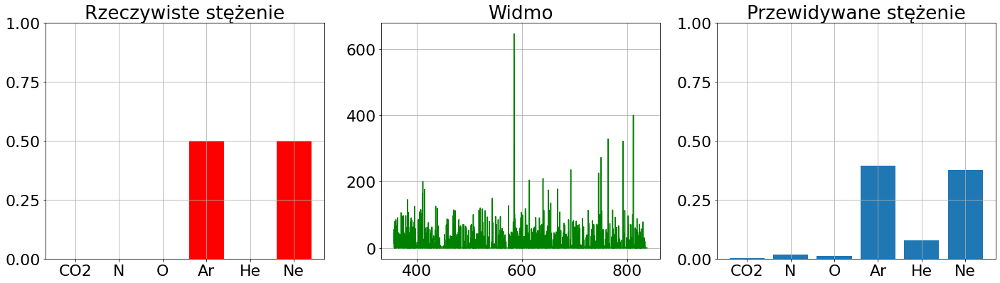

35


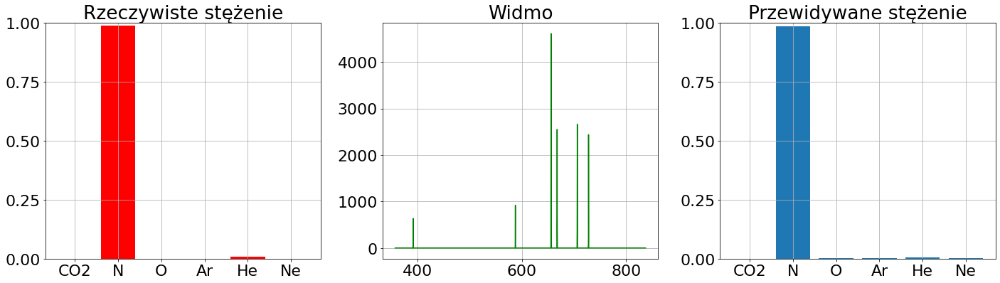

36


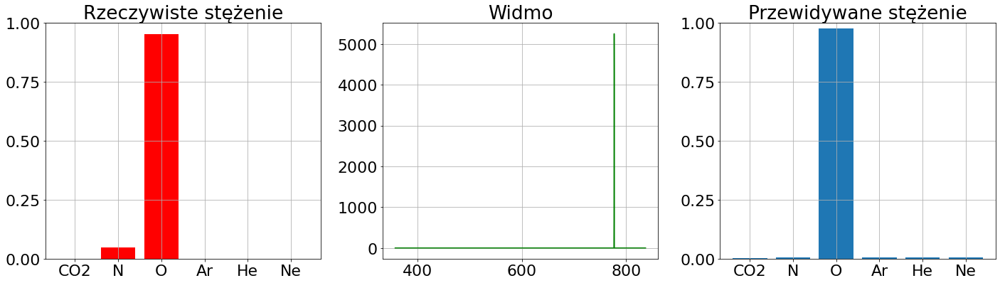

37


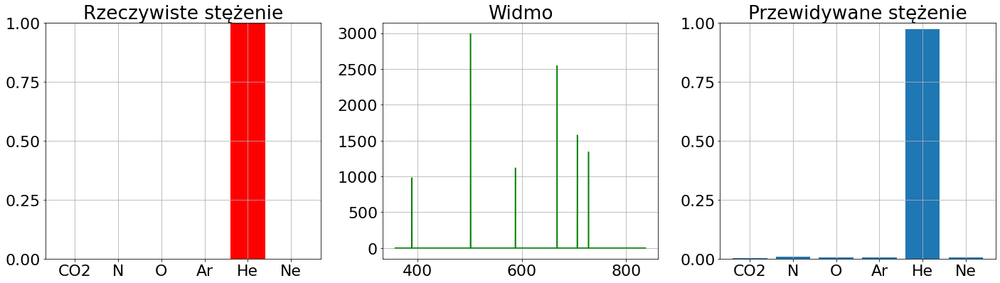

38


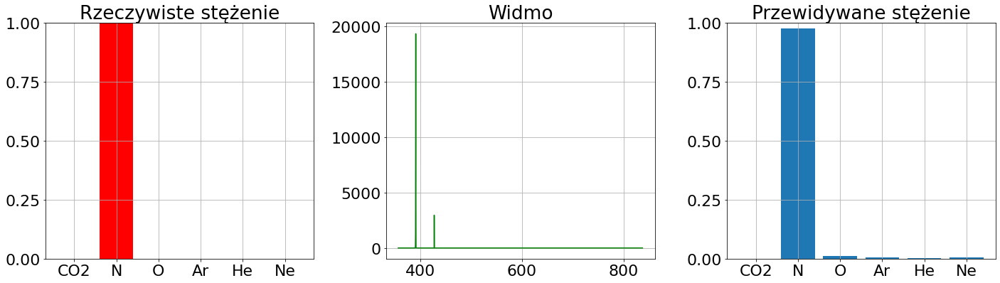

39


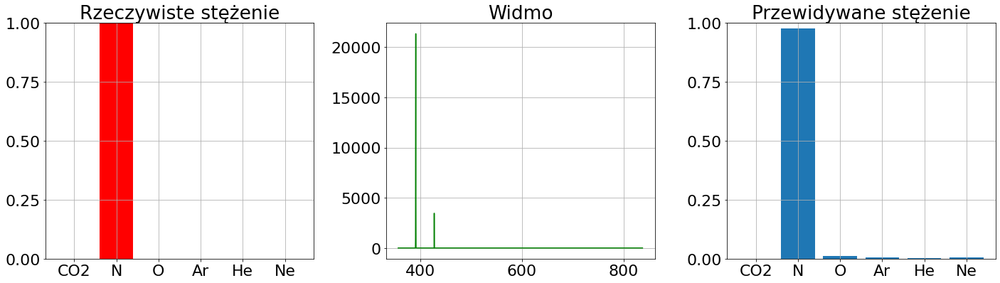

40


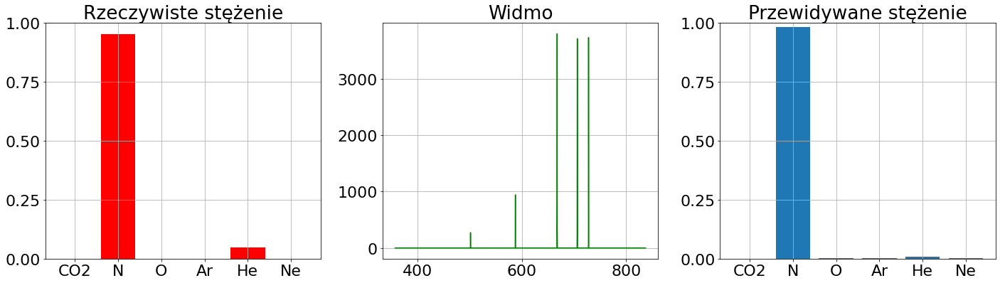

41


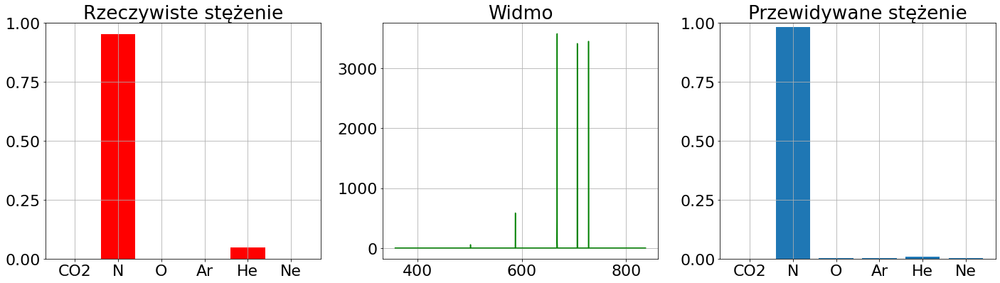

42


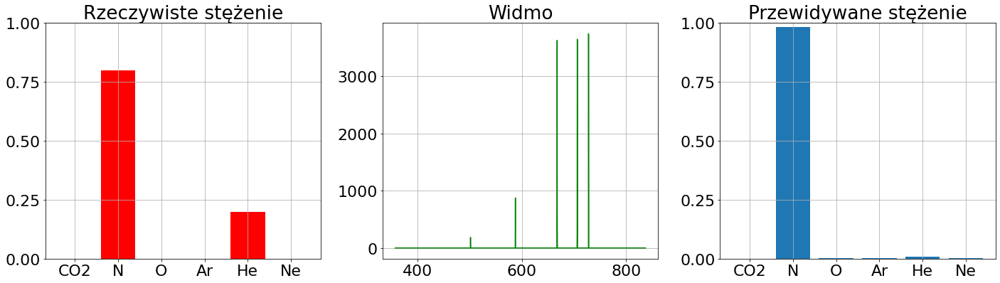

43


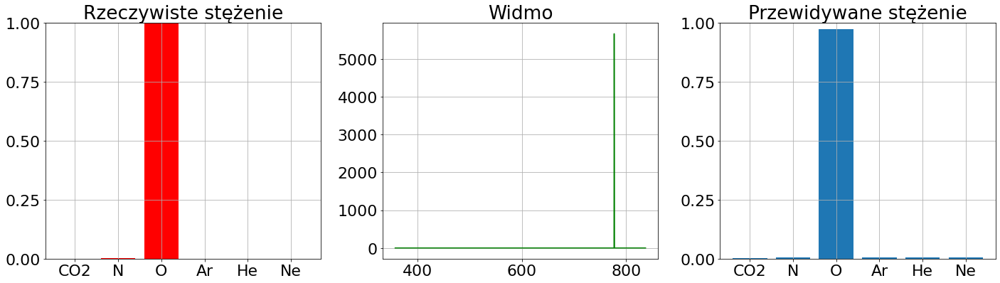

44


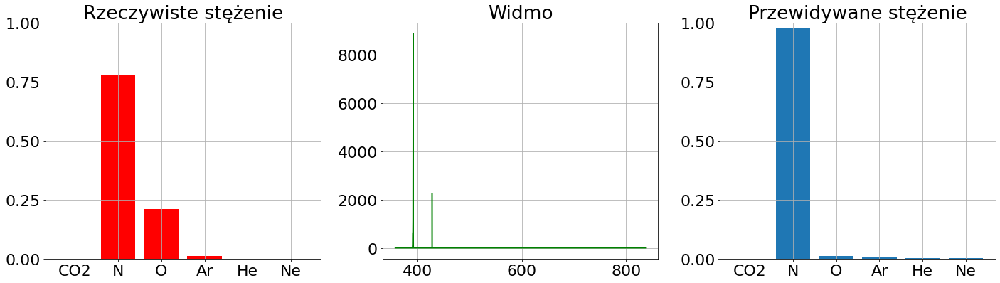

45


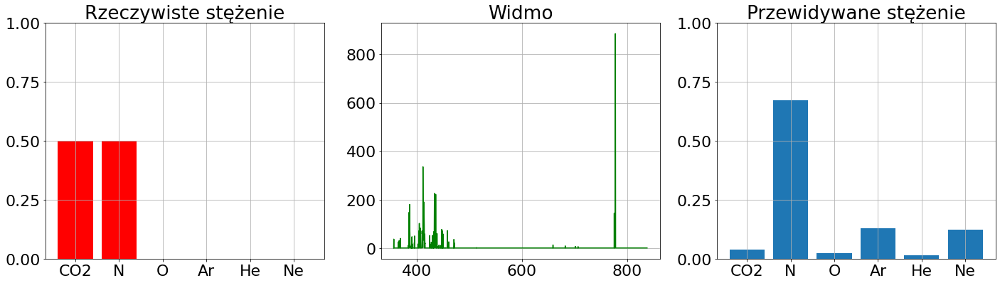

46


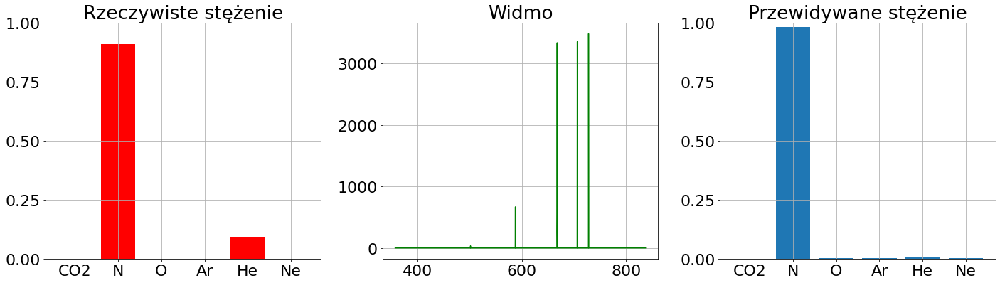

47


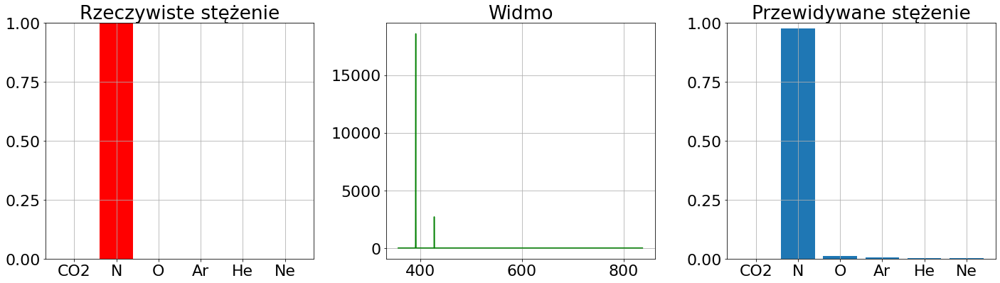

48


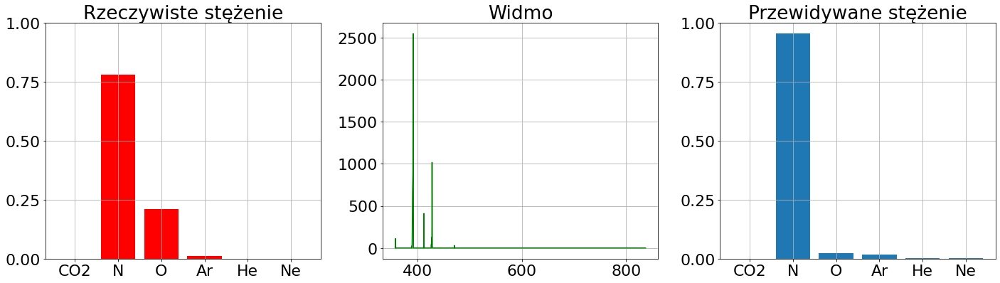

49


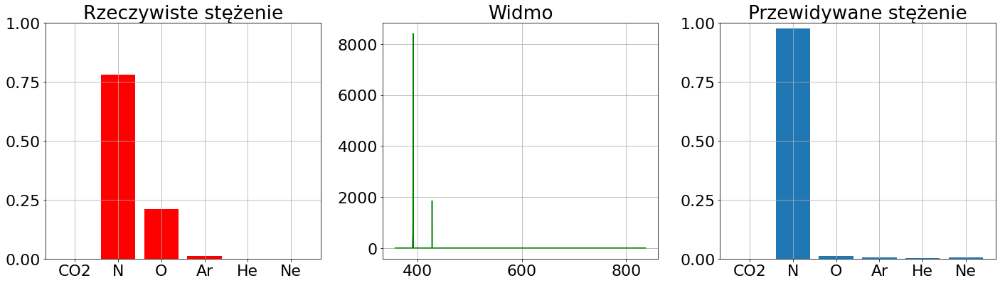

50


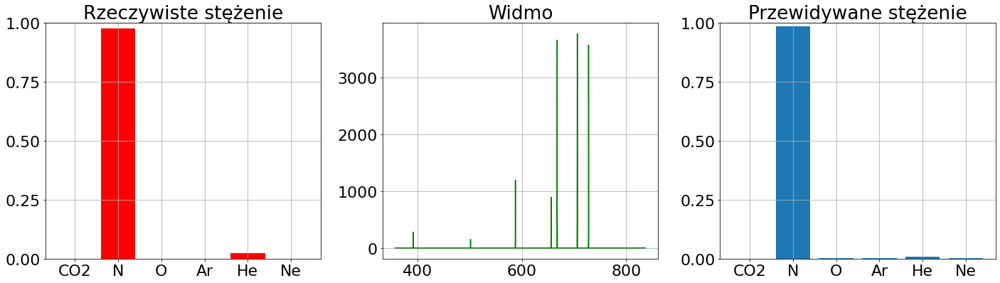

51


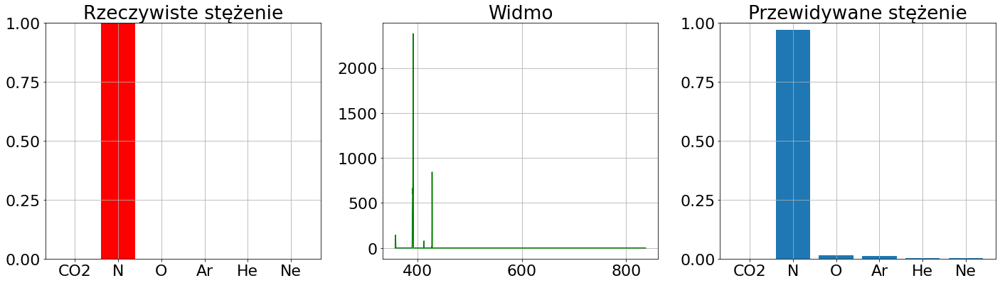

52


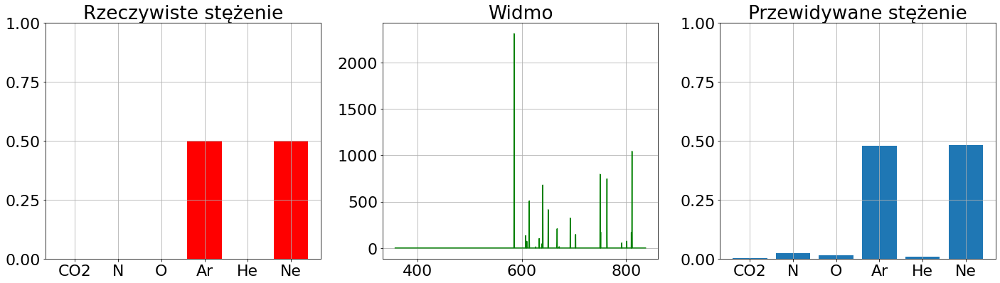

53


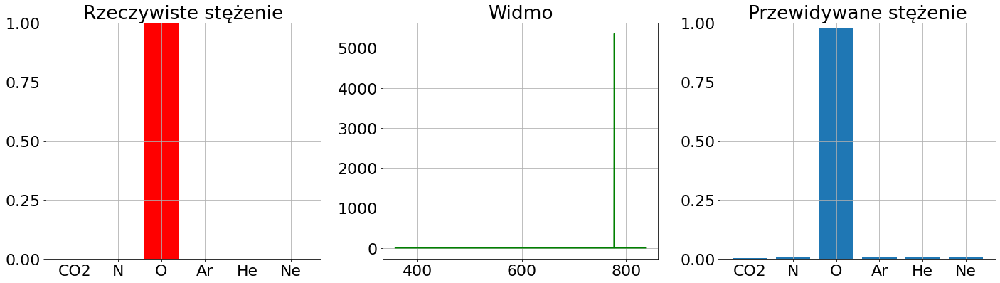

54


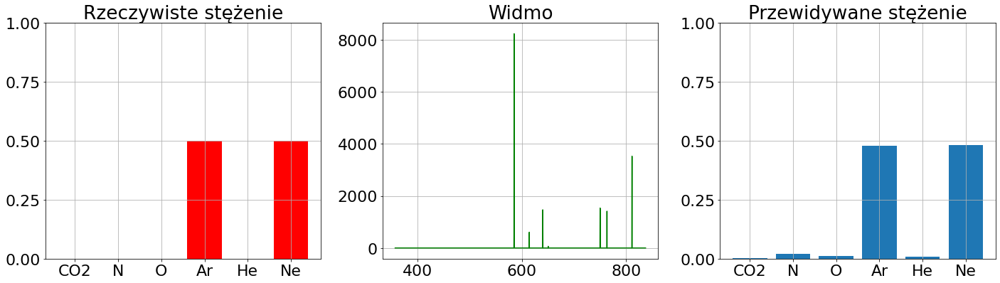

55


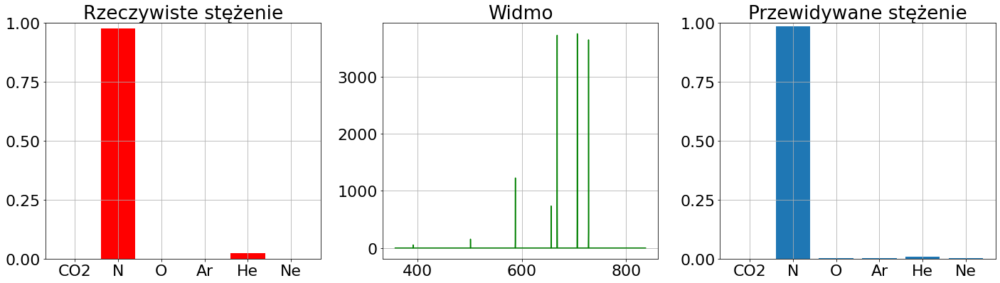

56


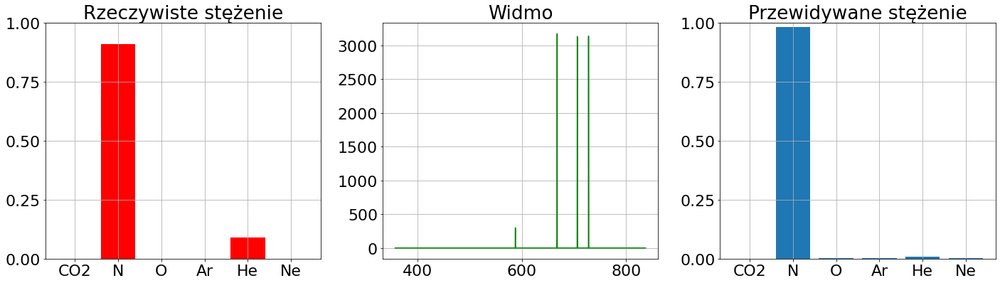

57


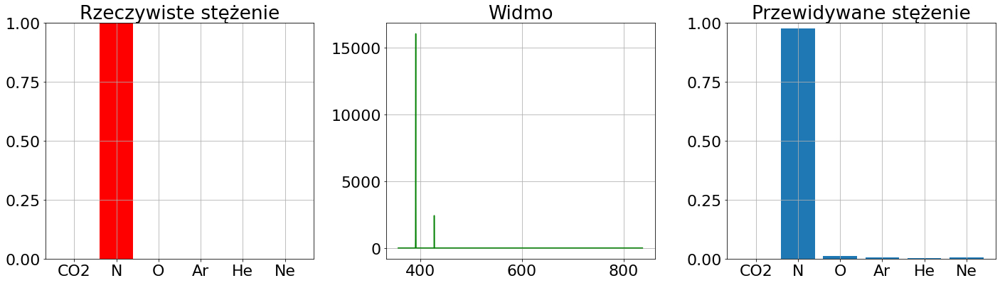

58


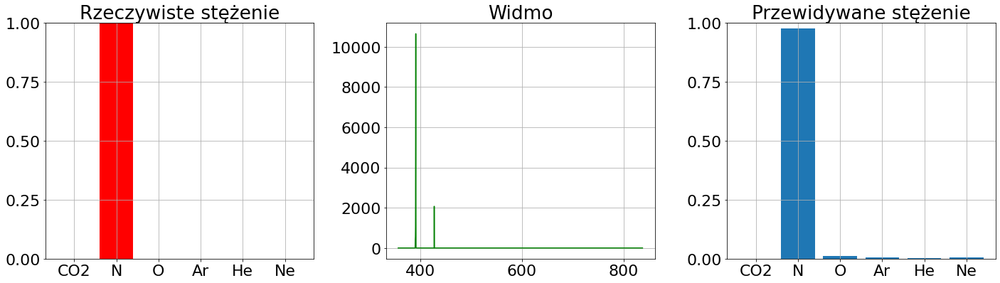

59


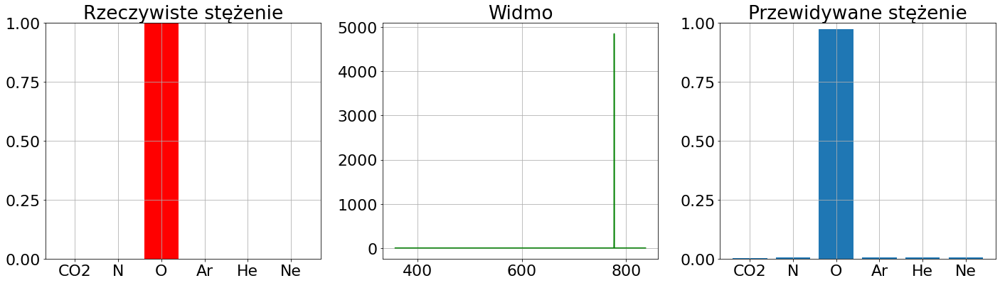

60


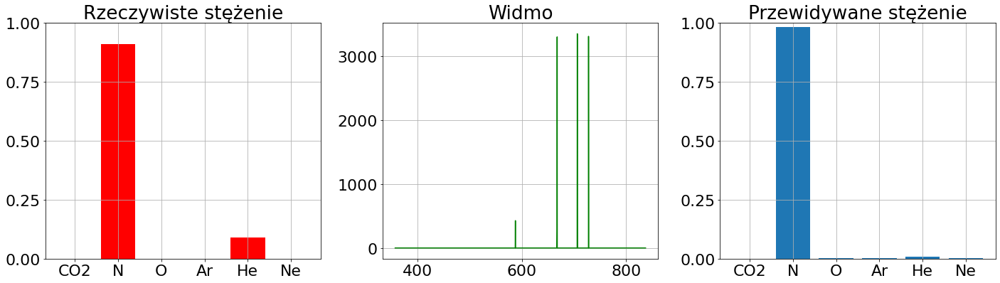

61


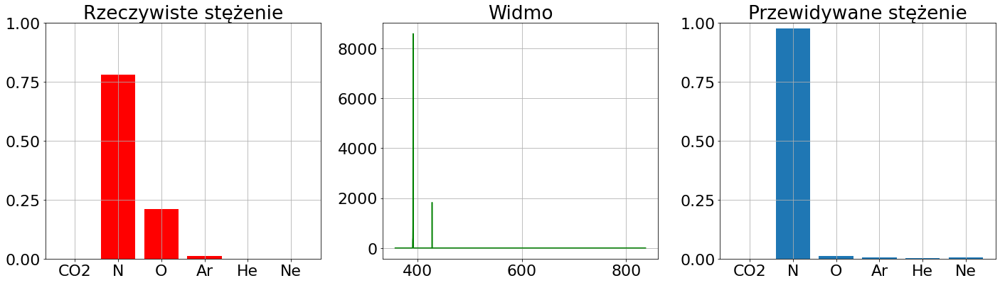

62


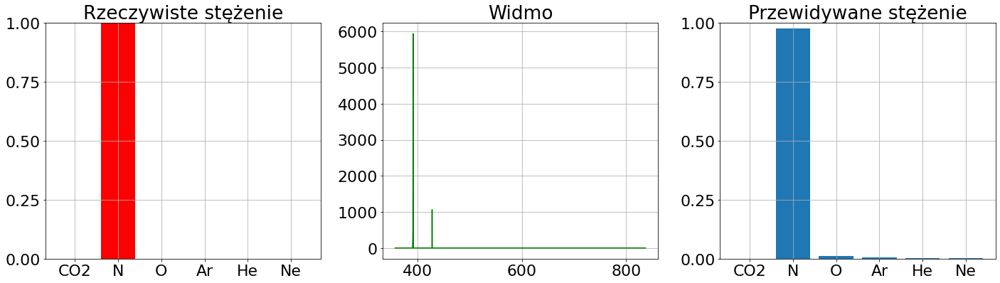

63


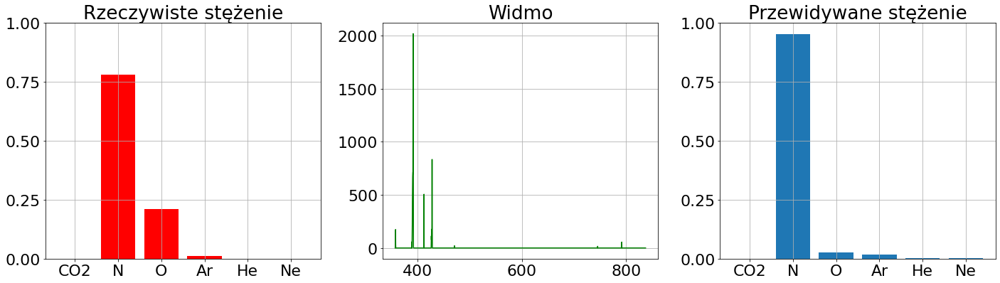

64


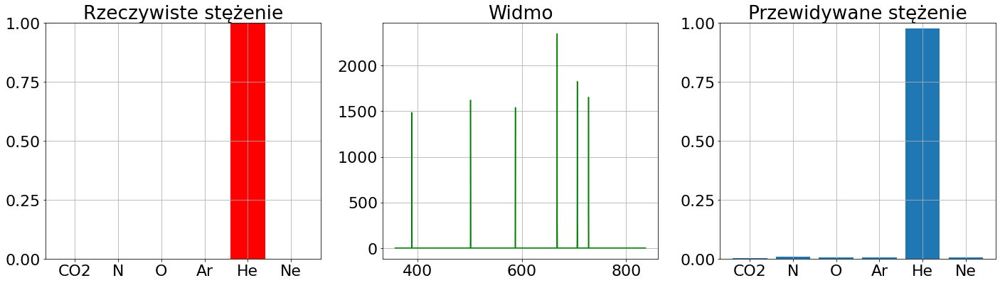

65


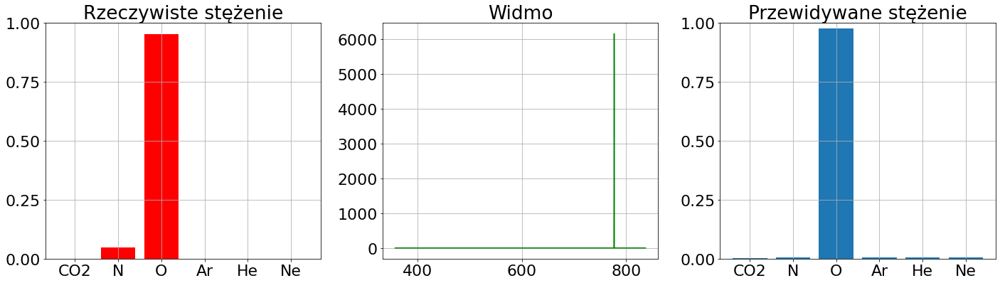

66


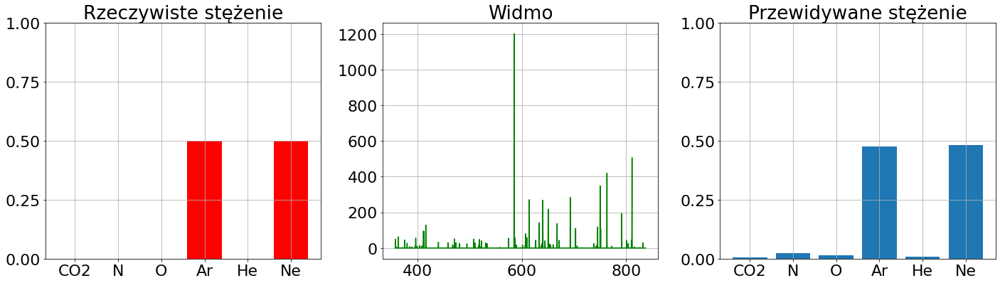

67


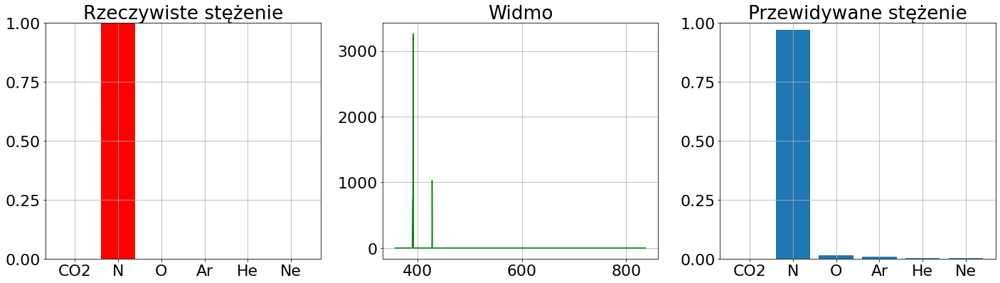

68


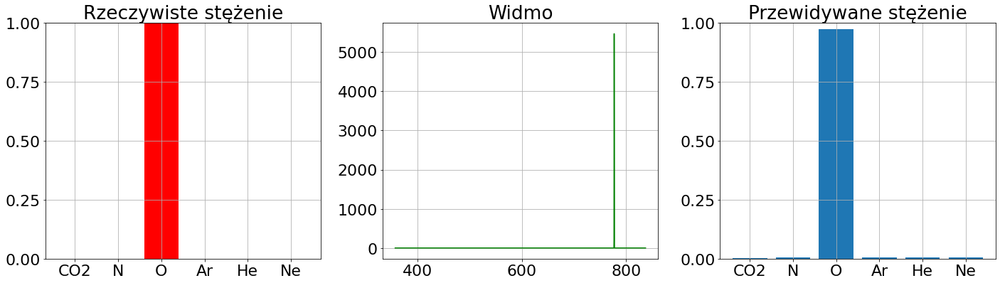

69


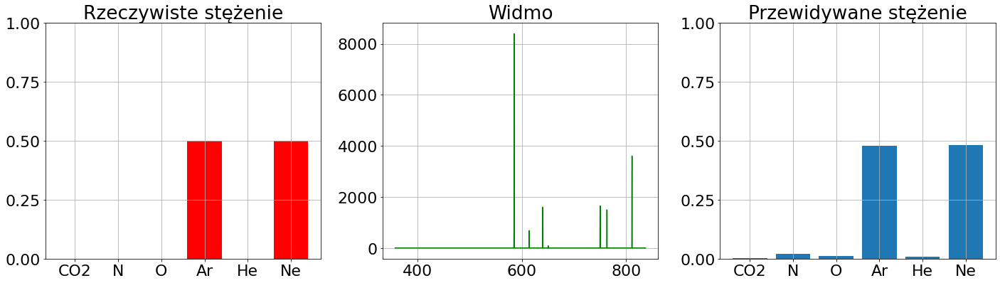

70


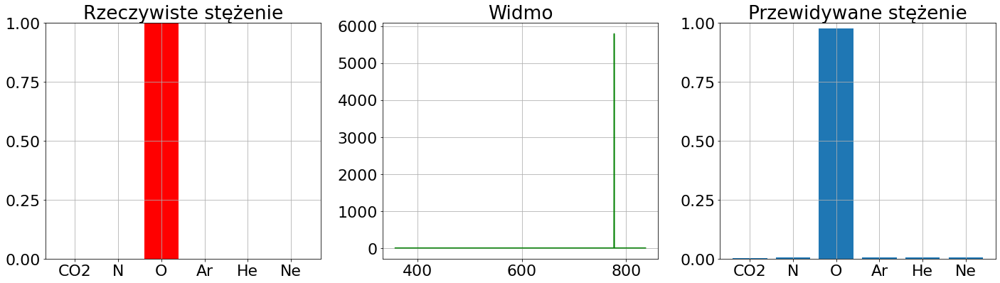

71


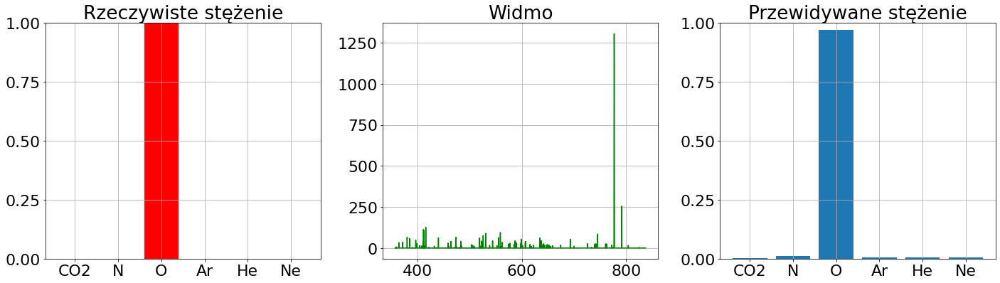

72


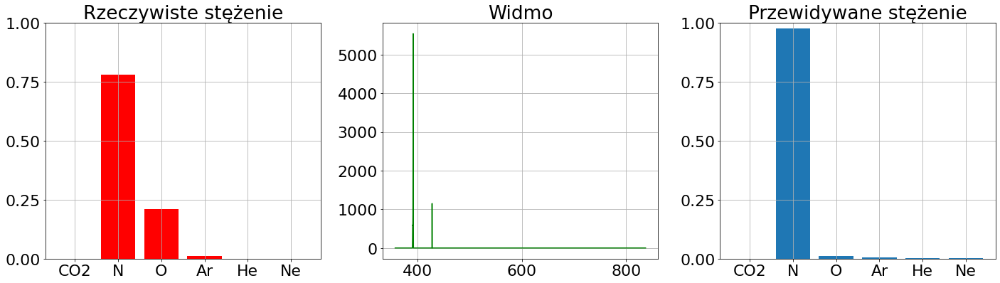

73


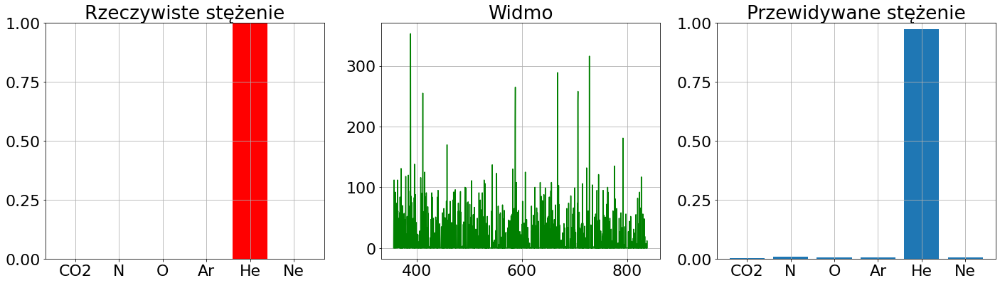

74


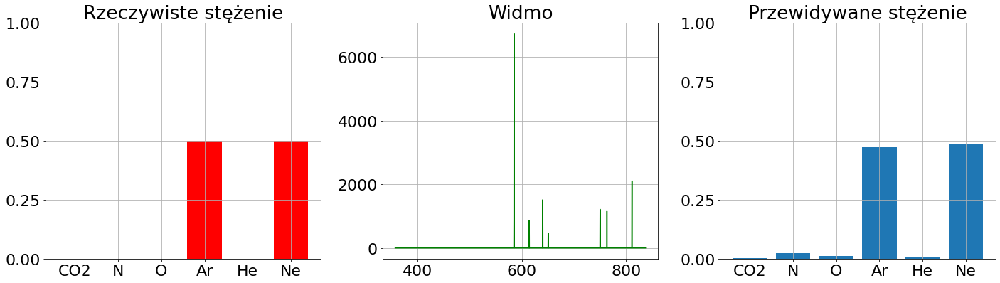

75


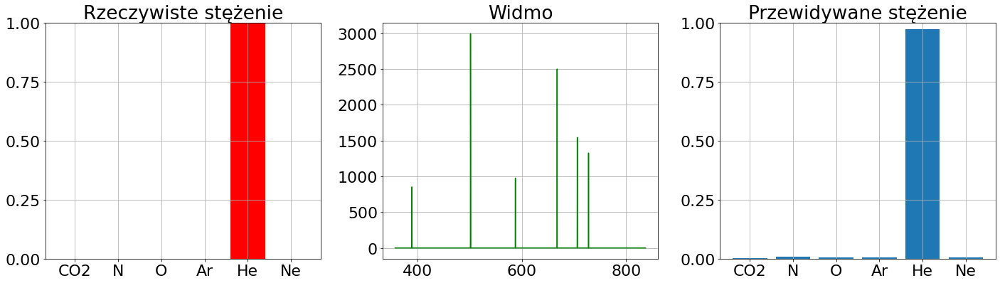

76


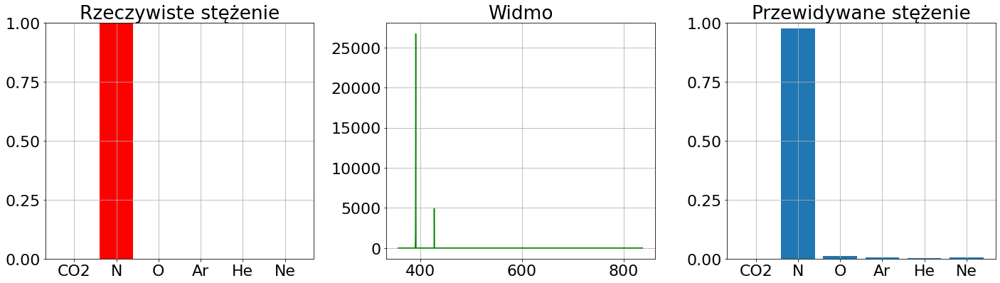

77


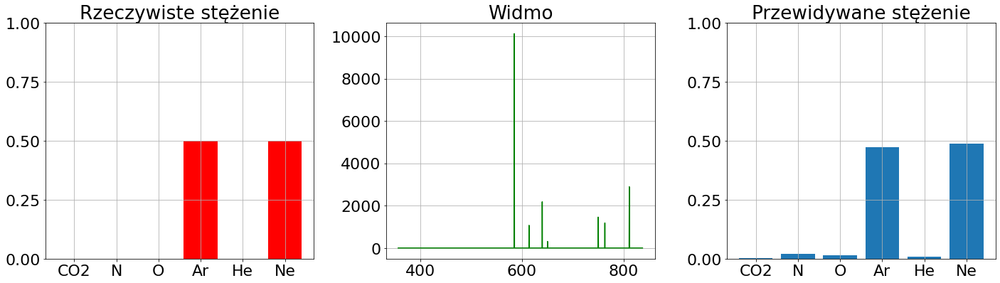

78


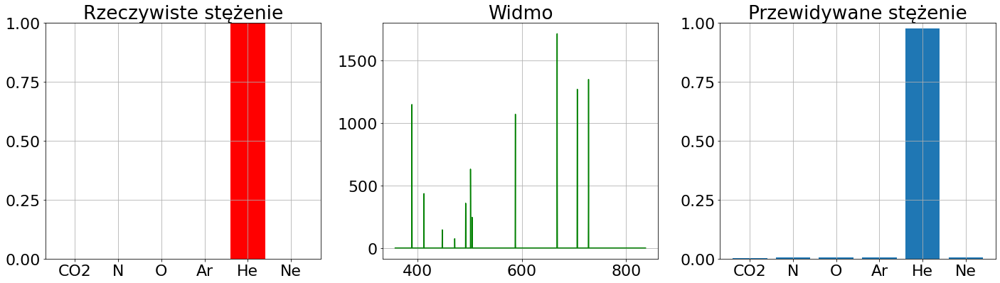

79


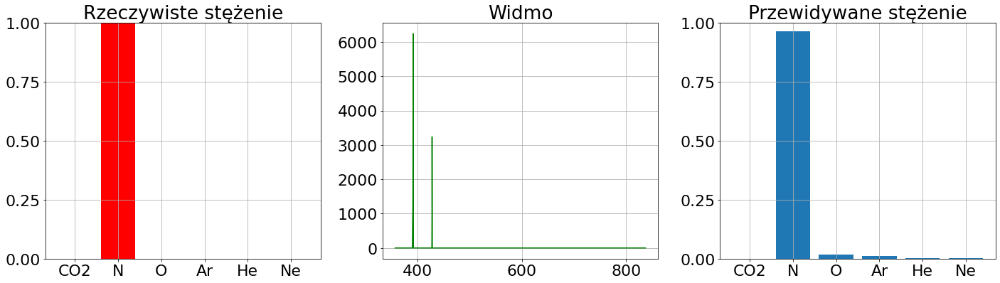

80


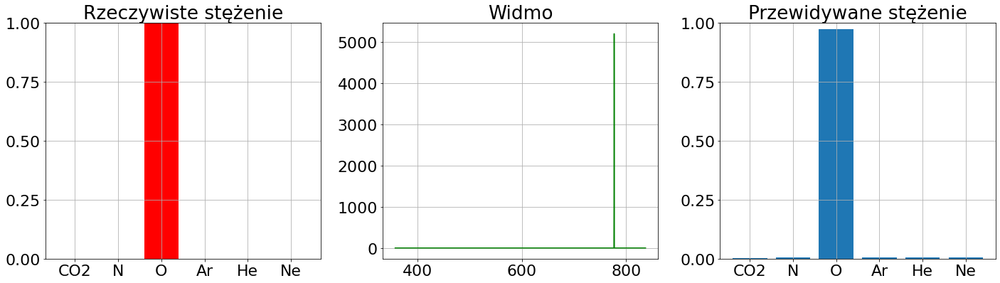

81


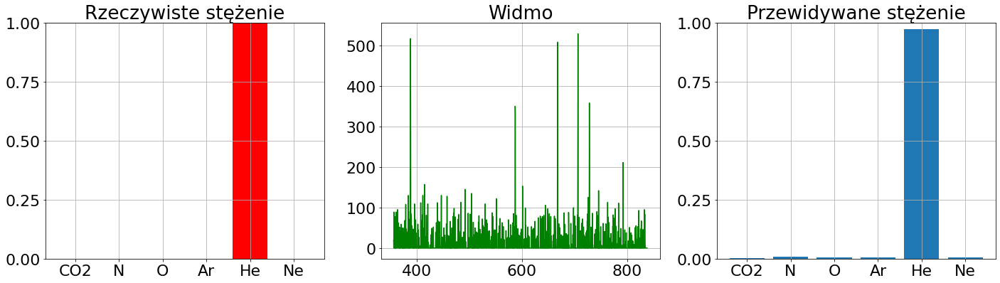

82


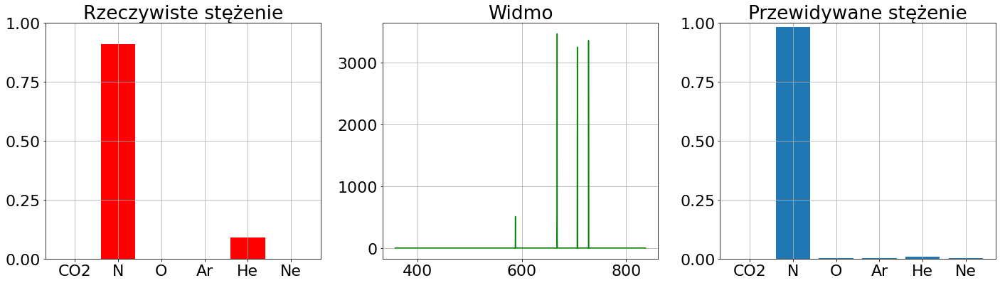

83


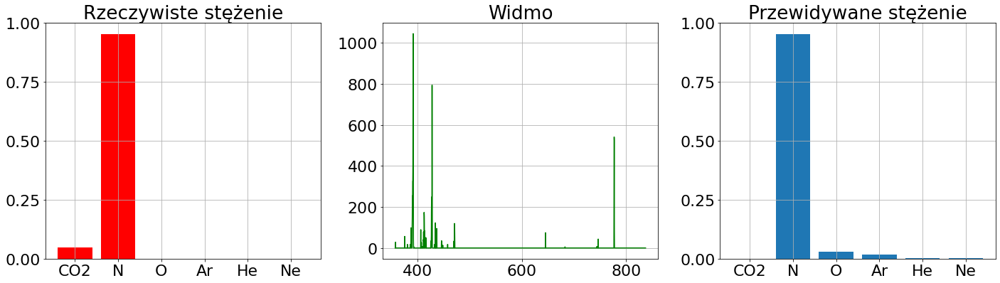

84


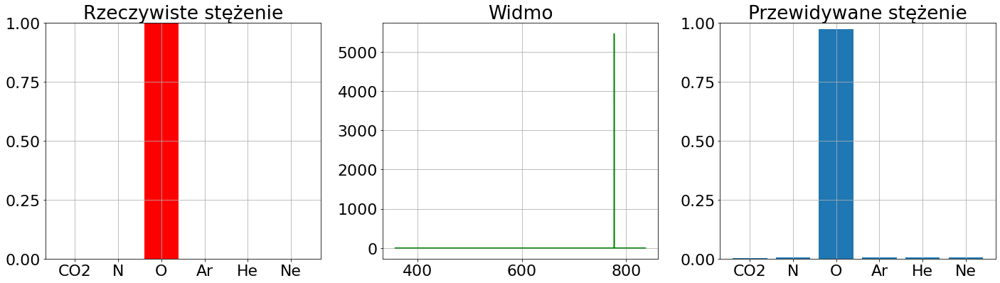

85


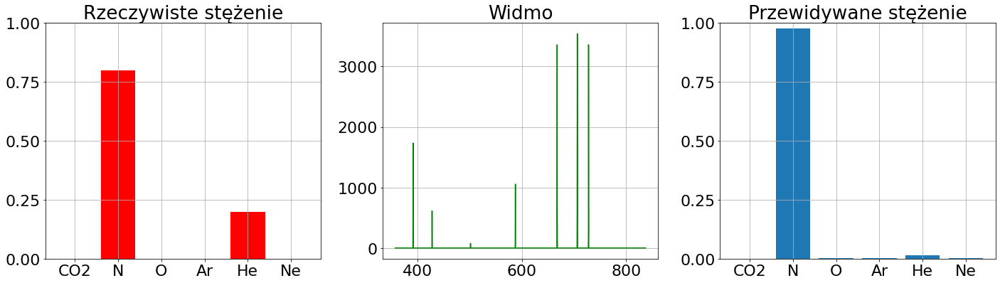

86


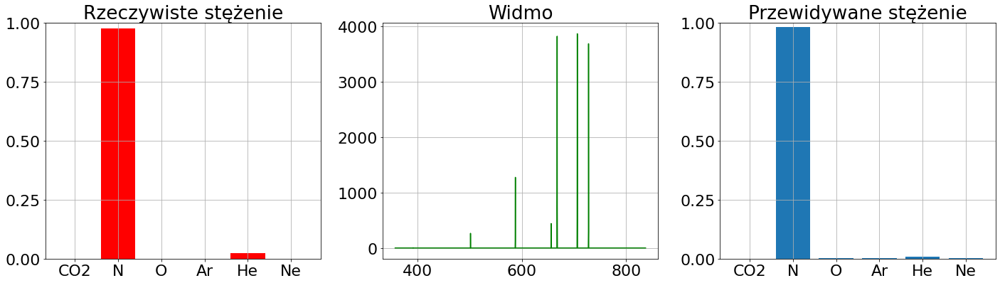

87


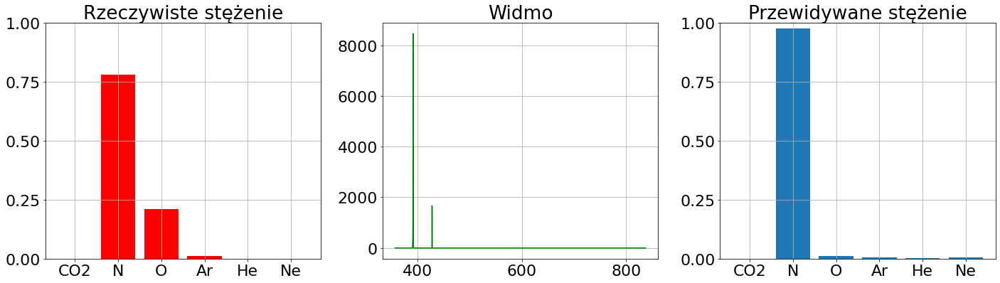

88


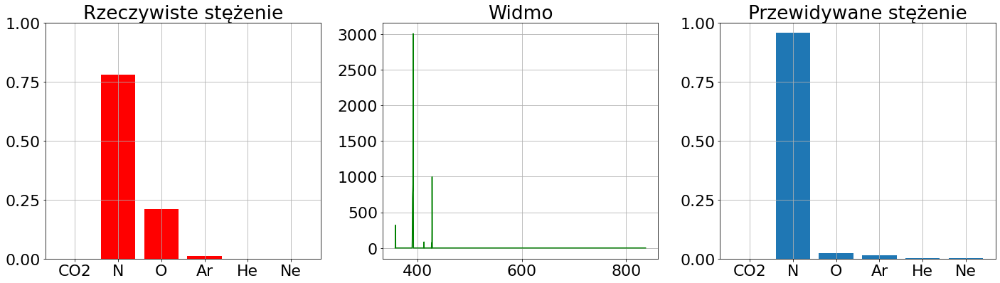

89


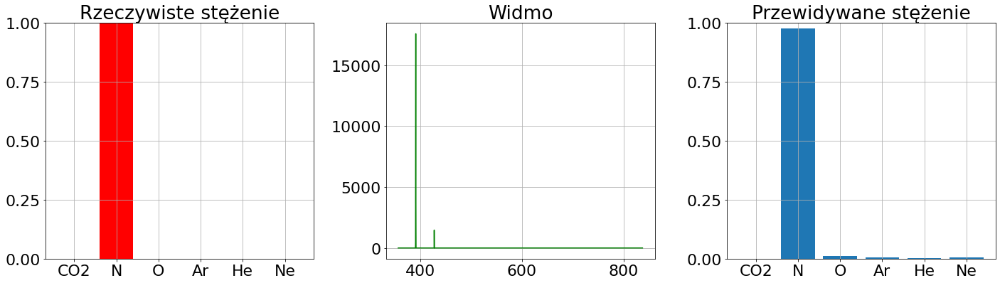

90


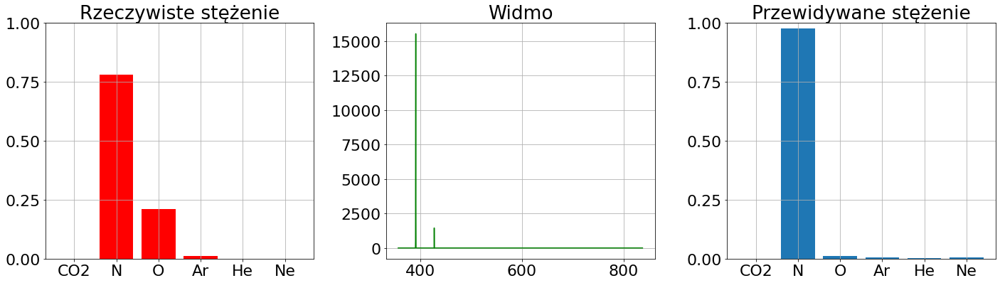

91


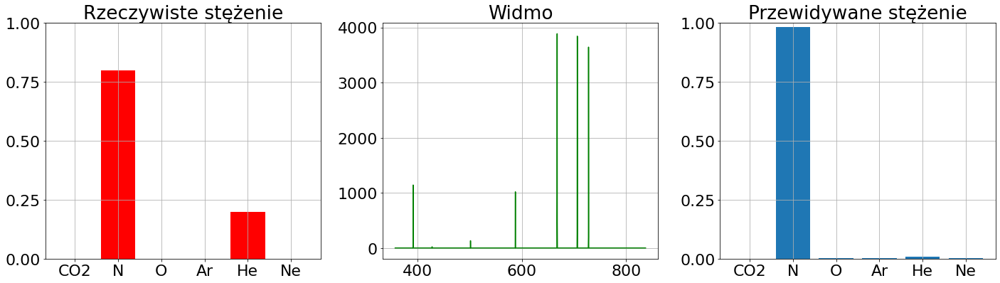

92


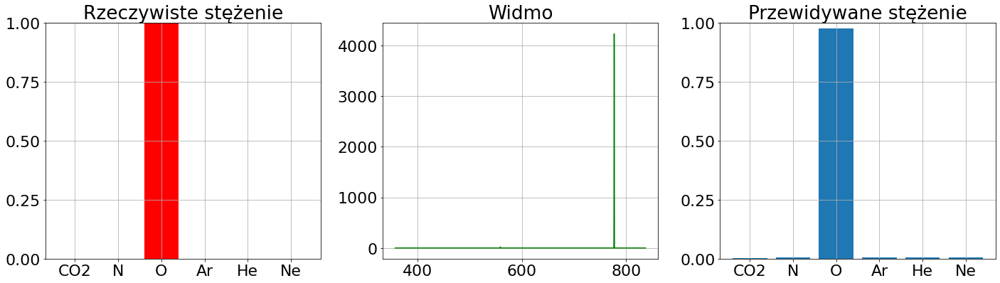

93


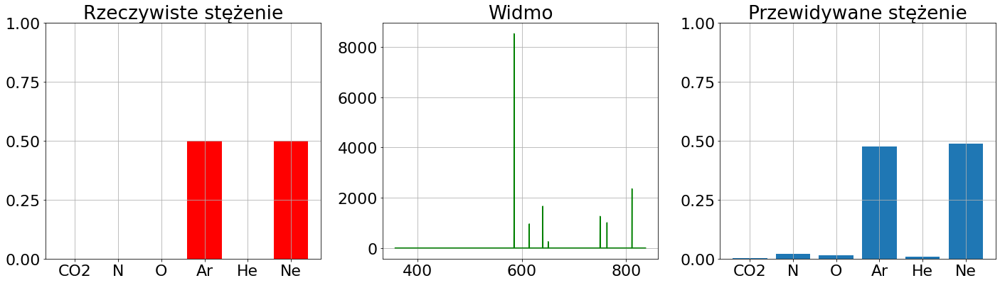

In [337]:
for i in range(94):
    print(i)
    fig = show_predictionsB(hypermodelB, test_spectrums_B, test_concentrations, i)

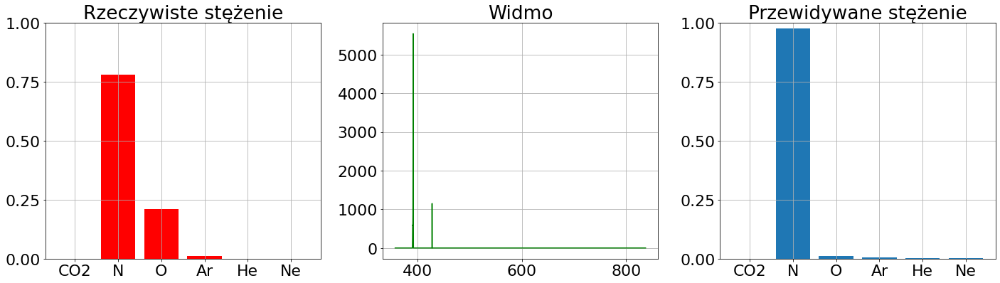

In [361]:
fig = show_predictionsB(hypermodelB, test_spectrums_B, test_concentrations, 72)

In [362]:
fig.savefig('siec_B_przewidywania_blad', dpi=fig.dpi)

In [338]:
modelB.save('siecB.h5')

# 3. Sieć C

## 3.1. Dane

In [8]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
train_pressure = -np.log10(train_data.to_numpy()[:, 1])
train_spectrums_C = np.concatenate([train_data.to_numpy()[:, 0].reshape(-1,1), train_data.to_numpy()[:, 8:]], axis=1)

test_pressure = -np.log10(test_data.to_numpy()[:, 1])
test_spectrums_C = np.concatenate([test_data.to_numpy()[:, 0].reshape(-1,1), test_data.to_numpy()[:, 8:]], axis=1)

## 3.2 Wstępny model

In [171]:
modelC= tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048+1,)),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(128, activation='tanh'),
    tf.keras.layers.Dense(1, activation="relu")
]
)

In [176]:
modelC.compile(loss="mse",
              optimizer=tf.keras.optimizers.SGD(lr=0.001),
              metrics=['mse'])

history = modelC.fit(train_spectrums_C,
                    train_pressure,
                    epochs=100,
                    steps_per_epoch=10,
                    verbose = 2,
                    validation_split = 0.2)

Epoch 1/100
10/10 - 1s - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0606 - val_mse: 0.0606
Epoch 2/100
10/10 - 0s - loss: 0.0196 - mse: 0.0196 - val_loss: 0.0607 - val_mse: 0.0607
Epoch 3/100
10/10 - 0s - loss: 0.0197 - mse: 0.0197 - val_loss: 0.0609 - val_mse: 0.0609
Epoch 4/100
10/10 - 0s - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0613 - val_mse: 0.0613
Epoch 5/100
10/10 - 0s - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0607 - val_mse: 0.0607
Epoch 6/100
10/10 - 0s - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0613 - val_mse: 0.0613
Epoch 7/100
10/10 - 0s - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0606 - val_mse: 0.0606
Epoch 8/100
10/10 - 0s - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0608 - val_mse: 0.0608
Epoch 9/100
10/10 - 0s - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 10/100
10/10 - 0s - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0607 - val_mse: 0.0607
Epoch 11/100
10/10 - 0s - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0604 - val_mse: 0.0604
Epoch 12/100
10/10 

10/10 - 0s - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 93/100
10/10 - 0s - loss: 0.0176 - mse: 0.0176 - val_loss: 0.0602 - val_mse: 0.0602
Epoch 94/100
10/10 - 0s - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 95/100
10/10 - 0s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 96/100
10/10 - 0s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 97/100
10/10 - 0s - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0598 - val_mse: 0.0598
Epoch 98/100
10/10 - 0s - loss: 0.0176 - mse: 0.0176 - val_loss: 0.0612 - val_mse: 0.0612
Epoch 99/100
10/10 - 0s - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 100/100
10/10 - 0s - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0596 - val_mse: 0.0596


In [180]:
pred = modelC.predict(test_spectrums_C)
for i in range(pred.shape[0]):
    print(pred[i,0], test_pressure[i], 0.9 * test_pressure[i] < pred[i,0] < 1.1 * test_pressure[i] )

1.8831453 1.9208187539523751 True
1.9636124 1.9208187539523751 True
1.756118 1.8239087409443189 True
2.0933247 2.0177287669604316 True
1.9164174 1.8239087409443189 True
2.186447 2.3010299956639813 True
2.300957 2.3010299956639813 True
3.0019534 2.769551078621726 True
1.9596461 1.9208187539523751 True
2.2114408 2.3010299956639813 True
2.186447 2.3010299956639813 True
2.1947546 2.0177287669604316 True
1.8923734 1.9100948885606022 True
2.1090946 2.3010299956639813 True
2.1864529 2.3010299956639813 True
2.6922748 3.0 False
2.186447 2.3010299956639813 True
2.3194807 2.3010299956639813 True
2.2987773 2.3010299956639813 True
2.2741349 2.3010299956639813 True
1.8922825 1.9208187539523751 True
2.2114408 2.3010299956639813 True
2.270519 1.8239087409443189 False
2.186447 2.3010299956639813 True
2.5426617 2.3010299956639813 False
2.3323917 2.3010299956639813 True
2.0278304 2.0 True
2.2102153 2.3010299956639813 True
2.1848245 2.3010299956639813 True
2.060543 1.8239087409443189 False
2.2129793 2.301

## 3.3. Optymalizacja

In [52]:
def model_builder_C(hp):
  hp_units1 = hp.Int('units1', min_value=512, max_value=1024, step=2)
  hp_units2 = hp.Int('units2', min_value=32, max_value=512, step=2)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2048+1,)),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(1)])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2 ,1e-3, 1e-4, 1e-5]) 
  model.compile(loss="mse",
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse'])

  return model

In [54]:
tunerC = kt.Hyperband(model_builder_C,
                     objective='val_loss',
                     max_epochs=20,
                     factor=3,
                     directory='tunerC',
                     project_name='siecC')

In [55]:
tunerC.search(train_spectrums_C,
             train_pressure,
             epochs=50,
            steps_per_epoch=10,
             validation_split=0.2,
             callbacks=[stop_learning])

best_hps = tunerC.get_best_hyperparameters(num_trials=1)[0]

Trial 30 Complete [00h 00m 10s]
val_loss: 0.5496638417243958

Best val_loss So Far: 0.04391847550868988
Total elapsed time: 00h 01m 38s
INFO:tensorflow:Oracle triggered exit


In [49]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 776
Liczba neuronów w warstwie 2: 82
Współczynnik uczenia: 0.000100


In [50]:
modelC = tunerC.hypermodel.build(best_hps)
history = modelC.fit(train_spectrums_C,
                    train_pressure,
                    steps_per_epoch=10,
                    epochs=500,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/500
10/10 [==============================] - 1s 45ms/step - loss: 1.4995 - mse: 1.4995 - val_loss: 0.6691 - val_mse: 0.6691
Epoch 2/500
10/10 [==============================] - 0s 15ms/step - loss: 0.4696 - mse: 0.4696 - val_loss: 0.2098 - val_mse: 0.2098
Epoch 3/500
10/10 [==============================] - 0s 23ms/step - loss: 0.2203 - mse: 0.2203 - val_loss: 0.1200 - val_mse: 0.1200
Epoch 4/500
10/10 [==============================] - 0s 19ms/step - loss: 0.0888 - mse: 0.0888 - val_loss: 0.0878 - val_mse: 0.0878
Epoch 5/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0798 - val_mse: 0.0798
Epoch 6/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0302 - mse: 0.0302 - val_loss: 0.0618 - val_mse: 0.0618
Epoch 7/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0550 - val_mse: 0.0550
Epoch 8/500
10/10 [==============================] - 0s 14ms/step - loss: 0.

10/10 [==============================] - 0s 17ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 63/500
10/10 [==============================] - 0s 18ms/step - loss: 0.0112 - mse: 0.0112 - val_loss: 0.0407 - val_mse: 0.0407
Epoch 64/500
10/10 [==============================] - 0s 20ms/step - loss: 0.0093 - mse: 0.0093 - val_loss: 0.0390 - val_mse: 0.0390
Epoch 65/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 66/500
10/10 [==============================] - 0s 20ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 67/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0481 - val_mse: 0.0481
Epoch 68/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0086 - mse: 0.0086 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 69/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0126 

10/10 [==============================] - 0s 15ms/step - loss: 0.0117 - mse: 0.0117 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 124/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0126 - mse: 0.0126 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 125/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 126/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 127/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 128/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 129/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 130/500
10/10 [==============================] - 0s 13ms/step - loss: 

10/10 [==============================] - 0s 14ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0387 - val_mse: 0.0387
Epoch 185/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 186/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 187/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0137 - mse: 0.0137 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 188/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 189/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0115 - mse: 0.0115 - val_loss: 0.0415 - val_mse: 0.0415
Epoch 190/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0106 - mse: 0.0106 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 191/500
10/10 [==============================] - 0s 13ms/step - loss: 

10/10 [==============================] - 0s 16ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 246/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 247/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 248/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 249/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 250/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 251/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 252/500
10/10 [==============================] - 0s 16ms/step - loss: 

10/10 [==============================] - 0s 20ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 307/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 308/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0087 - mse: 0.0087 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 309/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0090 - mse: 0.0090 - val_loss: 0.0283 - val_mse: 0.0283
Epoch 310/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0278 - val_mse: 0.0278
Epoch 311/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0291 - val_mse: 0.0291
Epoch 312/500
10/10 [==============================] - 0s 19ms/step - loss: 0.0078 - mse: 0.0078 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 313/500
10/10 [==============================] - 0s 17ms/step - loss: 

10/10 [==============================] - 0s 16ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 368/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0111 - mse: 0.0111 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 369/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0115 - mse: 0.0115 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 370/500
10/10 [==============================] - 0s 17ms/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 371/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 372/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 373/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 374/500
10/10 [==============================] - 0s 17ms/step - loss: 

10/10 [==============================] - 0s 16ms/step - loss: 0.0115 - mse: 0.0115 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 429/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 430/500
10/10 [==============================] - 0s 12ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0317 - val_mse: 0.0317
Epoch 431/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 432/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 433/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 434/500
10/10 [==============================] - 0s 13ms/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.0317 - val_mse: 0.0317
Epoch 435/500
10/10 [==============================] - 0s 14ms/step - loss: 

10/10 [==============================] - 0s 16ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 490/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0309 - val_mse: 0.0309
Epoch 491/500
10/10 [==============================] - 0s 18ms/step - loss: 0.0104 - mse: 0.0104 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 492/500
10/10 [==============================] - 0s 18ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0309 - val_mse: 0.0309
Epoch 493/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 494/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 495/500
10/10 [==============================] - 0s 14ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 496/500
10/10 [==============================] - 0s 14ms/step - loss: 

In [56]:
hypermodelC = tunerC.hypermodel.build(best_hps)

hypermodelC.fit(test_spectrums_C, test_pressure, epochs=best_epoch, validation_split=0.2)

Epoch 1/291
3/3 [==============================] - 1s 94ms/step - loss: 10.3613 - mse: 10.3613 - val_loss: 2.7566 - val_mse: 2.7566
Epoch 2/291
3/3 [==============================] - 0s 45ms/step - loss: 4.7282 - mse: 4.7282 - val_loss: 3.9876 - val_mse: 3.9876
Epoch 3/291
3/3 [==============================] - 0s 55ms/step - loss: 3.0018 - mse: 3.0018 - val_loss: 1.8844 - val_mse: 1.8844
Epoch 4/291
3/3 [==============================] - 0s 43ms/step - loss: 1.4449 - mse: 1.4449 - val_loss: 1.8503 - val_mse: 1.8503
Epoch 5/291
3/3 [==============================] - 0s 33ms/step - loss: 1.7388 - mse: 1.7388 - val_loss: 1.1366 - val_mse: 1.1366
Epoch 6/291
3/3 [==============================] - 0s 31ms/step - loss: 0.6708 - mse: 0.6708 - val_loss: 0.6664 - val_mse: 0.6664
Epoch 7/291
3/3 [==============================] - 0s 41ms/step - loss: 1.0528 - mse: 1.0528 - val_loss: 0.7597 - val_mse: 0.7597
Epoch 8/291
3/3 [==============================] - 0s 35ms/step - loss: 0.4874 - mse: 0.

3/3 [==============================] - 0s 39ms/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 64/291
3/3 [==============================] - 0s 33ms/step - loss: 0.0117 - mse: 0.0117 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 65/291
3/3 [==============================] - 0s 30ms/step - loss: 0.0146 - mse: 0.0146 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 66/291
3/3 [==============================] - 0s 36ms/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 67/291
3/3 [==============================] - 0s 27ms/step - loss: 0.0134 - mse: 0.0134 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 68/291
3/3 [==============================] - 0s 29ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 69/291
3/3 [==============================] - 0s 25ms/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 70/291
3/3 [==============================] - 0s 35ms/step - loss: 0.0152 - mse: 0.0152 - 

3/3 [==============================] - 0s 46ms/step - loss: 0.0137 - mse: 0.0137 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 126/291
3/3 [==============================] - 0s 34ms/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 127/291
3/3 [==============================] - 0s 42ms/step - loss: 0.0125 - mse: 0.0125 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 128/291
3/3 [==============================] - 0s 25ms/step - loss: 0.0111 - mse: 0.0111 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 129/291
3/3 [==============================] - 0s 23ms/step - loss: 0.0126 - mse: 0.0126 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 130/291
3/3 [==============================] - 0s 32ms/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 131/291
3/3 [==============================] - 0s 32ms/step - loss: 0.0106 - mse: 0.0106 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 132/291
3/3 [==============================] - 0s 30ms/step - loss: 0.0112 - mse: 0.

3/3 [==============================] - 0s 28ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 188/291
3/3 [==============================] - 0s 33ms/step - loss: 0.0095 - mse: 0.0095 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 189/291
3/3 [==============================] - 0s 30ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 190/291
3/3 [==============================] - 0s 36ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 191/291
3/3 [==============================] - 0s 33ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 192/291
3/3 [==============================] - 0s 33ms/step - loss: 0.0109 - mse: 0.0109 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 193/291
3/3 [==============================] - 0s 32ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 194/291
3/3 [==============================] - 0s 41ms/step - loss: 0.0104 - mse: 0.

3/3 [==============================] - 0s 36ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 250/291
3/3 [==============================] - 0s 32ms/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 251/291
3/3 [==============================] - 0s 28ms/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 252/291
3/3 [==============================] - 0s 31ms/step - loss: 0.0100 - mse: 0.0100 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 253/291
3/3 [==============================] - 0s 29ms/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 254/291
3/3 [==============================] - 0s 38ms/step - loss: 0.0117 - mse: 0.0117 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 255/291
3/3 [==============================] - 0s 32ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 256/291
3/3 [==============================] - 0s 31ms/step - loss: 0.0099 - mse: 0.

Ewaluacja liczby poprawnie rozponanych ciśnień

In [279]:
pressure_test =(0.80 * test_pressure.reshape(-1,1) < pred[i,0].reshape(-1,1)) &(  pred[i,0].reshape(-1,1)< 1.2 * test_pressure[i])

In [280]:
print("Liczba poprawnie rozponanych ciśnień", pressure_test.sum(), "Liczba wzorców testowych :", pressure_test.shape[0])

Liczba poprawnie rozponanych ciśnień 92 Liczba wzorców testowych : 94


In [60]:
hypermodelC.save('siecC.h5')